<hr style='border:2px solid #460073'> </hr>
<h1 style='color: #460073'>Исследование поведения аудитории: 1. </h1> 
<hr style='border:2px solid #460073'> </hr>
<h3 style='color: #460073'>Автор: </h3> 

* Бессонов Евгений  
* [Адрес в телеграмм](https://t.me/EMskv "t.me/EMskv")  
* [Портфолио с JupiterNotebook проекта](https://github.com/evgeniy-yandex/Data_Science "github")
    
<hr style='border:2px solid #460073'> </hr>
<h1 style='color: #460073'>Описание проекта. </h1> 
<hr style='border:2px solid #460073'> </hr>
<h3 style='color: #460073'>Описание данных. </h3> 

Для работы получены 4 файла:

1. `Daily_Duration.xlsx`
2. `Daily_Attention.xlsx`
3. `Daily_Reach_OTS.xlsx`
4. `Reach000%.xlsx`
  
Предоставленные массивы данных об отдельных аудиториях диджитал-ресурсов среди населения России в возрасте 12 лет и старше в динамике за 3 месяца. Содержаться как общие показатели среди населения, так и в разбивке на возрастные группы и устройство контакта - Web Desktop (ПК и ноутбуки), App Mobile (Мобильное приложение), Web Mobile (Мобильный браузер).
Все файлы содержат идентичный набор ресурсов за один и тот же период.

<h3 style='color: #460073'>Описание метрик в файлах: </h3> 

|<!-- -->|<!-- -->|  
|:------:|:-------|
|AddPerP|Average Daily Duration на население|
| |Среднее количество минут в день, проведенное человеком на медиа объекте. Рассчитывается время контакта с медиа объектом для среднего пользователя относительно генеральной совокупности.|
|AddPerU|Average Daily Duration на пользователей|
| |Среднее количество минут в день, проведенное пользователем на медиа объекте. Рассчитывается время контакта с медиа объектом для среднего пользователя относительно среднедневной аудитории медиа объекта.|
|ADR|Average Daily Reach|
| |Рассчитывается как среднее арифметическое Reach каждого из дней, входящих в заданный период.  Даже если данные по медиа объекту отсутствуют в части дней из отобранного периода, среднее арифметическое рассчитывается по всем дням, а не по тем, где были данные.|
|OTS|Opportunity To See|
| |Общее количество загрузок страниц/ открытий приложений медиа объекта за указанный период в рамках заданной соц.-дем. группы.|
|ADATT|Average Daily Attention|
| |Средняя доля проведенного на медиа объекте времени от общего времени пребывания в интернете за день.|
|Reach|Reach|
| |Количество человек в генеральной совокупности или в заданной соц.-дем. группе, которые зашли на страницы/ открыли приложения медиа объекта, входящие в него, хотя бы один раз за указанный период.|
|ReachPer|Reach%|
| |Количество человек, заходивших на медиа объект хотя бы один раз за указанный период, в % от генеральной совокупности или заданной соц.-дем. группы.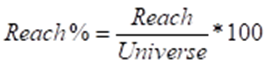|

<h3 style='color: #460073'>Задача на проект 1. </h3> 

Провести анализ EDA данных из файла `Daily_Duration` с метриками `AddPerP` и `AddPerU`:  
1. Описать, какие основные тренды видите.
2. Какие особенности в структуре и поведении аудитории ресурсов?
3. Какие причины изменений показателей динамики для конкретного ресурса?

<h3 style='color: #460073'>План работы. </h3> 

1. Импорт библиотек.
2. Загрузка файлов с данными `Daily_Duration`
3. Изучение датасетов и проведение первичной обработки данных.
    * Размеры датасетов.
    * Сущность признаков.
    * Типы данных.
    * Наличие/отсутствие дубликатов.
    * Наличие/отсутствие пропусков данных.
4. Проведение EDA анализа.  
    * Приведение к формату 'datetime' данных со значениями времени.
    * Объединение данных и анализ в **сумме по всем возрастным категориям**:
        * Графическое представление `Average Daily Duration` суммарно по всем возрастным категориям.
        * Анализ на наличие трендов и сезонности `Average Daily Duration` суммарно по всем возрастным категориям для выбранных источников информации.
        * Оценка стационарности временного ряда. Тест Дики-Фуллера (Dickey-Fuller test). Для выбранных источников информации. Суммарно по всем возрастным категориям.
    * Анализ для возрастной группы **до 12 лет**:
        * Графическое представление `Average Daily Duration` .
        * Анализ на наличие трендов и сезонности `Average Daily Duration`.
        * Оценка стационарности временного ряда. Тест Дики-Фуллера (Dickey-Fuller test). 
     * Анализ для возрастной группы **от 12 до 24 лет**:
        * Графическое представление `Average Daily Duration`.
        * Анализ на наличие трендов и сезонности `Average Daily Duration`.
        * Оценка стационарности временного ряда. Тест Дики-Фуллера (Dickey-Fuller test).
      * Анализ для возрастной группы **от 55 лет**:
        * Графическое представление `Average Daily Duration`.
        * Анализ на наличие трендов и сезонности `Average Daily Duration`.
        * Оценка стационарности временного ряда. Тест Дики-Фуллера (Dickey-Fuller test).
5. Оформление итоговых выводов.

<hr style='border:2px solid #460073'> </hr>
<h1 style='color: #460073'>1. Импорт библиотек. </h1> 
<hr style='border:2px solid #460073'> </hr>

In [93]:
# Все import соберем в начале проекта:

import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import os
import seaborn as sns
import re

from skimpy import skim, clean_columns
from datetime import datetime
from tqdm.auto import tqdm

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from datetime import datetime, timedelta

# В датасете 150 признаков: 50 Источников x 6 параметров
NUM_FEATURES = 3 # Ограничимся 3 источниками для демо-проекта

# Размер окна для проверки стационарности временного ряда
WINDOW_STATIONARITY = 7

# Настроим вид таблиц:
pd.set_option("display.max_rows", 50)
pd.set_option("display.max_columns", 50) 

<hr style='border:2px solid #460073'> </hr>
<h1 style='color: #460073'>2. Загрузка файлов с данными.</h1> 
<hr style='border:2px solid #460073'> </hr>

Изучил файл `Daily_Duration.xlsx` и привёл его к формату `csv`:

In [94]:
# Вспомогательная функция для чтения файлов с данными
def load_dataset(file_name, separator):
    '''
    Функция для проверки нахождения файла и загрузки датафрейма.
    '''
    if os.path.exists(file_name):
        data = pd.read_csv(file_name, sep = separator)
        print('Dataset "', file_name, '" is loaded successfully.', sep='')
        return data
    else:
        print('Something with', file_name, 'is wrong!')

In [95]:
# Загрузка данных по фактическому включению/выключению пиплметра         
df_dd = load_dataset('Daily_Duration_total.csv', ';')

Dataset "Daily_Duration_total.csv" is loaded successfully.


<hr style='border:2px solid #460073'> </hr>
<h1 style='color: #460073'>3. Изучение датасета и проведение первичной обработки данных.</h1> 
<hr style='border:2px solid #460073'> </hr>

Создаю вспомогательную функцию для изучения датафреймов.

In [96]:
def view_skim_df(df):
    '''
    Функция для единообразного изучения датафреймов.
    1. Контроль размера датафрейма.
    2. Вывод основных данных по датафрейму.
    3. Распечатка на экране первых трёх объектов датафрейма.
    '''
    skim(df)
    display(df.head(3))
    print('Количество дубликатов:', df.duplicated().sum())    
    print('Полное количество пропущенных значений по всем признакам:', 
          df.isnull().sum().sum())
    
    return

Рассмотрим данные, содержащиеся в датафрейме.

In [97]:
# Изучим содержимое датафрейма:
view_skim_df(df_dd)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 516    │ │ float64     │ 150   │                                                          │
│ │ Number of columns │ 152    │ │ string      │ 1     │                                                          │
│ └───────────────────┴────────┘ │ int32       │ 1     │                                                          │
│                                └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━┳━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━━┓  │
│ ┃ column_name               ┃ NA   ┃ NA %   ┃ mean      ┃ sd        ┃ p0    ┃ p25   ┃ p75   ┃ p100  ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━╇━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━━┩  │
│ │ 2gis Web Desktop Add      │    0 │      0 │     0.015 │     0.012 │     0 │  0.01 │  0.02 │  0.15 │   █▁   │  │
│ │ 2gis Web Desktop Add      │    0 │      0 │       3.9 │       2.5 │  0.25 │   2.5 │   4.7 │    26 │   █▃   │  │
│ │ 2gis App Mobile AddP      │    0 │      0 │      0.38 │      0.19 │  0.06 │  0.26 │  0.47 │     1 │ ▄█▅▂▁  │  │
│ │ 2gis App Mobile AddP      │    0 │      0 │       9.2 │       2.6 │   4.1 │   7.7 │    10 │    32 │  ██▁   │  │
│ │ 2gis Web Mobile AddP      │    0 │      0 │    0.0042 │    0.0053 │     0 │     0 │  0.01 │  0.04 │   █▅   │  │
│ │ 2gis Web Mobile AddP      │    0 │      0 │      0.94 │      0.44 │  0.17 │  0.68 │   1.1 │   5.4 │   █▃   │  │
│ │ Discord Web Desktop       │    0 │      0 │     0.013 │     0.014 │     0 │     0 │  0.02 │  0.11 │   █▃   │  │
│ │ Discord Web Desktop       │    0 │      0 │       4.5 │       4.1 │  0.29 │   1.9 │   5.6 │    30 │  █▂▁   │  │
│ │ Discord App Mobile A      │    0 │      0 │      0.49 │      0.62 │  0.01 │  0.12 │  0.44 │   2.6 │ █▁ ▁▁  │  │
│ │ Discord App Mobile A      │    0 │      0 │        20 │       5.8 │   6.8 │    16 │    23 │    53 │  ▂█▃▁  │  │
│ │ Discord Web Mobile A      │    2 │   0.39 │   0.00014 │    0.0013 │     0 │     0 │     0 │  0.02 │   █    │  │
│ │ Discord Web Mobile A      │    2 │   0.39 │      0.56 │       1.1 │  0.02 │  0.23 │  0.56 │    19 │   █    │  │
│ │ Facebook Web Desktop      │   16 │    3.1 │     0.018 │     0.019 │     0 │     0 │  0.03 │  0.08 │  █▃▂▂  │  │
│ │ Facebook Web Desktop      │   16 │    3.1 │        12 │        10 │  0.02 │   3.2 │    19 │    49 │ █▄▄▁▁  │  │
│ │ Facebook App Mobile       │    0 │      0 │     0.066 │     0.045 │     0 │  0.03 │  0.09 │  0.25 │  ▇█▅▁  │  │
│ │ Facebook App Mobile       │    0 │      0 │       9.1 │       5.2 │  0.46 │   4.5 │    12 │    27 │ ▆▅█▃▁  │  │
│ │ Facebook Web Mobile       │    0 │      0 │   0.00054 │    0.0033 │     0 │     0 │     0 │  0.06 │   █    │  │
│ │ Facebook Web Mobile       │    0 │      0 │       0.3 │      0.35 │  0.06 │  0.17 │  0.33 │   6.2 │   █    │  │
│ │ Google Карты Web Des      │    0 │      0 │     0.014 │    0.0091 │     0 │  0.01 │  0.02 │  0.07 │  █▃▁   │  │
│ │ Google Карты Web Des      │    0 │      0 │       4.4 │       2.9 │  0.46 │   2.5 │   5.3 │    22 │  █▅▁   │  │
│ │ Google Карты App Mob      │    0 │      0 │      0.18 │     0.081 │  0.04 │  0.13 │  0.23 │  0.55 │  ▃█▃▁  │  │
│ │ Google Карты App Mob      │    0 │      0 │       6.

,Date,2gis Web Desktop AddPerP,2gis Web Desktop AddPerU,2gis App Mobile AddPerP,2gis App Mobile AddPerU,2gis Web Mobile AddPerP,2gis Web Mobile AddPerU,Discord Web Desktop AddPerP,Discord Web Desktop AddPerU,Discord App Mobile AddPerP,Discord App Mobile AddPerU,Discord Web Mobile AddPerP,Discord Web Mobile AddPerU,Facebook Web Desktop AddPerP,Facebook Web Desktop AddPerU,Facebook App Mobile AddPerP,Facebook App Mobile AddPerU,Facebook Web Mobile AddPerP,Facebook Web Mobile AddPerU,Google Карты Web Desktop AddPerP,Google Карты Web Desktop AddPerU,Google Карты App Mobile AddPerP,Google Карты App Mobile AddPerU,Google Карты Web Mobile AddPerP,Google Карты Web Mobile AddPerU,...,Лента: Lenta Web Desktop AddPerP,Лента: Lenta Desktop AddPerU,Лента: Lenta App Mobile AddPerP,Лента: Lenta App Mobile AddPerU,Лента: Lenta Web Mobile AddPerP,Лента: Lenta Web Mobile AddPerU,Яндекс.Картинки Lenta Web Desktop AddPerP,Яндекс.Картинки Lenta Desktop AddPerU,Яндекс.Картинки App Mobile AddPerP,Яндекс.Картинки App Mobile AddPerU,Яндекс.Картинки Web Mobile AddPerP,Яндекс.Картинки Web Mobile AddPerU,Яндекс.Карты Lenta Web Desktop AddPerP,Яндекс.Карты Lenta Desktop AddPerU,Яндекс.Карты App Mobile AddPerP,Яндекс.Карты App Mobile AddPerU,Яндекс.Карты Web Mobile AddPerP,Яндекс.Карты Web Mobile AddPerU,Яндекс.Новости Lenta Web Desktop AddPerP,Яндекс.Новости Lenta Desktop AddPerU,Яндекс.Новости App Mobile AddPerP,Яндекс.Новости App Mobile AddPerU,Яндекс.Новости Web Mobile AddPerP,Яндекс.Новости Web Mobile AddPerU,age
0,01.04.2023,0.010,3.270,0.360,10.430,0.000,0.930,0.030,8.690,0.430,20.980,0.000,0.410,0.020,14.530,0.070,9.400,0.000,0.370,0.010,3.850,0.180,7.100,0.000,0.940,...,0.000,5.780,0.020,3.530,0.000,1.170,0.110,3.900,NaN,NaN,0.040,1.920,0.050,4.960,0.590,9.770,0.010,2.230,0.000,0.080,NaN,NaN,NaN,NaN,0
1,02.04.2023,0.010,2.290,0.300,9.110,0.000,0.970,0.030,8.370,0.440,20.240,0.000,0.220,0.030,19.410,0.070,11.240,0.000,0.270,0.010,3.780,0.130,5.570,0.000,0.650,...,0.010,7.040,0.020,2.800,0.000,1.170,0.160,4.740,NaN,NaN,0.040,1.860,0.040,4.170,0.560,10.170,0.010,3.670,0.000,0.120,NaN,NaN,0.000,0.050,0
2,03.04.2023,0.020,4.310,0.260,6.960,0.010,1.100,0.010,3.410,0.350,17.810,0.000,0.490,0.030,18.170,0.060,8.310,0.000,0.180,0.030,7.600,0.120,4.710,0.000,0.810,...,0.000,2.640,0.030,3.430,0.000,1.000,0.160,4.520,NaN,NaN,0.040,1.830,0.080,5.060,0.640,9.650,0.010,3.470,NaN,NaN,NaN,NaN,0.000,0.050,0


Количество дубликатов: 0
Полное количество пропущенных значений по всем признакам: 7334


Сформируем список признаков:
* **В связи с большим количеством источников информации об аудитории диджитал-ресурсов среди населения России и с связи с демонстрационой целью данной работы, ограничимся ТРЕМЯ (устанавливается в глобальной переменной NUM_FEATURES) первыми по списку ресурсами. Остальные признаки удалим**. 

In [98]:
# Список индексов удаляемых признаков, за исключением Date и age и 
# количеством источников, задаваемый глобальной переменной NUM_FEATURES:

if NUM_FEATURES < 1: NUM_FEATURES = 1
if NUM_FEATURES > 25: NUM_FEATURES = 25

list_columns = [i for i in range(1 + NUM_FEATURES * 6, 
                                 len(df_dd.columns)-1)]
print('Количество удаляемых признаков:', len(list_columns))

df_dd.drop(df_dd.columns[list_columns], axis=1, inplace=True)
df_dd.head(2)

Количество удаляемых признаков: 132


,Date,2gis Web Desktop AddPerP,2gis Web Desktop AddPerU,2gis App Mobile AddPerP,2gis App Mobile AddPerU,2gis Web Mobile AddPerP,2gis Web Mobile AddPerU,Discord Web Desktop AddPerP,Discord Web Desktop AddPerU,Discord App Mobile AddPerP,Discord App Mobile AddPerU,Discord Web Mobile AddPerP,Discord Web Mobile AddPerU,Facebook Web Desktop AddPerP,Facebook Web Desktop AddPerU,Facebook App Mobile AddPerP,Facebook App Mobile AddPerU,Facebook Web Mobile AddPerP,Facebook Web Mobile AddPerU,age
0,01.04.2023,0.010,3.270,0.360,10.430,0.000,0.930,0.030,8.690,0.430,20.980,0.000,0.410,0.020,14.530,0.070,9.400,0.000,0.370,0
1,02.04.2023,0.010,2.290,0.300,9.110,0.000,0.970,0.030,8.370,0.440,20.240,0.000,0.220,0.030,19.410,0.070,11.240,0.000,0.270,0


**Отмечаем**, что осталось нужное число признаков.

**Отмечаем**:
* Количество записей 516.
* Количество признаков равно 152. Из них только `Date` имеет тип string. Следует перевести в datetime.
* Все данные разбиты на возрастные группы:
    * до 12 лет,
    * 12 - 24 года,
    * 25 - 34 года, 
    * 35 - 44 года,
    * 45 - 54 года,
    * от 55 и старше.
* Дубликатов нет. Видимо, даты расставлены аккуратно.
* Пропуски данных есть у 10 признаков (везде и для AddPerP, и для AddPerU одинаковое количество):
    * `Google Новости Web Desktop` - **7 шт.**
    * `Google Новости Web Mobile` - **21 шт.**
    * `Kp App Mobile` - **9 шт.**
    * `Smi1 App Mobile` - **1 шт.**
    * `Vedomosti App Mobile` - **73 шт.**
    * `Viber Web Desktop` - **5 шт.**
    * `Яндекс.Картинки App Mobile` - **86 шт. - 100%**.
    * `Яндекс.Новости Lenta Web Desktop` - **40 шт.**
    * `Яндекс.Новости App Mobile` - **86 шт. - 100%**.
    * `Яндекс.Новости Web Mobile` - **3 шт.**
* ML проводить не нужно (согласно задания требуется только EDA анализ), поэтому название столбцов не будем приводить к типу *snake_case*. Оставим их такими, как они и есть.
* В связи с большим количеством источников информации об аудитории диджитал-ресурсов среди населения России и с связи с демонстрационой целью данной работы, **ограничился ТРЕМЯ первыми по списку ресурсами. Остальные признаки удалил**.

<hr style='border:2px solid #460073'> </hr>
<h1 style='color: #460073'>4. EDA анализ.</h1> 
<hr style='border:2px solid #460073'> </hr>

## 4.1. Приведение к формату 'datetime' признака `Date`.

Преобразуем даты из формата 'string' в формат 'datetime'

In [99]:
df_dd['Date'] = pd.to_datetime(df_dd.Date, format='%d.%m.%Y')
df_dd.info()
print('Для проведения исследования данные собраны в период с',
    df_dd.Date.min(), 'по ', df_dd.Date.max())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 516 entries, 0 to 515
Data columns (total 20 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Date                          516 non-null    datetime64[ns]
 1   2gis Web Desktop AddPerP      516 non-null    float64       
 2   2gis Web Desktop AddPerU      516 non-null    float64       
 3   2gis App Mobile AddPerP       516 non-null    float64       
 4   2gis App Mobile AddPerU       516 non-null    float64       
 5   2gis Web Mobile AddPerP       516 non-null    float64       
 6   2gis Web Mobile AddPerU       516 non-null    float64       
 7   Discord Web Desktop AddPerP   516 non-null    float64       
 8   Discord Web Desktop AddPerU   516 non-null    float64       
 9   Discord App Mobile AddPerP    516 non-null    float64       
 10  Discord App Mobile AddPerU    516 non-null    float64       
 11  Discord Web Mobile AddPerP    51

**Отмечаем** успешное преобразование формата.

## 4.2. Отсортируем данные в хронологическом порядке.

In [100]:
df_dd = df_dd.sort_values(by=['Date', 'age'])
df_dd.head(7)

,Date,2gis Web Desktop AddPerP,2gis Web Desktop AddPerU,2gis App Mobile AddPerP,2gis App Mobile AddPerU,2gis Web Mobile AddPerP,2gis Web Mobile AddPerU,Discord Web Desktop AddPerP,Discord Web Desktop AddPerU,Discord App Mobile AddPerP,Discord App Mobile AddPerU,Discord Web Mobile AddPerP,Discord Web Mobile AddPerU,Facebook Web Desktop AddPerP,Facebook Web Desktop AddPerU,Facebook App Mobile AddPerP,Facebook App Mobile AddPerU,Facebook Web Mobile AddPerP,Facebook Web Mobile AddPerU,age
0,2023-04-01,0.010,3.270,0.360,10.430,0.000,0.930,0.030,8.690,0.430,20.980,0.000,0.410,0.020,14.530,0.070,9.400,0.000,0.370,0
86,2023-04-01,0.010,3.920,0.310,7.640,0.000,0.980,0.090,10.280,2.010,22.600,0.000,0.390,0.000,0.030,0.010,3.660,0.000,0.090,12
172,2023-04-01,0.010,2.150,0.630,9.850,0.010,1.230,0.000,0.830,0.360,17.150,0.000,0.500,0.000,1.390,0.050,7.290,0.000,0.170,25
258,2023-04-01,0.020,5.600,0.480,8.850,0.000,0.610,0.020,7.050,0.110,11.300,0.000,0.250,0.010,7.730,0.130,15.050,0.000,0.150,35
344,2023-04-01,0.010,2.530,0.240,8.630,0.000,0.780,0.040,17.430,0.230,35.610,0.000,0.610,0.010,6.660,0.090,8.450,0.010,1.500,45
430,2023-04-01,0.000,2.710,0.240,23.710,0.000,0.940,0.010,6.390,0.010,6.810,0.000,0.120,0.050,23.490,0.060,8.220,0.000,0.560,55
1,2023-04-02,0.010,2.290,0.300,9.110,0.000,0.970,0.030,8.370,0.440,20.240,0.000,0.220,0.030,19.410,0.070,11.240,0.000,0.270,0


## 4.3. Анализ `Average Daily Duration` суммарно по всем возрастным категориям.

### 4.3.1. Графическое представление `Average Daily Duration` суммарно по всем возрастным категориям.

Вспомогательная функция.

In [101]:
def plot_average_daily_duration(df, key, list_6values):
    '''
    Функция вывода графиков 'Average Daily Duration'.
    '''
    fg = plt.figure(figsize=(9, 4), constrained_layout=True)
    gs = gridspec.GridSpec(ncols=2, nrows=1, figure=fg)
    
    fig_ax_1 = fg.add_subplot(gs[0, 0])
    for i in range(0, 6, 2):
        y_title = key + ' ' + list_6values[i]
        plt.plot(df['Date'], df[y_title], label=y_title)
    plt.xlabel('Дата', color = 'blue')
    plt.xticks(fontsize = 8, rotation=45)
    plt.ylabel('Average Daily Duration на население',
              fontsize = 8, color = 'blue') 
    plt.legend(bbox_to_anchor=(0.5, 1.3), loc='upper center')

    fig_ax_2 = fg.add_subplot(gs[0, 1])
    for i in range(1, 6, 2):
        y_title = key + ' ' + list_6values[i]
        plt.plot(df['Date'], df[y_title], label=y_title)  
    plt.xlabel('Дата', color = 'blue')
    plt.xticks(fontsize = 8, rotation=45)
    plt.ylabel('Average Daily Duration на пользователей',
              fontsize = 8, color = 'blue') 
    plt.legend(bbox_to_anchor=(0.5, 1.3), loc='upper center')

    plt.show()

Для удобства работы с большим количеством колонок упакуем их к словарь.

In [102]:
dict_columns = {}

list_columns = df_dd.columns[1:-1]# Убрали Date и age
for num in range(0, len(list_columns), 6):
    key_dict = list_columns[num].split()[0]
    list_6col = []
    for i in range(6):
        list_6col.append(" ".join(list_columns[num+i].split()[1:]))
    dict_columns[key_dict] = list_6col

In [103]:
print('Количество источников информации:', len(dict_columns))
print('Список источников информации:', list(dict_columns.keys()))

Количество источников информации: 3
Список источников информации: ['2gis', 'Discord', 'Facebook']


Изобразим на графиках `Average Daily Duration` суммарно по всем возрастным категориям.

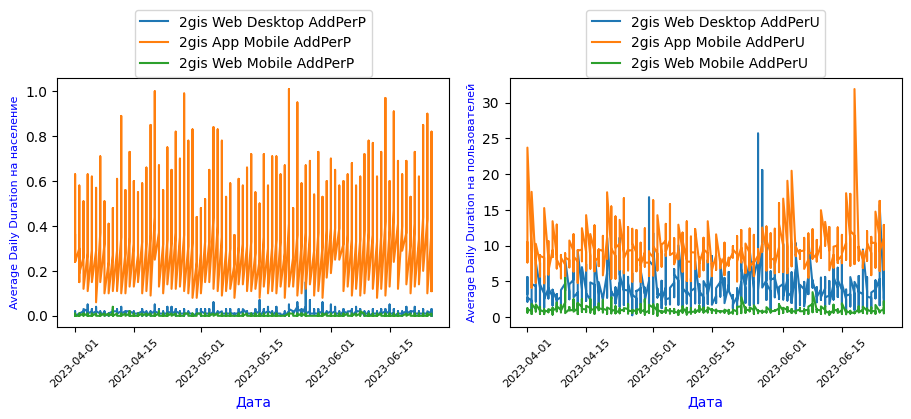

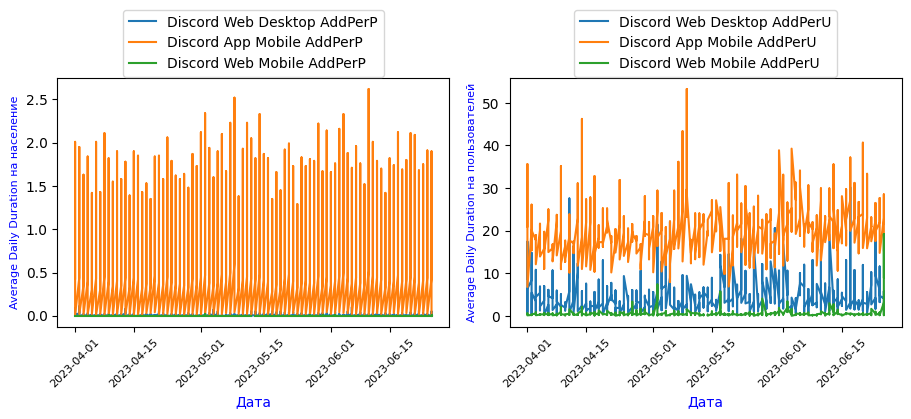

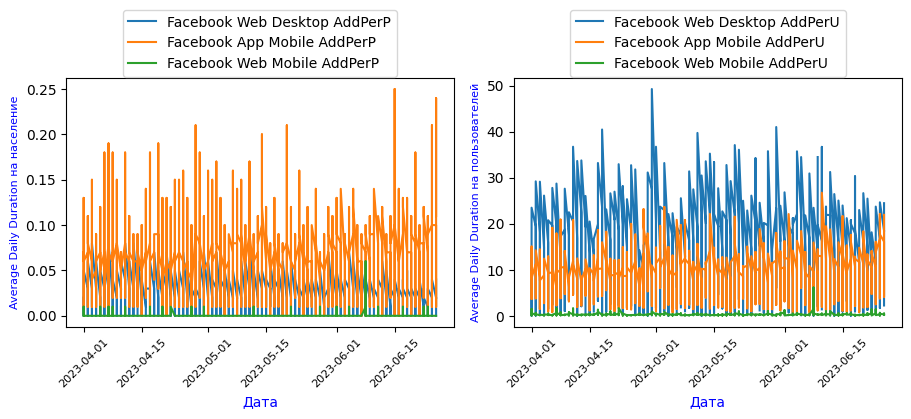

In [104]:
for k_6col, v_6cols in dict_columns.items():
    plot_average_daily_duration(df_dd, k_6col, v_6cols)

**Отмечаем**:
* На глаз, в сумме по всем возрастным категориям, устойчивых тенденции не видно.
* Присутствуют аномальные высокие выбросы, свидетельствующие о повышении интереса к какой-то определённой теме, сопровождающийся увеличением времени контакта с медиа объектом.

### 4.3.2. Анализ на наличие трендов и сезонности `Average Daily Duration` суммарно по всем возрастным категориям.

Так как данных много, чтобы это можно было выводить в одном фрагменте со множеством графиков, буду работать отдельно с каждым источником информации.

Делаем вспомогательные функции.

In [105]:
def graph_trend_seasonality(num, list_columns, decomp):
    '''
    Функция графического представления тренда и сезонности.
    '''
    fg = plt.figure(figsize=(9, 3), constrained_layout=True)
    gs = gridspec.GridSpec(ncols=2, nrows=1, figure=fg)

    fig_ax_1 = fg.add_subplot(gs[0, 0])
    decomp.trend.plot(ax=plt.gca())
    plt.title(list_columns[num]+' - ТРЕНД', color = 'red')
    plt.xlabel('Дата получения контакта пользователя с медиа объектом.', 
               color = 'blue')
    plt.ylabel('Значение тренда.', color = 'blue'); 
    plt.legend()

    fig_ax_2 = fg.add_subplot(gs[0, 1])
    decomp.seasonal.plot(ax=plt.gca())
    plt.title(list_columns[num]+' - ПЕРИОД.', color = 'red')
    plt.xlabel('Дата контакта пользователя с медиа объектом.', 
               color = 'blue')
    plt.ylabel('Значение периодическое.', color = 'blue');
    plt.legend()

    plt.show()
        

def trend_seasonality(df, key_dict, list_columns):
    '''
    Функция расчёта тренда и сезонности временного ряда.
    '''
    for num in tqdm(range(len(list_columns))):
        # Создадим датафрейм и выберем для него 
        # признак 'Date' и один информационнный.
        for_decompose = df[['Date', list_columns[num]]]
        for_decompose.index = for_decompose['Date']
        for_decompose = for_decompose.drop('Date', axis=1)
        for_decompose.sort_index(inplace=True)
        for_decompose = for_decompose.resample('1D').sum()
        decomp = seasonal_decompose(for_decompose)  
        
        graph_trend_seasonality(num, list_columns, decomp)
    
    return decomp

#### 4.3.2.1. Наличие трендов и периодичности по данным от `2gis`.

Решил делать, не прибегая к циклу, а по каждому источнику контактов потребителей отдельно, чтобы была возможность проанализировать из более тщательно.

  0%|          | 0/6 [00:00<?, ?it/s]

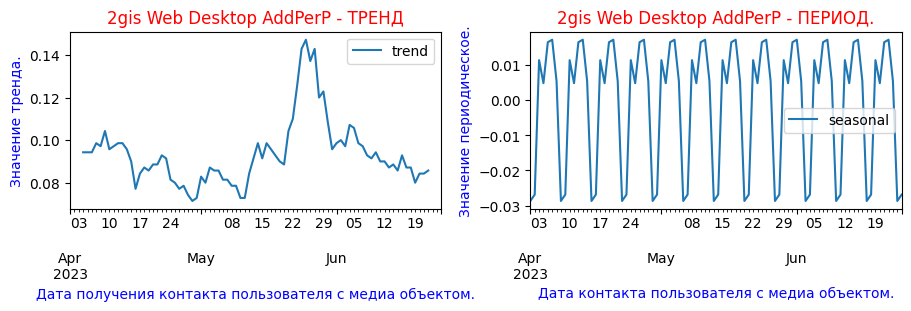

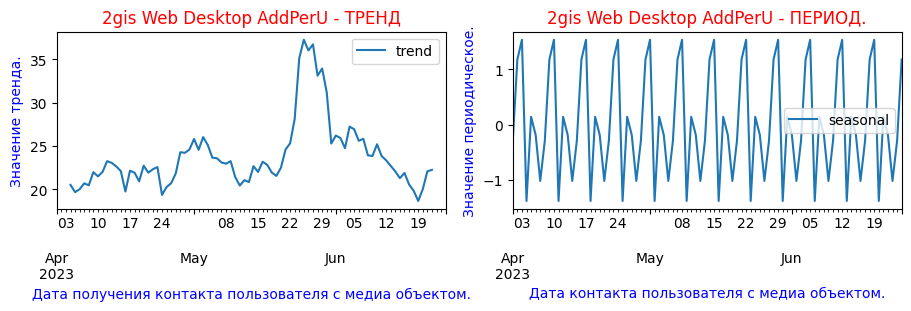

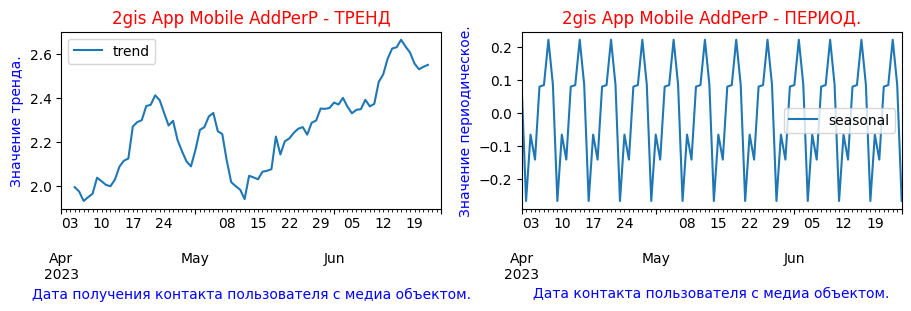

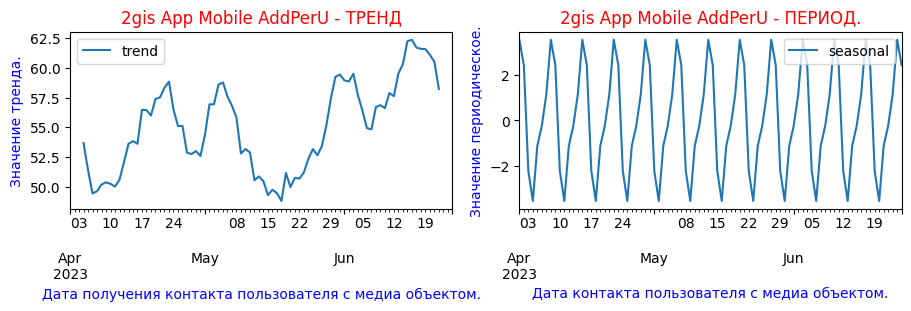

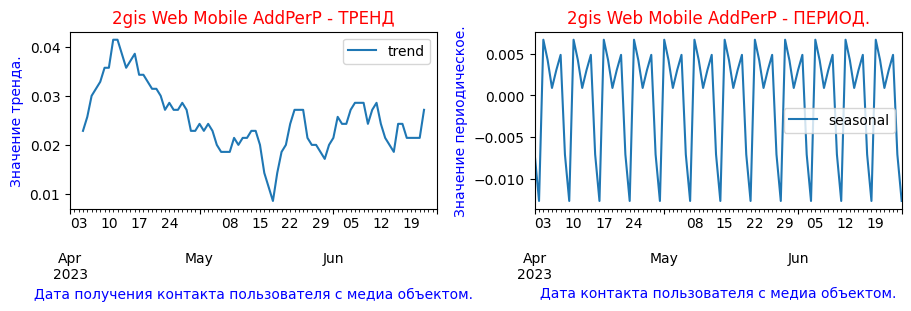

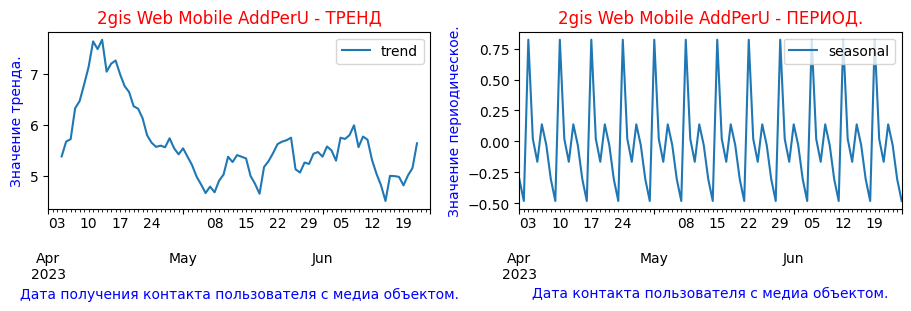

In [106]:
key_dict = '2gis' # Установим в качестве источника информации '2gis'.
list_columns = [str(key_dict + ' ' + \
                dict_columns[key_dict][i]) for i in range(6)]

decomposed = trend_seasonality(df_dd, key_dict, list_columns)

**Отмечаем**:
* признаков устойчивого **тренда** для всех трёх источников `2gis` не наблюдается;
* отмечаю кратковременные повышения и понижения время контакта пользователя с медиа объектом:
    * *Web Desktop*. В диапазоне 22-29 мая имеется чётко выраженный максимум. Этому могут быть разные причины, например, выпускники школ искали результаты ЕГЭ, люди выбирали, как провести летний отпуск, ...
    * *App Mobile* имеет тенденцию к повышению с середины мая и до самого конца наблюжений в конце июня. Люди интерсуются, как провести лето!
    * *Web Mobile* на первый взгляд имеет максимум в апреле, но если сравнить в абсолютных единицах (8) с указанными выше источниками (50 и 20), то оказывается, это незначительный всплеск.
* **периодичность** (или сезонность) для всех трёх источников `2gis`:
    * везде наблюдается `ярко выраженная сезонность, с периодом около недели`. Надо рассмотреть ее подробнее.

**Изучим сезонную (периодическую) составляющую за неделю.**

Введём вспомогательные функции.

In [107]:
def volume_seasonal(df_dd, list_columns):
    '''
    Функция расчёта тренда и отображения сезонности временного ряда.
    '''
    for num in tqdm(range(0, len(list_columns), 2)):
        fg = plt.figure(figsize=(9, 3), constrained_layout=True)
        gs = gridspec.GridSpec(ncols=2, nrows=1, figure=fg)
        
        # Создадим датафрейм и выберем для него 
        # признак 'Date' и один информационнный.
        for_decompose = df_dd[['Date', list_columns[num]]]
        for_decompose.index = for_decompose['Date']
        for_decompose = for_decompose.drop('Date', axis=1)
        for_decompose.sort_index(inplace=True)
        for_decompose = for_decompose.resample('1D').sum()
        decomp = seasonal_decompose(for_decompose)

        fig_ax_1 = fg.add_subplot(gs[0, 0])
        decomp.seasonal[date_start:date_stop].plot(ax=plt.gca())
        plt.title(list_columns[num]+' - ПЕРИОД', color = 'red')
        plt.xlabel('Дата контакта пользователя с медиа объектом.', 
                   color = 'blue')
        plt.ylabel('Значение тренда.', color = 'blue'); 
        
        
        for_decompose = df_dd[['Date', list_columns[num+1]]]
        for_decompose.index = for_decompose['Date']
        for_decompose = for_decompose.drop('Date', axis=1)
        for_decompose.sort_index(inplace=True)
        for_decompose = for_decompose.resample('1D').sum()
        decomp = seasonal_decompose(for_decompose)

        fig_ax_2 = fg.add_subplot(gs[0, 1])
        decomp.seasonal[date_start:date_stop].plot(ax=plt.gca())
        plt.title(list_columns[num+1]+' - ПЕРИОД.', color = 'red')
        plt.xlabel('Дата контакта пользователя с медиа объектом.', 
                   color = 'blue')
        plt.ylabel('Значение периодическое.', color = 'blue');

        plt.tight_layout() 

        
def calc_print_weekday(date_start, date_stop):
    '''
    Функция нахождения названий дней недели.
    '''
    date_tmp = datetime.strptime(date_start, '%Y-%m-%d')
    date_end = datetime.strptime(date_stop, '%Y-%m-%d')
    labels = []

    while date_tmp <= date_end: 
        labels.append(str(date_tmp.strftime('%y-%m-%d')) + \
                      ' - ' + date_tmp.strftime('%a'))
        date_tmp = date_tmp + timedelta(days=1)

    print('Дни недели:')
    n = 0
    for lab in labels:
        if n < 3:
            print(lab, 10*' ', end='')
            n = n +1
        else:
            print(lab, end='\n')
            n = 0

In [108]:
# Проверим правильность выбранного источника информации.
print(list_columns)

['2gis Web Desktop AddPerP', '2gis Web Desktop AddPerU', '2gis App Mobile AddPerP', '2gis App Mobile AddPerU', '2gis Web Mobile AddPerP', '2gis Web Mobile AddPerU']


Дни недели:
23-04-01 - Sat           23-04-02 - Sun           23-04-03 - Mon           23-04-04 - Tue
23-04-05 - Wed           23-04-06 - Thu           23-04-07 - Fri           23-04-08 - Sat
23-04-09 - Sun           23-04-10 - Mon           23-04-11 - Tue           23-04-12 - Wed
23-04-13 - Thu           23-04-14 - Fri           23-04-15 - Sat           23-04-16 - Sun


  0%|          | 0/3 [00:00<?, ?it/s]

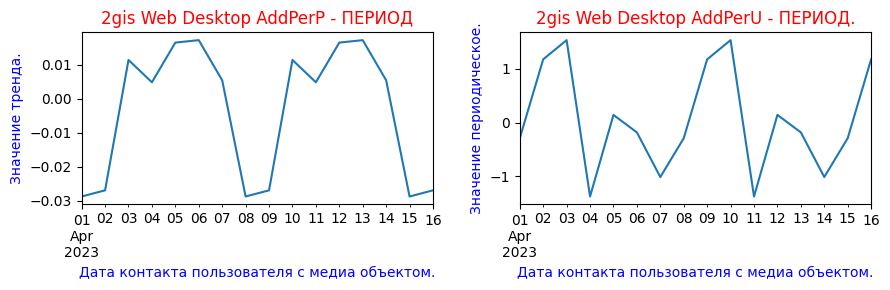

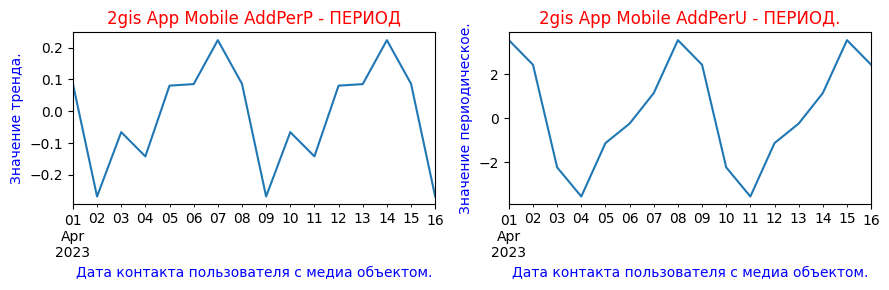

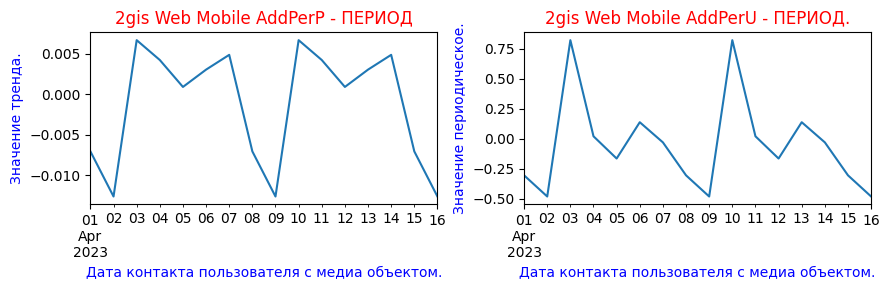

In [109]:
date_start, date_stop = '2023-04-01', '2023-04-16'
 
calc_print_weekday(date_start, date_stop) 
volume_seasonal(df_dd, list_columns)

**Отмечаем**:
* Активность запросов *2gis Web Desktop (ПК и ноутбуки)* пропадает в выходные дни, резко возрастает в понедельник и падает только в субботу. Скорее всего, люди пользуются диджитал-ресурсами в рабочее время (возможно на работе).    
* Для *2gis App Mobile (мобильное приложение)* интересно непонятное повышение активности запросов в субботу - вторник. 
* *2gis Web Mobile (мобильный браузер)*. Наблюдается минимум в воскресенье, показатели активности в рабочие дни значительно выше. Видимо, люди используют интернет на рабочем месте и для подключения мобильных телефонов.

**Оценка стационарности временного ряда.**

Временной ряд называется `стационарным`, если он не имеет тренда. Говоря более точно, среднее значение и дисперсия не меняются со смещением во времени.

Оценку стационарности проведём в способами:
* `визуально`,
* применив тест `Дики-Фуллера`.

Создадим вспомогательный функции

In [110]:
def visual_stationarity_1(fg, gs, df, list_columns, num, pos):
    '''
    Функция построения 'скользящего среднего' единичного графика.
    '''
    # Зададим временный датафрейм c признаком для рассчитываемых 
    # тестовых значений скользящего среднего:
    df_tmp = df[['Date', list_columns[num+pos], 'age']].copy()
    df_tmp = df_tmp.sort_values(by=['Date', 'age'])
    df_tmp = df_tmp.groupby(['Date']).sum()[[list_columns[num+pos]]]
    df_tmp['mean'] = (df_tmp[list_columns[num+pos]].
                      rolling(window = WINDOW_STATIONARITY).
                      mean() )

    fig_ax_1 = fg.add_subplot(gs[0, 0+pos])
    plt.plot(df_tmp[list_columns[num+pos]], 
         label = 'Кол-во контактов по дням', color = 'steelblue')
    plt.plot(df_tmp['mean'], 
         label = 'Скользящее среднее за неделю', color = 'orange')

    plt.legend(title = 'Графики:', loc = 'upper left')        
    plt.xticks(fontsize = 8, rotation=15)
    plt.ylabel('Кол-во контактов.', color = 'blue')
    plt.title(list_columns[num+pos], color = 'red')

def visual_stationarity_6(df, list_columns):
    '''
    Функция построения 'скользящего среднего' 6-и графиков.
    '''
    for num in tqdm(range(0, len(list_columns), 2)):
        fg = plt.figure(figsize=(9, 3), constrained_layout=True)
        gs = gridspec.GridSpec(ncols=2, nrows=1, figure=fg)
    
        visual_stationarity_1(fg, gs, df, list_columns, num, 0)
        visual_stationarity_1(fg, gs, df, list_columns, num, 1)      

        plt.tight_layout() 

In [111]:
# Проверим правильность выбранного источника информации.
print(list_columns)

['2gis Web Desktop AddPerP', '2gis Web Desktop AddPerU', '2gis App Mobile AddPerP', '2gis App Mobile AddPerU', '2gis Web Mobile AddPerP', '2gis Web Mobile AddPerU']


  0%|          | 0/3 [00:00<?, ?it/s]

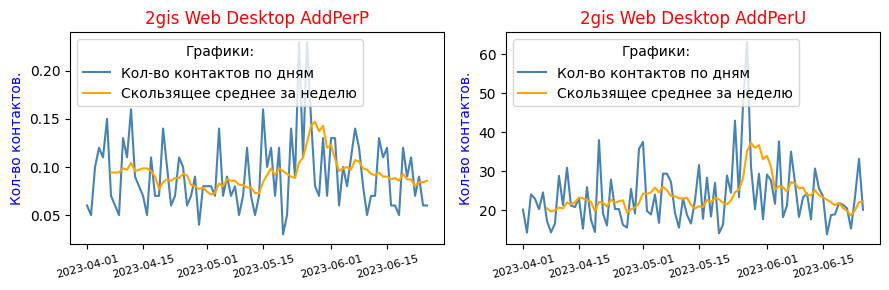

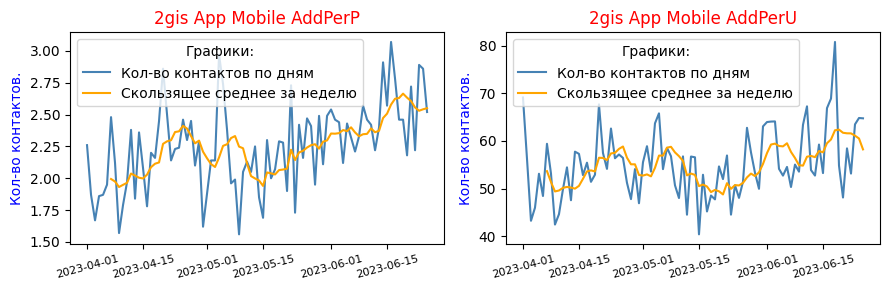

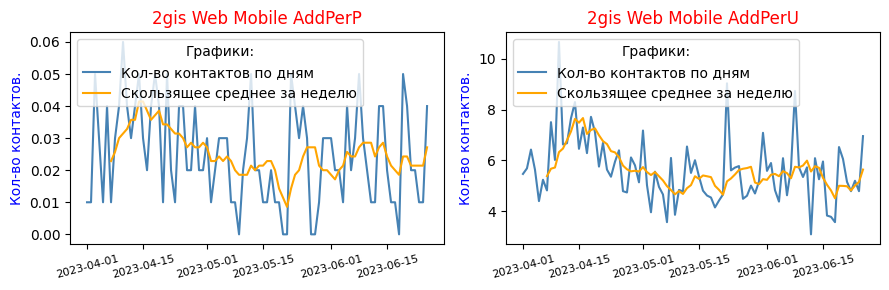

In [112]:
visual_stationarity_6(df_dd, list_columns)

**Отмечаем** отсутствие визуально фиксируемого тренда. Проверим вывод о стационарности временных рядов.

**Тест `Дики-Фуллера` (Dickey-Fuller test)**.

Тест заключается в том, что нужно выполнить статистическую проверку следующей гипотезы:
* Нулевая гипотеза H0 предполагает, что процесс нестационарный.
* Альтернативная гипотеза H1, соответственно говорит об обратном. 

Используем пороговое значение, равное 0.05 (5%).

In [113]:
# Настроим, чтобы числа в датасетах отражались с 3 знаками после запятой
pd.set_option('display.float_format', '{:.3f}'.format) 

df_test_DF = pd.DataFrame(columns=[
    'source', 'ADF criterion', 'P-value', 'Critical value 1%',
    'Critical values 5%', 'Conclusion'])


def test_DF(df, columns):
    '''
    Функция проведения теста 'Дики-Фуллера' для проверки стационарности.
    '''
    for col in columns:
        # Передадим функции 'adfuller' данные по изучаемому признаку и
        # сохраним результат в переменной adf_test:
        adf_test = adfuller(df[col].fillna(0))
        if adf_test[0] < adf_test[4]["5%"]:
            df_test_DF.loc[len(df_test_DF.index )] =(
                [col, adf_test[0], adf_test[1], adf_test[4]["1%"],
                 adf_test[4]["5%"], "Стационарен."])
        else:
            df_test_DF.loc[len(df_test_DF.index )] =(
                [col, adf_test[0], adf_test[1], adf_test[4]["1%"],
                 adf_test[4]["5%"],"НЕ стационарен!"])
# adf_test[4]["10%"] - если интересно!

In [114]:
# Запуск исполнения теста
test_DF(df_dd, list_columns)

# Просмотр датафрейма с результатами
display(df_test_DF) 

# Удалим ненужный более датафрейм
del df_test_DF

,source,ADF criterion,P-value,Critical value 1%,Critical values 5%,Conclusion
0,2gis Web Desktop AddPerP,-4.947,0.000,-3.444,-2.867,Стационарен.
1,2gis Web Desktop AddPerU,-6.738,0.000,-3.443,-2.867,Стационарен.
2,2gis App Mobile AddPerP,-3.484,0.008,-3.444,-2.867,Стационарен.
3,2gis App Mobile AddPerU,-4.342,0.000,-3.443,-2.867,Стационарен.
4,2gis Web Mobile AddPerP,-6.632,0.000,-3.443,-2.867,Стационарен.
5,2gis Web Mobile AddPerU,-3.566,0.006,-3.444,-2.867,Стационарен.


**Отмечаем**, тренда не обнаружено.

**Промежуточные выводы** для всех шести источников '2gis':
* устойчивых трендов не выявлено;
* периодичность наблюдается в работе всех источников информации:
    * Активность запросов *2gis Web Desktop (ПК и ноутбуки)* пропадает в выходные дни, резко возрастает в понедельник и падает только в субботу. Скорее всего, люди пользуются диджитал-ресурсами в рабочее время.    
    * Для *2gis App Mobile (мобильное приложение)* интересно непонятное повышение активности запросов в субботу - вторник. 
    * *2gis Web Mobile (мобильный браузер)*. Наблюдается минимум в воскресенье, показатели активности в рабочие дни значительно выше. Видимо, люди используют интернет на рабочем месте и для подключения мобильных телефонов.
* общие закономерности:
    * отмечаю кратковременные повышения и понижения время контакта пользователя с медиа объектом:
Web Desktop. В диапазоне 22-29 мая имеется чётко выраженный максимум. Этому могут быть разные причины, например, выпускники школ искали результаты ЕГЭ, люди выбирали, как провести летний отпуск, ...  
    * App Mobile имеет тенденцию к повышению с середины мая и до самого конца наблюжений в конце июня. Люди интерсуются, как провести лето!
    * Web Mobile на первый взгляд имеет максимум в апреле, но если сравнить в абсолютных единицах (8) с указанными выше источниками (50 и 20), то оказывается, это незначительный всплеск.

#### 4.3.2.2. Наличие трендов и периодичности по данным от `Discord`.

  0%|          | 0/6 [00:00<?, ?it/s]

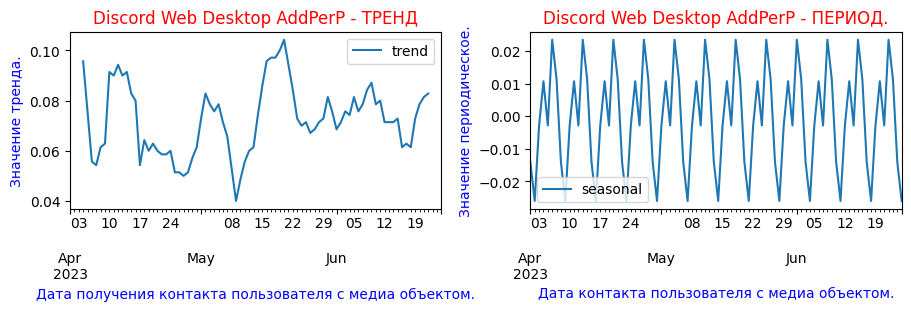

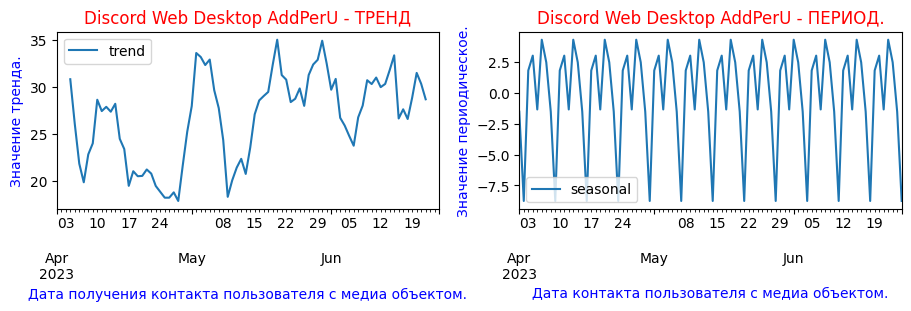

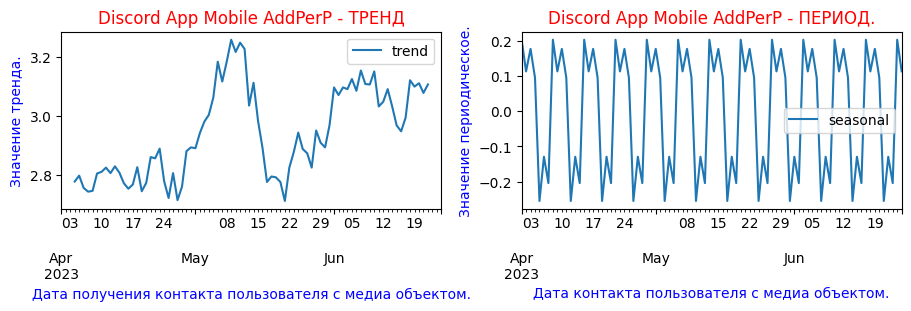

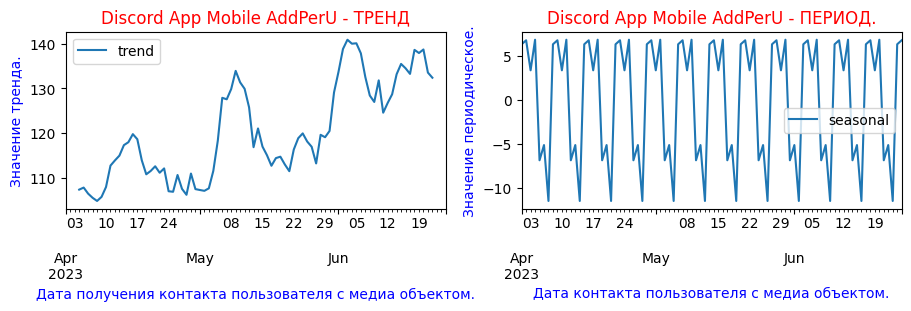

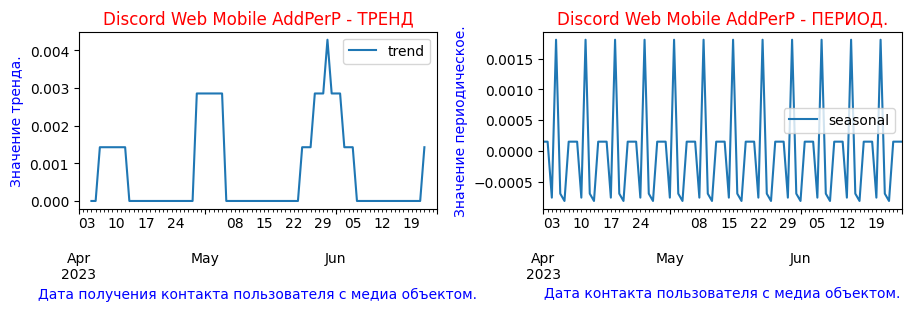

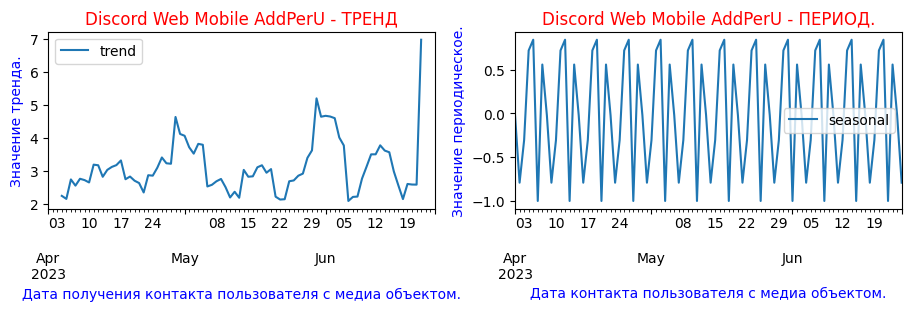

In [115]:
key_dict = 'Discord' # Установим в качестве источника информации 'Discord'.
list_columns = [str(key_dict + ' ' + \
                dict_columns[key_dict][i]) for i in range(6)]

decomposed = trend_seasonality(df_dd, key_dict, list_columns)

**Отмечаем**:
* признаков устойчивого **тренда** для всех трёх источников `Discord` не обнаружено;
* отмечаю кратковременные повышения и понижения время контакта пользователя с медиа объектом;
* **периодичность** (или сезонность) для всех трёх источников `Discord`:
    * везде наблюдается `ярко выраженная сезонность, с периодом около недели`. Надо рассмотреть ее подробнее.

**Изучим сезонную (периодическую) составляющую за неделю.**

In [116]:
# Проверим правильность выбранного источника информации.
print(list_columns)

['Discord Web Desktop AddPerP', 'Discord Web Desktop AddPerU', 'Discord App Mobile AddPerP', 'Discord App Mobile AddPerU', 'Discord Web Mobile AddPerP', 'Discord Web Mobile AddPerU']


Дни недели:
23-04-01 - Sat           23-04-02 - Sun           23-04-03 - Mon           23-04-04 - Tue
23-04-05 - Wed           23-04-06 - Thu           23-04-07 - Fri           23-04-08 - Sat
23-04-09 - Sun           23-04-10 - Mon           23-04-11 - Tue           23-04-12 - Wed
23-04-13 - Thu           23-04-14 - Fri           23-04-15 - Sat           23-04-16 - Sun


  0%|          | 0/3 [00:00<?, ?it/s]

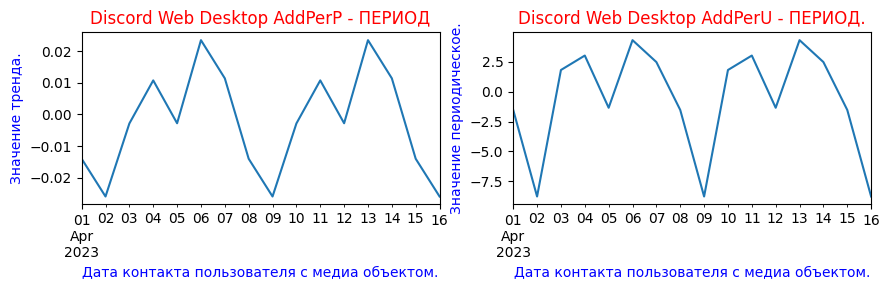

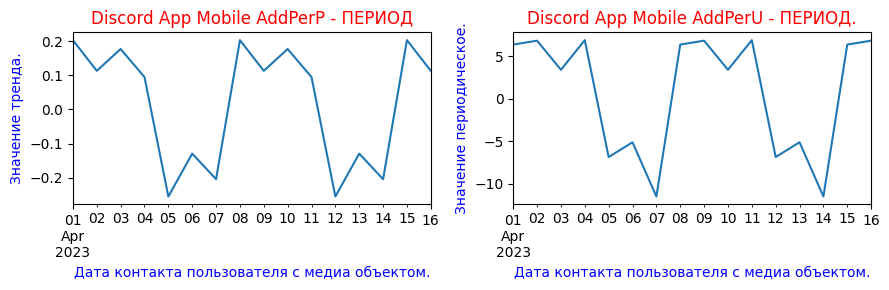

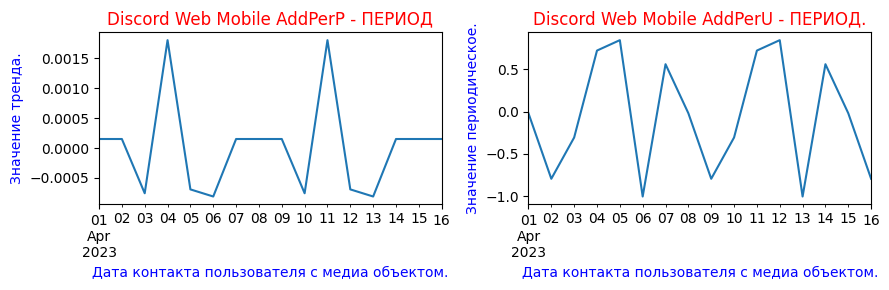

In [117]:
date_start, date_stop = '2023-04-01', '2023-04-16'
 
calc_print_weekday(date_start, date_stop) 
volume_seasonal(df_dd, list_columns)

**Отмечаем**:
* Активность запросов *Discord Web Desktop (ПК и ноутбуки)* пропадает в выходные дни, резко возрастает в понедельник и падает только в субботу. Скорее всего, люди пользуются диджитал-ресурсами в рабочее время.    
* Для *Discord App Mobile (мобильное приложение)* интересно непонятное повышение активности запросов с пятницы по среду. 
* *Discord Web Mobile (мобильный браузер)*. Источники *AddPerP* и *AddPerU* демонстрируют совершенно разные картины поведения. Одинаковые у них только периодические, по четвергам минимумы. Можно отметить обоюдные максимумы по вторникам, причем в среду у одного источника значение падает практически до нуля, хотя у другого - достигает максимума.

**Оценка стационарности временного ряда.**

In [118]:
# Проверим правильность выбранного источника информации.
print(list_columns)

['Discord Web Desktop AddPerP', 'Discord Web Desktop AddPerU', 'Discord App Mobile AddPerP', 'Discord App Mobile AddPerU', 'Discord Web Mobile AddPerP', 'Discord Web Mobile AddPerU']


  0%|          | 0/3 [00:00<?, ?it/s]

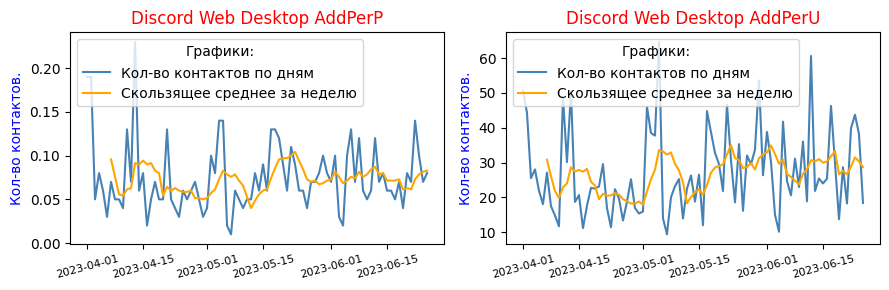

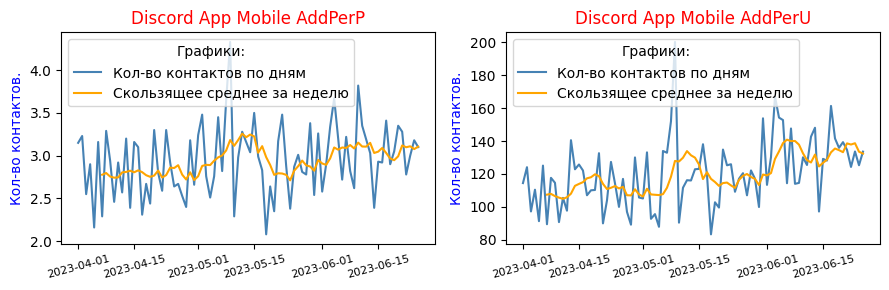

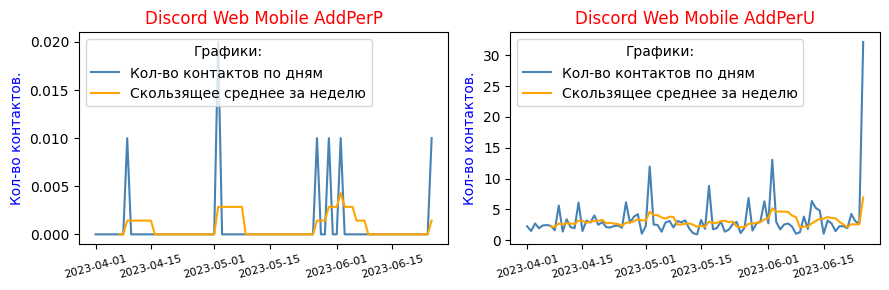

In [119]:
visual_stationarity_6(df_dd, list_columns)

**Отмечаем**:
* Отсутствие визуально фиксируемого тренда. Проверим вывод о стационарности временных рядов.
* Большое количество пропущенных значений для 'Discord Web Mobile'.

**Тест `Дики-Фуллера` (Dickey-Fuller test)**.

Используем пороговое значение, равное 0.05 (5%)

In [120]:
# Настроим, чтобы числа в датасетах отражались с 3 знаками после запятой
pd.set_option('display.float_format', '{:.3f}'.format) 

df_test_DF = pd.DataFrame(columns=[
    'source', 'ADF criterion', 'P-value', 'Critical value 1%',
    'Critical values 5%', 'Conclusion'])

# Запуск исполнения теста
test_DF(df_dd, list_columns)

# Просмотр датафрейма с результатами
display(df_test_DF) 

# Удалим ненужный более датафрейм
del df_test_DF

,source,ADF criterion,P-value,Critical value 1%,Critical values 5%,Conclusion
0,Discord Web Desktop AddPerP,-5.267,0.000,-3.444,-2.867,Стационарен.
1,Discord Web Desktop AddPerU,-5.394,0.000,-3.443,-2.867,Стационарен.
2,Discord App Mobile AddPerP,-4.633,0.000,-3.444,-2.867,Стационарен.
3,Discord App Mobile AddPerU,-3.925,0.002,-3.443,-2.867,Стационарен.
4,Discord Web Mobile AddPerP,-22.893,0.000,-3.443,-2.867,Стационарен.
5,Discord Web Mobile AddPerU,-7.341,0.000,-3.443,-2.867,Стационарен.


**Промежуточные выводы** для всех шести источников 'Discord':
* Признаков устойчивого тренда для всех трёх источников Discord не обнаружено;
* отмечаю кратковременные повышения и понижения время контакта пользователя с медиа объектом;
периодичность (или сезонность) для всех трёх источников 2gis:
везде наблюдается ярко выраженная сезонность, с периодом около недели. Надо рассмотреть ее подробнее.
* периодичность наблюдается в работе всех источников информации:    
    * Активность запросов *Discord Web Desktop (ПК и ноутбуки)* пропадает в выходные дни, резко возрастает в понедельник и падает только в субботу. Скорее всего, люди пользуются диджитал-ресурсами в рабочее время.    
    * Для *Discord App Mobile (мобильное приложение)* интересно непонятное повышение активности запросов с пятницы по среду. 
    * *Discord Web Mobile (мобильный браузер)*. Источники *AddPerP* и *AddPerU* демонстрируют совершенно разные картины поведения. Одинаковые у них только периодические, по четвергам минимумы. Можно отметить обоюдные максимумы по вторникам, причем в среду у одного источника значение падает практически до нуля, хотя у другого - достигает максимума.

#### 4.3.2.3. Наличие трендов и периодичности по данным от `Facebook`.

  0%|          | 0/6 [00:00<?, ?it/s]

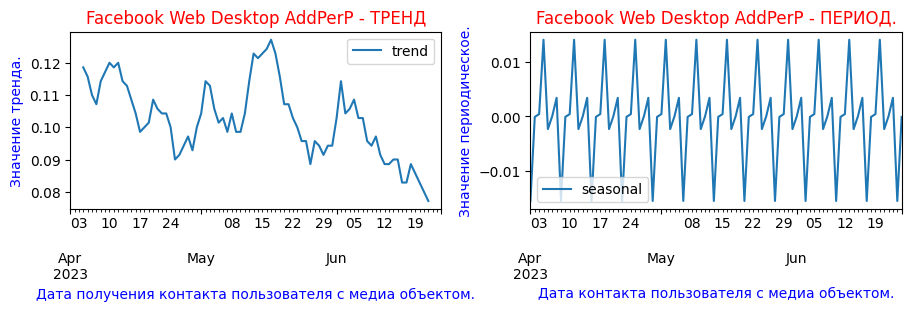

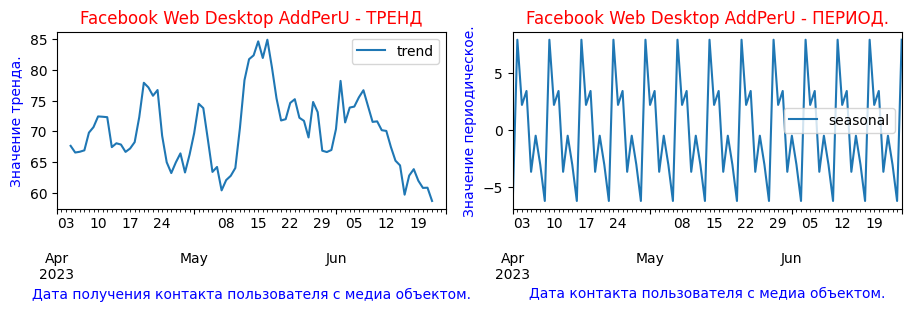

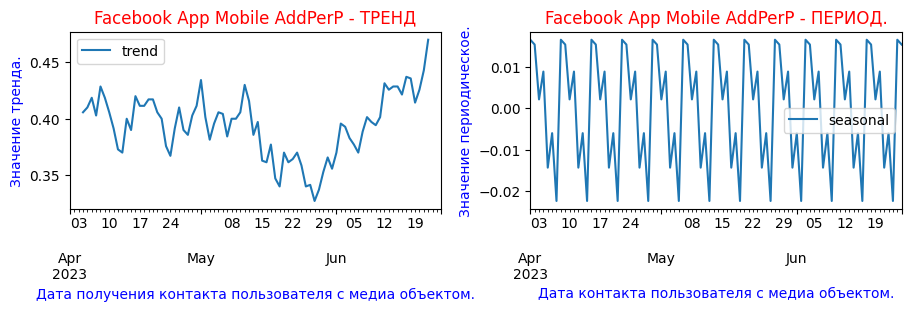

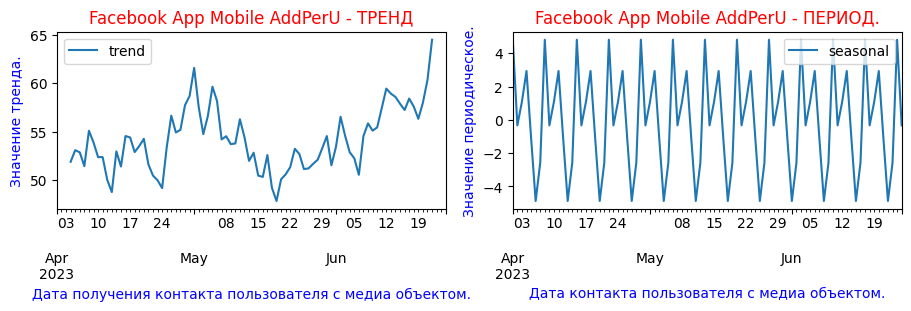

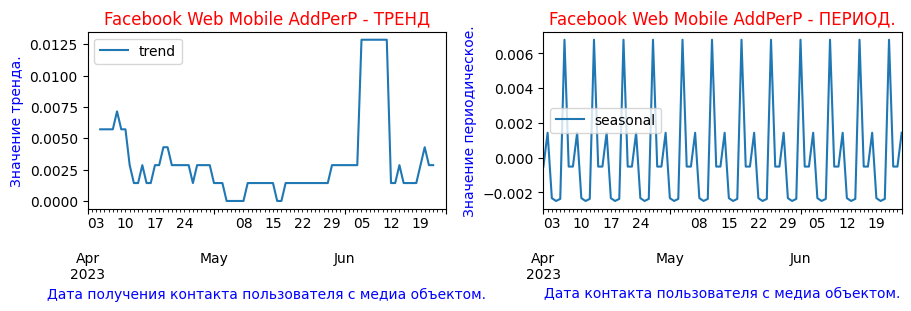

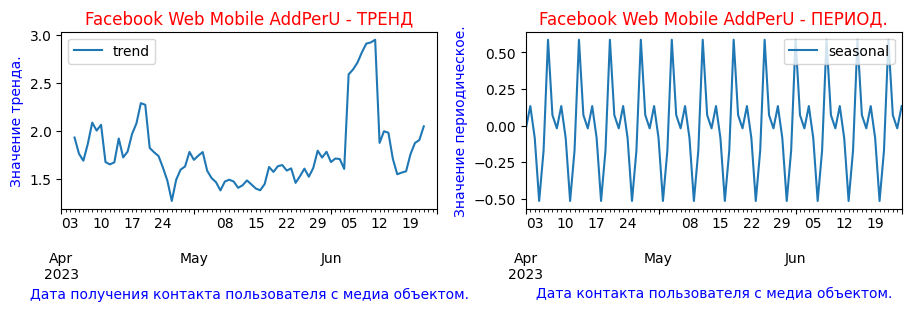

In [121]:
key_dict = 'Facebook' # Установим в качестве источника информации 'Discord'.
list_columns = [str(key_dict + ' ' + \
                dict_columns[key_dict][i]) for i in range(6)]

decomposed = trend_seasonality(df_dd, key_dict, list_columns)

**Отмечаем**:
* признаков устойчивого **тренда** для всех трёх источников `Facebook` не наблюдается;
* *Facebook Web Desktop (ПК и ноутбуки)* демонстрирует устойчивое падение, начиная с середины мая и до конца исследовательского периода. С повышением пика активности в начале июня.
* *Facebook App Mobile (мобильное приложение)* показывает устойчивое повышение с конца мая и весь июнь.
* *Facebook Web Mobile (мобильный браузер)* - непонятный пик в период с 5 по 12 июня.

**Изучим сезонную (периодическую) составляющую за неделю.**

In [122]:
# Проверим правильность выбранного источника информации.
print(list_columns)

['Facebook Web Desktop AddPerP', 'Facebook Web Desktop AddPerU', 'Facebook App Mobile AddPerP', 'Facebook App Mobile AddPerU', 'Facebook Web Mobile AddPerP', 'Facebook Web Mobile AddPerU']


Дни недели:
23-04-01 - Sat           23-04-02 - Sun           23-04-03 - Mon           23-04-04 - Tue
23-04-05 - Wed           23-04-06 - Thu           23-04-07 - Fri           23-04-08 - Sat
23-04-09 - Sun           23-04-10 - Mon           23-04-11 - Tue           23-04-12 - Wed
23-04-13 - Thu           23-04-14 - Fri           23-04-15 - Sat           23-04-16 - Sun


  0%|          | 0/3 [00:00<?, ?it/s]

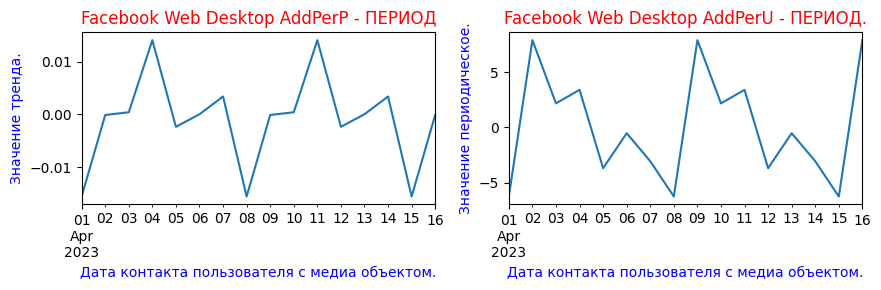

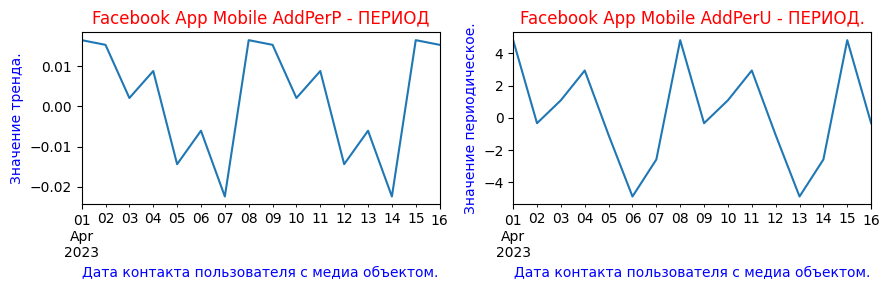

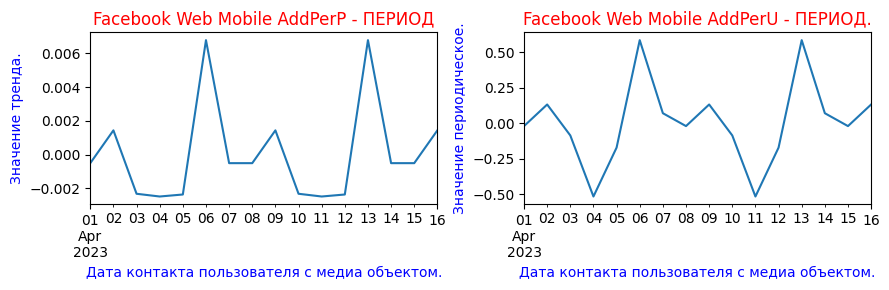

In [123]:
date_start, date_stop = '2023-04-01', '2023-04-16'
 
calc_print_weekday(date_start, date_stop) 
volume_seasonal(df_dd, list_columns)

**Отмечаем**:
* Активность запросов *Facebook Web Desktop (ПК и ноутбуки)* очень сильно различается по показателям *AddPerP* и *AddPerU*.
* *Facebook App Mobile (мобильное приложение)* тоже демонстрирует отличающиееся поведение между *AddPerP* и *AddPerU*.
* *Facebook Web Mobile (мобильный браузер)*. Максимальные пики по четвергам непонятны.
* Все 6 источников информации показывают периодичность продолжительностью в одну неделю.

**Оценка стационарности временного ряда.**

In [124]:
# Проверим правильность выбранного источника информации.
print(list_columns)

['Facebook Web Desktop AddPerP', 'Facebook Web Desktop AddPerU', 'Facebook App Mobile AddPerP', 'Facebook App Mobile AddPerU', 'Facebook Web Mobile AddPerP', 'Facebook Web Mobile AddPerU']


  0%|          | 0/3 [00:00<?, ?it/s]

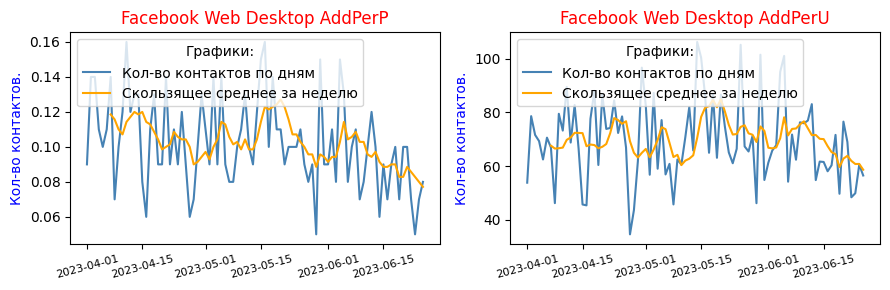

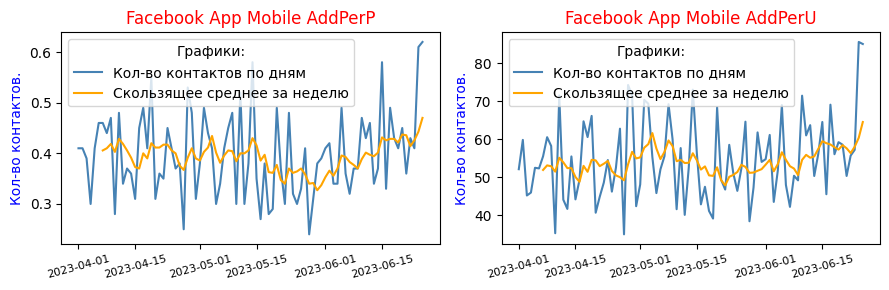

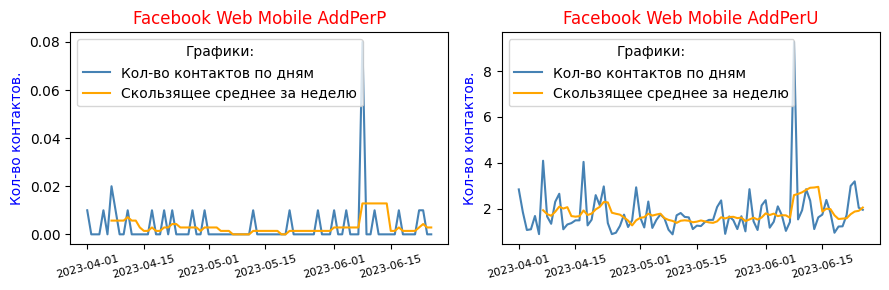

In [125]:
visual_stationarity_6(df_dd, list_columns)

Отмечаем отсутствие визуально фиксируемого тренда. Проверим вывод о стационарности временных рядов.

**Тест `Дики-Фуллера` (Dickey-Fuller test)**.

Используем пороговое значение, равное 0.05 (5%)

In [126]:
# Настроим, чтобы числа в датасетах отражались с 3 знаками после запятой
pd.set_option('display.float_format', '{:.3f}'.format) 

df_test_DF = pd.DataFrame(columns=[
    'source', 'ADF criterion', 'P-value', 'Critical value 1%',
    'Critical values 5%', 'Conclusion'])

# Запуск исполнения теста
test_DF(df_dd, list_columns)

# Просмотр датафрейма с результатами
display(df_test_DF) 

# Удалим ненужный более датафрейм
del df_test_DF

,source,ADF criterion,P-value,Critical value 1%,Critical values 5%,Conclusion
0,Facebook Web Desktop AddPerP,-3.702,0.004,-3.444,-2.867,Стационарен.
1,Facebook Web Desktop AddPerU,-4.963,0.000,-3.444,-2.867,Стационарен.
2,Facebook App Mobile AddPerP,-3.411,0.011,-3.444,-2.867,Стационарен.
3,Facebook App Mobile AddPerU,-3.709,0.004,-3.444,-2.867,Стационарен.
4,Facebook Web Mobile AddPerP,-13.997,0.000,-3.443,-2.867,Стационарен.
5,Facebook Web Mobile AddPerU,-13.552,0.000,-3.443,-2.867,Стационарен.


**Промежуточные выводы** для всех шести источников 'Facebook':
* признаков устойчивого тренда для всех трёх источников Facebook не наблюдается;
* отмечаю кратковременные повышения и понижения время контакта пользователя с медиа объектом;
* периодичность наблюдается в работе всех источников информации:    
    * Активность запросов *Facebook Web Desktop (ПК и ноутбуки)* очень сильно различается по показателям *AddPerP* и *AddPerU*.
    * *Facebook App Mobile (мобильное приложение)* тоже демонстрирует отличающиееся поведение между *AddPerP* и *AddPerU*.
    * *Facebook Web Mobile (мобильный браузер)*. Максимальные пики по четвергам непонятны.
    * Все 6 источников информации показывают периодичность продолжительностью в одну неделю.

## 4.4. Анализ `Average Daily Duration` по возрастной  категории 'до 12 лет'.

In [127]:
print("Размер полного датафрейма:", df_dd.shape)

Размер полного датафрейма: (516, 20)


In [128]:
df_dd_0 = df_dd[df_dd.age == 0]
if (df_dd.shape[0] / 6 == df_dd_0.shape[0]):
    print("Выделение части датафрейма проведено корректно.")
else:
    print("Произошла потеря данных!")
    
print("Размер датафрейма по возрастной категории 'до 12 лет':", 
      df_dd_0.shape)
df_dd_0.head(3)

Выделение части датафрейма проведено корректно.
Размер датафрейма по возрастной категории 'до 12 лет': (86, 20)


,Date,2gis Web Desktop AddPerP,2gis Web Desktop AddPerU,2gis App Mobile AddPerP,2gis App Mobile AddPerU,2gis Web Mobile AddPerP,2gis Web Mobile AddPerU,Discord Web Desktop AddPerP,Discord Web Desktop AddPerU,Discord App Mobile AddPerP,Discord App Mobile AddPerU,Discord Web Mobile AddPerP,Discord Web Mobile AddPerU,Facebook Web Desktop AddPerP,Facebook Web Desktop AddPerU,Facebook App Mobile AddPerP,Facebook App Mobile AddPerU,Facebook Web Mobile AddPerP,Facebook Web Mobile AddPerU,age
0,2023-04-01,0.010,3.270,0.360,10.430,0.000,0.930,0.030,8.690,0.430,20.980,0.000,0.410,0.020,14.530,0.070,9.400,0.000,0.370,0
1,2023-04-02,0.010,2.290,0.300,9.110,0.000,0.970,0.030,8.370,0.440,20.240,0.000,0.220,0.030,19.410,0.070,11.240,0.000,0.270,0
2,2023-04-03,0.020,4.310,0.260,6.960,0.010,1.100,0.010,3.410,0.350,17.810,0.000,0.490,0.030,18.170,0.060,8.310,0.000,0.180,0


Для удобства работы с большим количеством колонок упакуем их к словарь.

In [129]:
dict_columns = {}

list_columns = df_dd_0.columns[1:-1]# Убрали Date и age
for num in range(0, len(list_columns), 6):
    key_dict = list_columns[num].split()[0]
    list_6col = []
    for i in range(6):
        list_6col.append(" ".join(list_columns[num+i].split()[1:]))
    dict_columns[key_dict] = list_6col

### 4.4.1. Графическое представление `Average Daily Duration` по возрастной  категории 'до 12 лет'.

Изобразим на графиках `Average Daily Duration` по возрастной категории 'до 12 лет'.

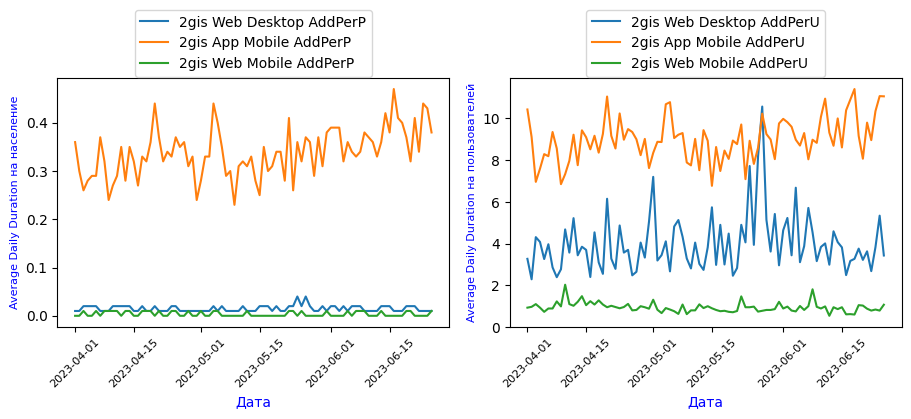

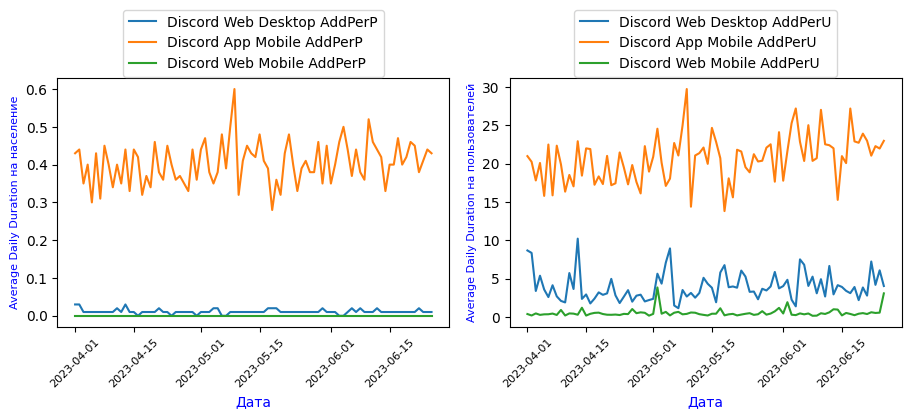

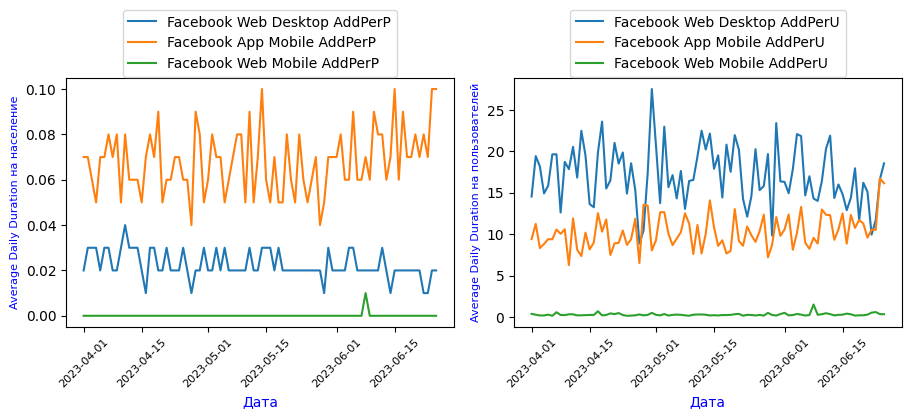

In [130]:
for k_6col, v_6cols in dict_columns.items():
    plot_average_daily_duration(df_dd_0, k_6col, v_6cols)

**Отмечаем**:
* На глаз, в сумме по всем возрастным категориям, устойчивых тенденции не видно.
* Присутствуют аномальные высокие выбросы, свидетельствующие о повышении интереса к какой-то определённой теме, сопровождающийся увеличением времени контакта с медиа объектом.

### 4.4.2. Анализ на наличие трендов и сезонности `Average Daily Duration` по возрастной категории 'до 12 лет'.

#### 4.4.2.1. Наличие трендов и периодичности по данным от `2gis`.

  0%|          | 0/6 [00:00<?, ?it/s]

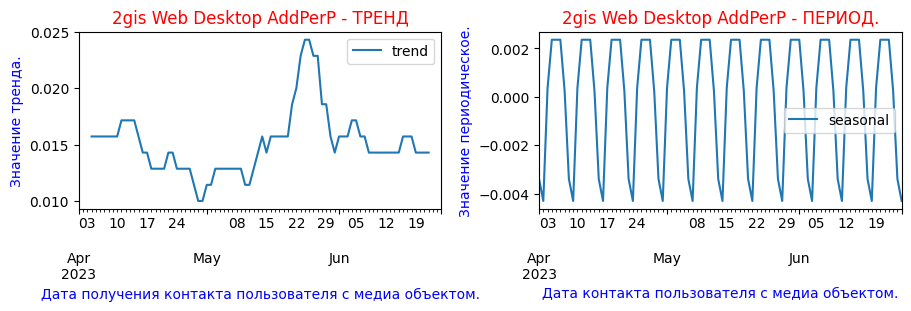

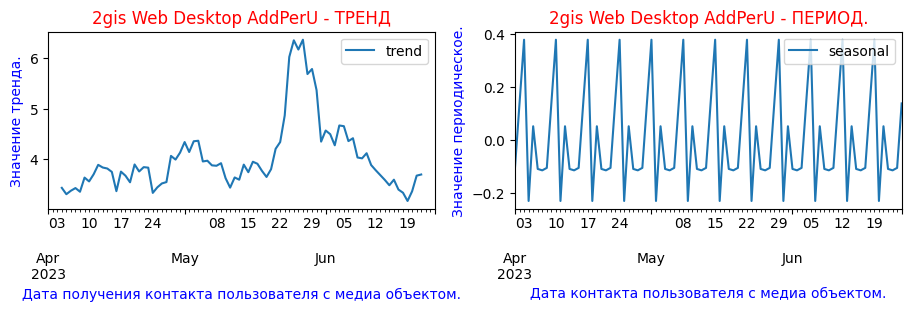

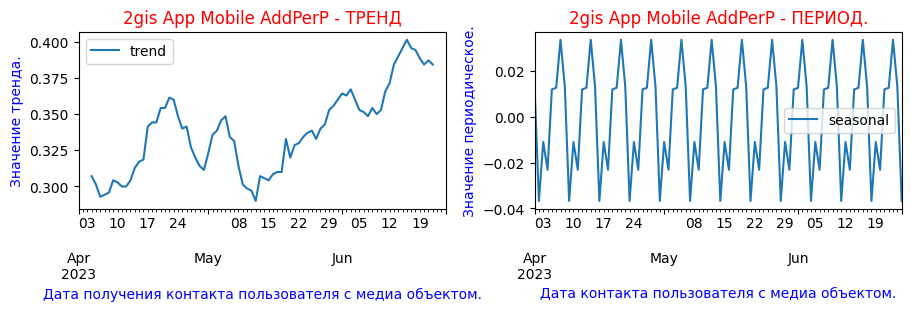

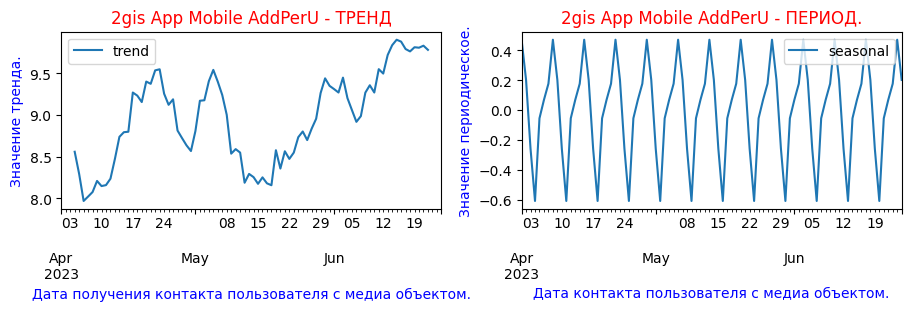

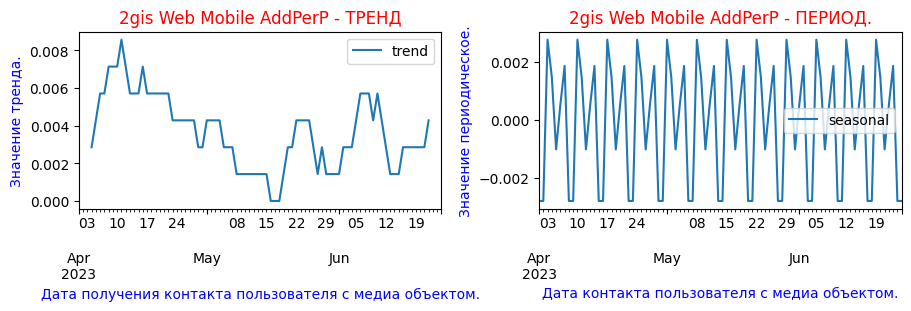

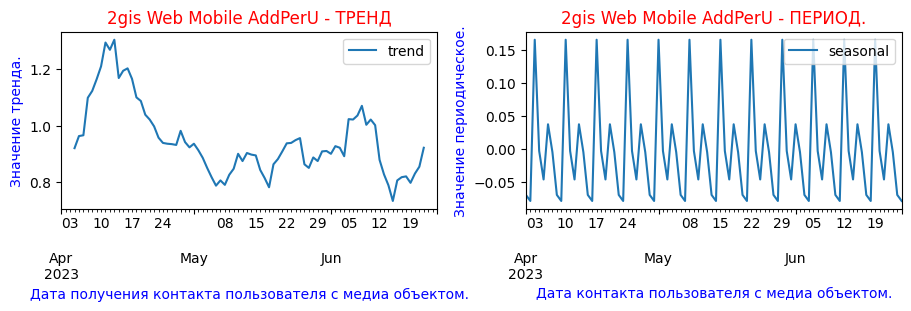

In [131]:
key_dict = '2gis' # Установим в качестве источника информации '2gis'.
list_columns = [str(key_dict + ' ' + \
                dict_columns[key_dict][i]) for i in range(6)]

decomposed = trend_seasonality(df_dd_0, key_dict, list_columns)

**Отмечаем**:
* признаков устойчивого **тренда** для всех трёх источников `2gis` не наблюдается;
* отмечаю кратковременные повышения и понижения время контакта пользователя с медиа объектом:
    * *Web Desktop*. В диапазоне 22-29 мая имеется чётко выраженный максимум. Этому могут быть разные причины, например, выпускники школ искали результаты ЕГЭ, люди выбирали, как провести летний отпуск, ...
    * *App Mobile* имеет тенденцию к повышению с середины мая и до самого конца наблюжений в конце июня. Люди интерсуются, как провести лето!
    * *Web Mobile* на первый взгляд имеет максимум в апреле, но если сравнить в абсолютных единицах (1.3) с указанными выше источниками (6 и 10), то оказывается, это незначительный всплеск.
* **периодичность** (или сезонность) для всех трёх источников `2gis`:
    * везде наблюдается `ярко выраженная сезонность, с периодом около недели`. Надо рассмотреть ее подробнее.

**Изучим сезонную (периодическую) составляющую за неделю.**

In [132]:
# Проверим правильность выбранного источника информации.
print(list_columns)

['2gis Web Desktop AddPerP', '2gis Web Desktop AddPerU', '2gis App Mobile AddPerP', '2gis App Mobile AddPerU', '2gis Web Mobile AddPerP', '2gis Web Mobile AddPerU']


Дни недели:
23-04-01 - Sat           23-04-02 - Sun           23-04-03 - Mon           23-04-04 - Tue
23-04-05 - Wed           23-04-06 - Thu           23-04-07 - Fri           23-04-08 - Sat
23-04-09 - Sun           23-04-10 - Mon           23-04-11 - Tue           23-04-12 - Wed
23-04-13 - Thu           23-04-14 - Fri           23-04-15 - Sat           23-04-16 - Sun


  0%|          | 0/3 [00:00<?, ?it/s]

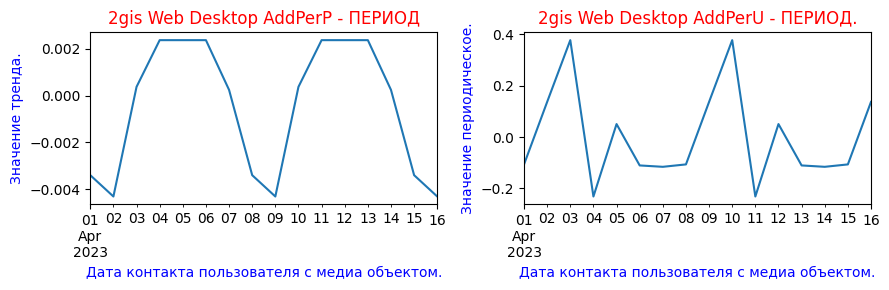

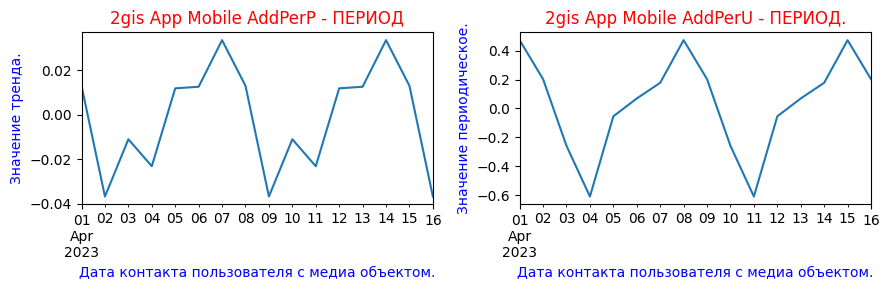

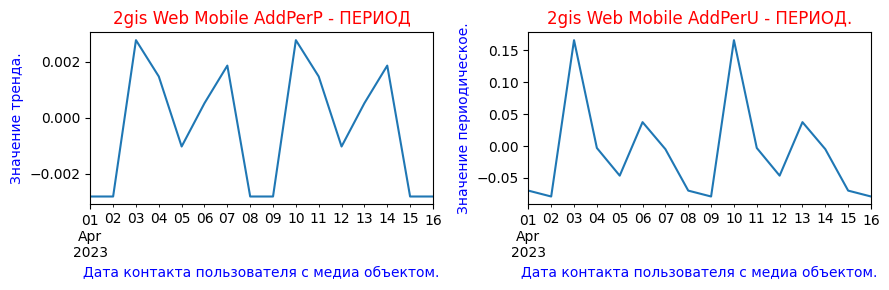

In [133]:
date_start, date_stop = '2023-04-01', '2023-04-16'
 
calc_print_weekday(date_start, date_stop) 
volume_seasonal(df_dd_0, list_columns)

**Отмечаем**:
* Активность запросов *2gis* для всех источников 'AddPerP' (Average Daily Duration на население) пропадает в выходные дни, резко возрастает в понедельник и падает только в субботу. Скорее всего, люди пользуются диджитал-ресурсами в рабочее время. такое же поведение демонстрирует и *2 gis Web Mobile AddPerU*.
* Для *2gis App Mobile AddPerU* и *2gis Web Mobile AddPerU* замечены непонятные абсолютные минимумы по вторникам.

**Оценка стационарности временного ряда.**

Оценку стационарности проведём в способами:
* `визуально`,
* применив тест `Дики-Фуллера`.

  0%|          | 0/3 [00:00<?, ?it/s]

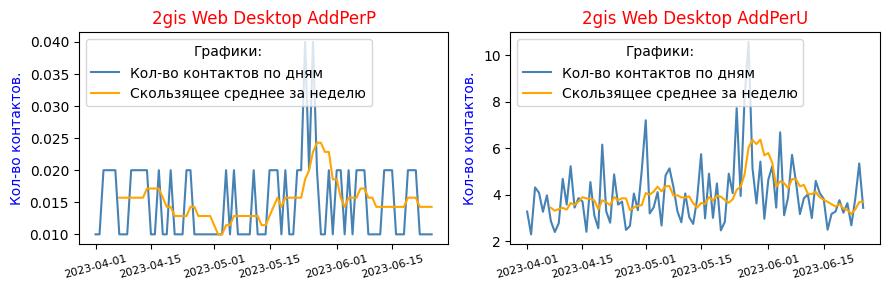

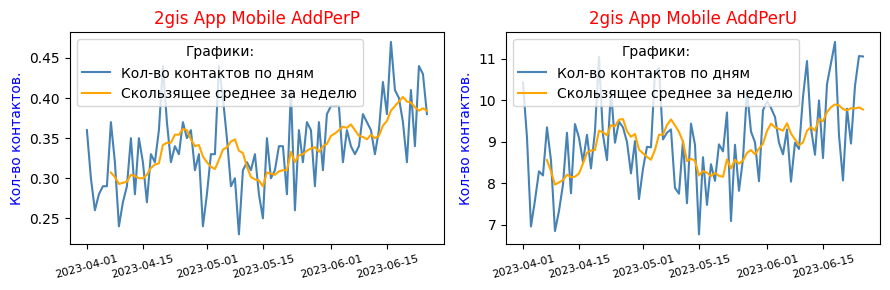

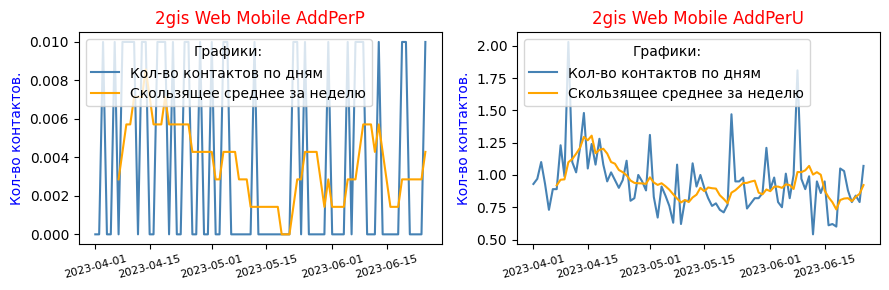

In [134]:
visual_stationarity_6(df_dd_0, list_columns)

**Отмечаем** отсутствие визуально фиксируемого тренда. Проверим вывод о стационарности временных рядов.

**Тест `Дики-Фуллера` (Dickey-Fuller test)**.

Используем пороговое значение, равное 0.05 (5%).

In [135]:
# Настроим, чтобы числа в датасетах отражались с 3 знаками после запятой
pd.set_option('display.float_format', '{:.3f}'.format) 

df_test_DF = pd.DataFrame(columns=[
    'source', 'ADF criterion', 'P-value', 'Critical value 1%',
    'Critical values 5%', 'Conclusion'])

# Запуск исполнения теста
test_DF(df_dd_0, list_columns)

# Просмотр датафрейма с результатами
display(df_test_DF) 

# Удалим ненужный более датафрейм
del df_test_DF

,source,ADF criterion,P-value,Critical value 1%,Critical values 5%,Conclusion
0,2gis Web Desktop AddPerP,-4.858,0.000,-3.511,-2.897,Стационарен.
1,2gis Web Desktop AddPerU,-3.925,0.002,-3.513,-2.897,Стационарен.
2,2gis App Mobile AddPerP,-1.186,0.679,-3.516,-2.899,НЕ стационарен!
3,2gis App Mobile AddPerU,-6.173,0.000,-3.510,-2.896,Стационарен.
4,2gis Web Mobile AddPerP,-6.939,0.000,-3.511,-2.897,Стационарен.
5,2gis Web Mobile AddPerU,-7.321,0.000,-3.510,-2.896,Стационарен.


**Отмечаем**:
* Тест предполагает тренд в источнике *2gis App Mobile AddPerP* по возрастной категории 'до 12 лет'.
* Остальные источники тренда не имеют.
**Промежуточные выводы** для всех шести источников '2gis':
* выявлен тренд к повышению для *2gis App Mobile AddPerP*;
* отмечаю кратковременные повышения и понижения время контакта пользователя с медиа объектом:
    * Web Desktop. В диапазоне 22-29 мая имеется чётко выраженный максимум. Этому могут быть разные причины, например, выпускники школ искали результаты ЕГЭ, люди выбирали, как провести летний отпуск, ...
    * App Mobile имеет тенденцию к повышению с середины мая и до самого конца наблюжений в конце июня. Люди интерсуются, как провести лето!
    * Web Mobile на первый взгляд имеет максимум в апреле, но если сравнить в абсолютных единицах (1.3) с указанными выше источниками (6 и 10), то оказывается, это незначительный всплеск.

#### 4.4.2.2. Наличие трендов и периодичности по данным от `Discord`.

  0%|          | 0/6 [00:00<?, ?it/s]

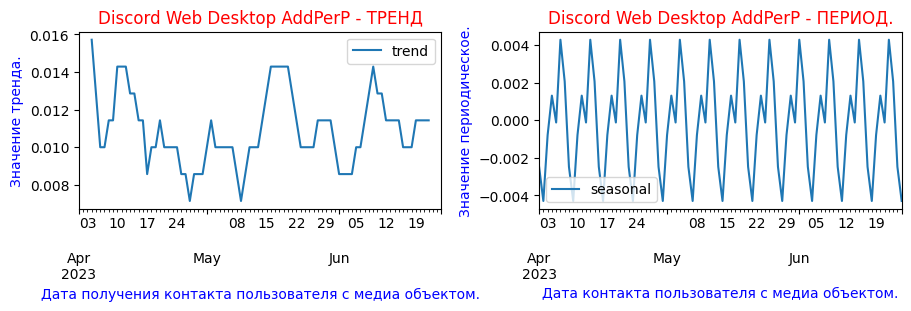

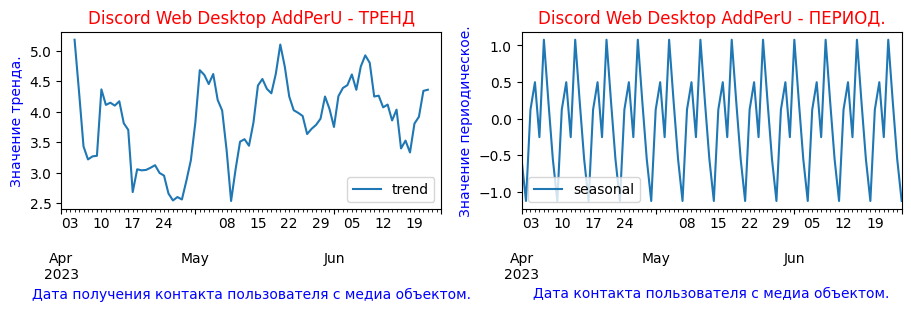

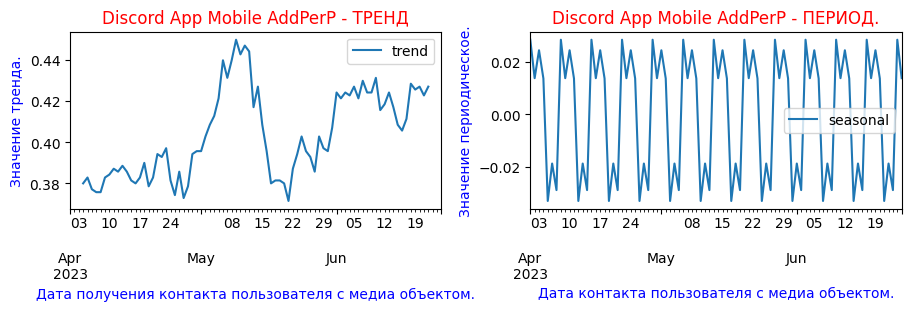

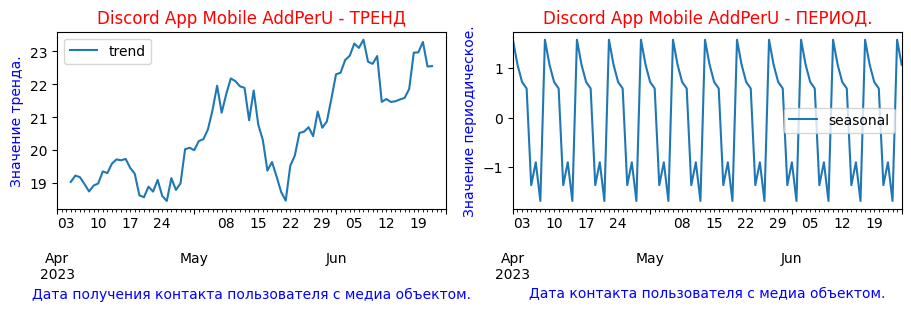

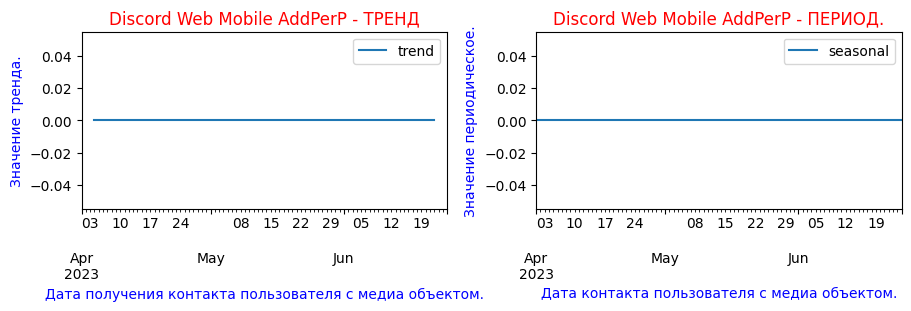

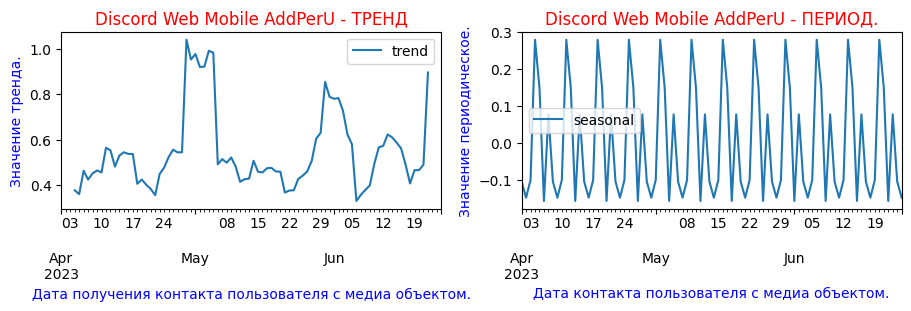

In [136]:
key_dict = 'Discord' # Установим в качестве источника информации 'Discord'.
list_columns = [str(key_dict + ' ' + \
                dict_columns[key_dict][i]) for i in range(6)]

decomposed = trend_seasonality(df_dd_0, key_dict, list_columns)

**Отмечаем**:
* признаков устойчивого **тренда** для всех трёх источников `Discord` не наблюдается;
* замечаем полное отсутствие значений для источника *Discord Web Desktop AddPerU*;
* **периодичность** (или сезонность) для всех трёх источников `Discord`:
    * везде наблюдается `ярко выраженная сезонность, с периодом около недели`. Надо рассмотреть ее подробнее.

**Изучим сезонную (периодическую) составляющую за неделю.**

Дни недели:
23-04-01 - Sat           23-04-02 - Sun           23-04-03 - Mon           23-04-04 - Tue
23-04-05 - Wed           23-04-06 - Thu           23-04-07 - Fri           23-04-08 - Sat
23-04-09 - Sun           23-04-10 - Mon           23-04-11 - Tue           23-04-12 - Wed
23-04-13 - Thu           23-04-14 - Fri           23-04-15 - Sat           23-04-16 - Sun


  0%|          | 0/3 [00:00<?, ?it/s]

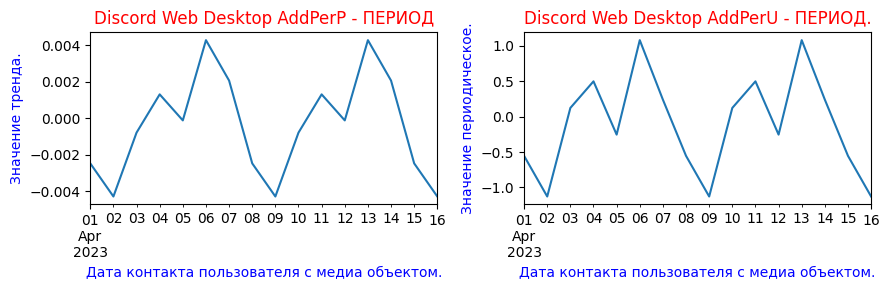

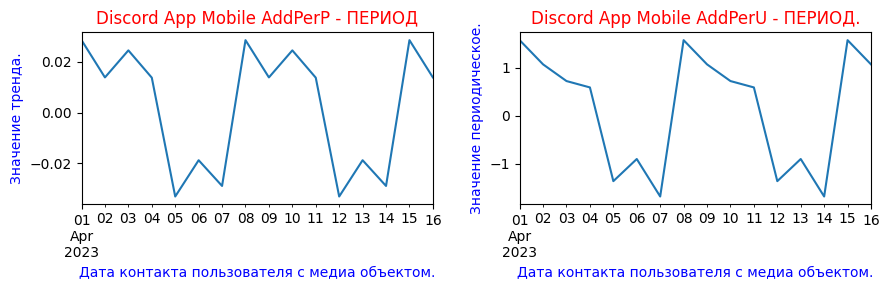

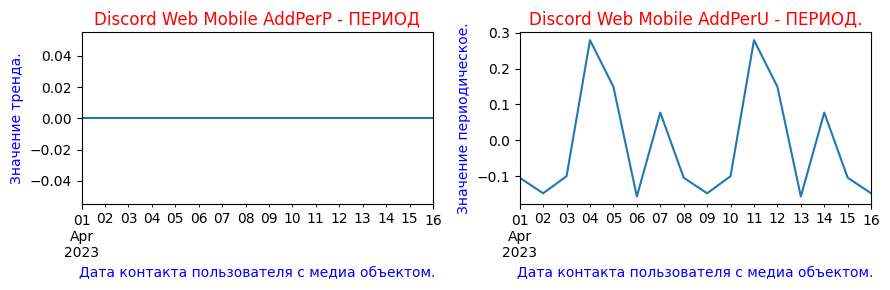

In [137]:
date_start, date_stop = '2023-04-01', '2023-04-16'
 
calc_print_weekday(date_start, date_stop) 
volume_seasonal(df_dd_0, list_columns)

**Отмечаем**:
* Активность запросов *Discord Web Desktop (ПК и ноутбуки)* пропадает в выходные дни, резко возрастает в понедельник и падает только в субботу. Скорее всего, люди пользуются диджитал-ресурсами в рабочее время.    
* *Discord Web Mobile AddPerP* не имееь значения. Вся информация - NULL.
* Поведение других источников непонятно.

**Оценка стационарности временного ряда.**

  0%|          | 0/3 [00:00<?, ?it/s]

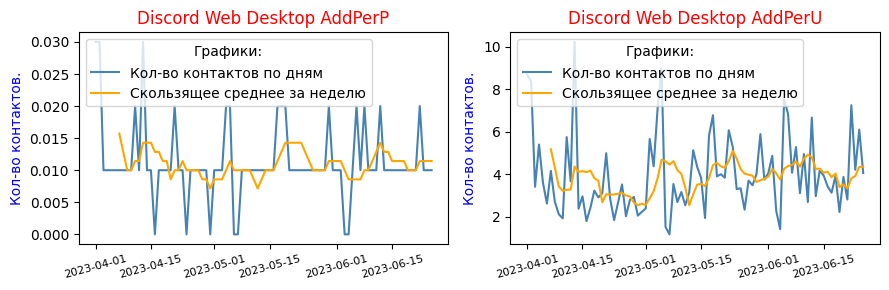

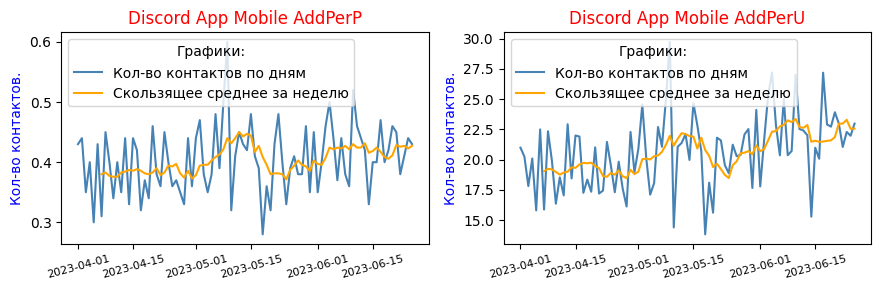

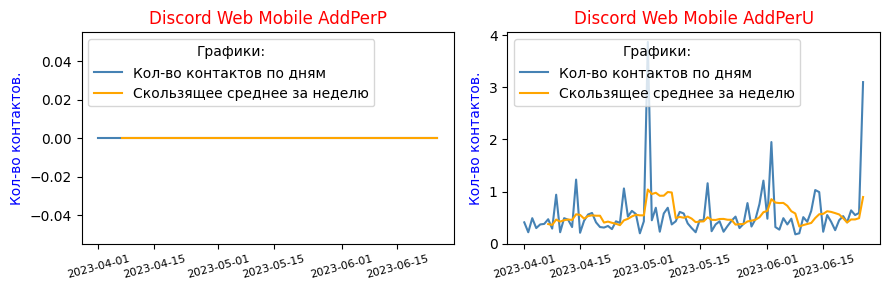

In [138]:
visual_stationarity_6(df_dd_0, list_columns)

**Отмечаем**:
* Отсутствие визуально фиксируемого тренда. Проверим вывод о стационарности временных рядов.
* Полностью пропущенны значения для 'Discord Web Mobile AddPerP'.

**Тест `Дики-Фуллера` (Dickey-Fuller test)**.

Используем пороговое значение, равное 0.05 (5%).

In [139]:
# Настроим, чтобы числа в датасетах отражались с 3 знаками после запятой
pd.set_option('display.float_format', '{:.3f}'.format) 

df_test_DF = pd.DataFrame(columns=[
    'source', 'ADF criterion', 'P-value', 'Critical value 1%',
    'Critical values 5%', 'Conclusion'])

# Запуск исполнения теста
test_DF(df_dd_0, list_columns)

# Просмотр датафрейма с результатами
display(df_test_DF) 

# Удалим ненужный более датафрейм
del df_test_DF

,source,ADF criterion,P-value,Critical value 1%,Critical values 5%,Conclusion
0,Discord Web Desktop AddPerP,-4.384,0.000,-3.515,-2.898,Стационарен.
1,Discord Web Desktop AddPerU,-8.098,0.000,-3.510,-2.896,Стационарен.
2,Discord App Mobile AddPerP,-2.073,0.255,-3.516,-2.899,НЕ стационарен!
3,Discord App Mobile AddPerU,-2.072,0.256,-3.521,-2.901,НЕ стационарен!
4,Discord Web Mobile AddPerP,NaN,NaN,-3.510,-2.896,НЕ стационарен!
5,Discord Web Mobile AddPerU,-8.091,0.000,-3.510,-2.896,Стационарен.


**Промежуточные выводы** для всех шести источников 'Discord':
* Тест предполагает тренд в источниках по возрастной категории 'до 12 лет':
    * *Discord App Mobile AddPerP*;
    * *Discord App Mobile AddPerU*;
    * *Discord Web Mobile AddPerP*.
* Остальные источники тренда не имеют.
* отмечаю кратковременные повышения и понижения время контакта пользователя с медиа объектом:
    * Web Desktop. В диапазоне 22-29 мая имеется чётко выраженный максимум. Этому могут быть разные причины, например, выпускники школ искали результаты ЕГЭ, люди выбирали, как провести летний отпуск, ...
    * App Mobile имеет тенденцию к повышению с середины мая и до самого конца наблюжений в конце июня. Люди интерсуются, как провести лето!
    * Web Mobile на первый взгляд имеет максимум в апреле, но если сравнить в абсолютных единицах (1.3) с указанными выше источниками (6 и 10), то оказывается, это незначительный всплеск.

#### 4.4.2.3. Наличие трендов и периодичности по данным от `Facebook`.

  0%|          | 0/6 [00:00<?, ?it/s]

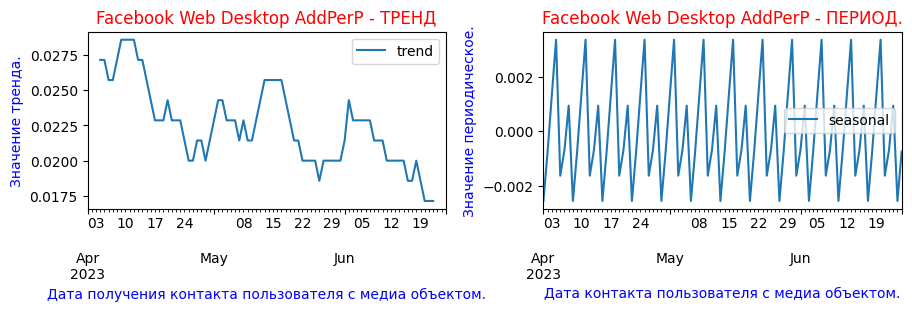

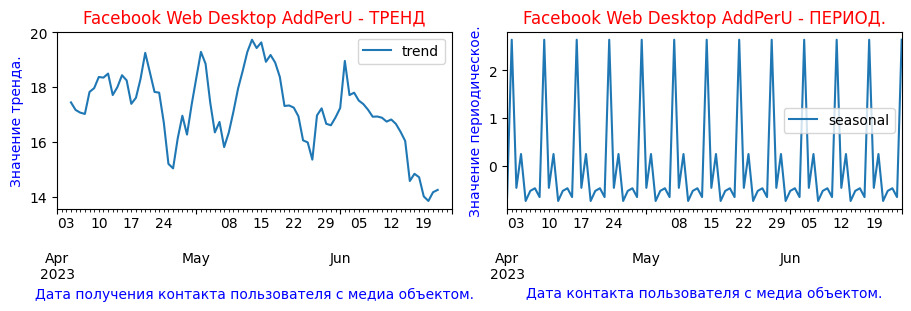

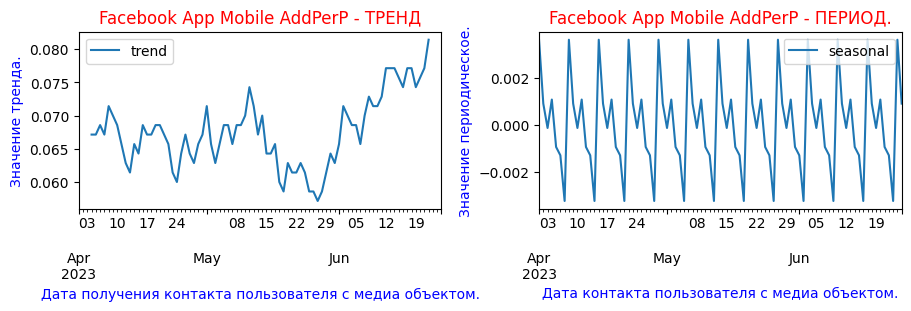

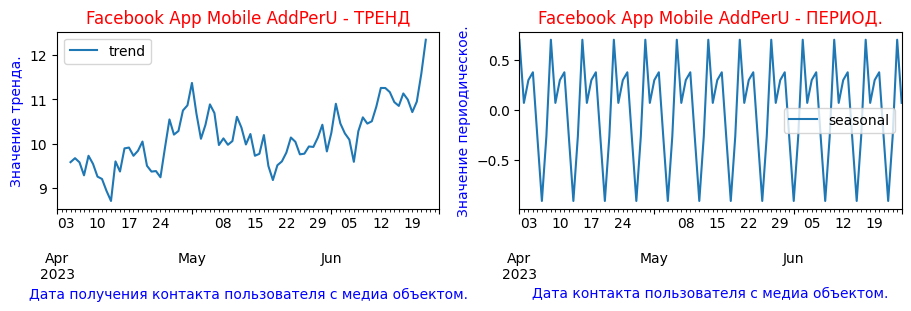

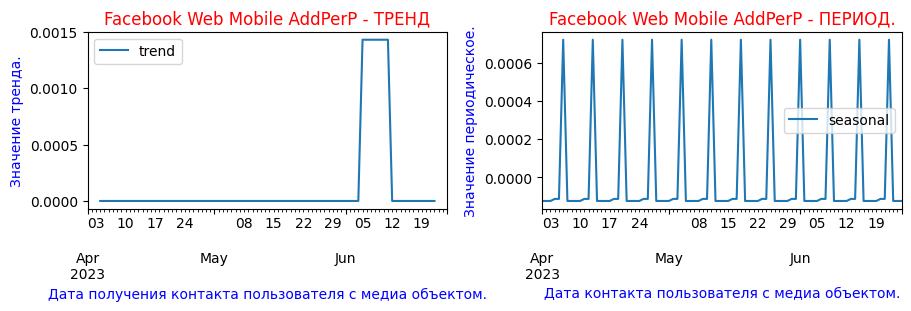

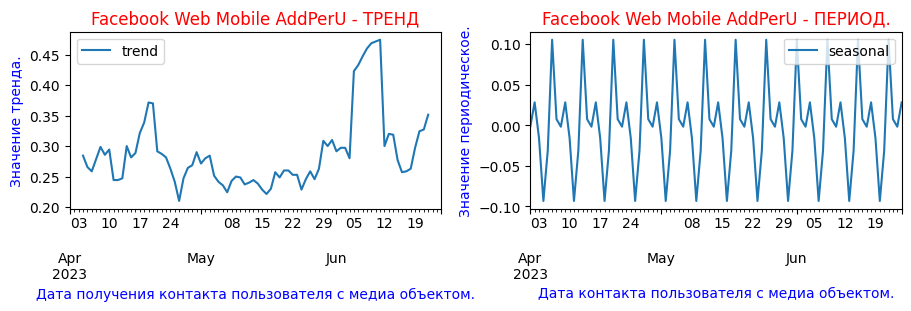

In [140]:
key_dict = 'Facebook' # Установим в качестве источника информации 'Discord'.
list_columns = [str(key_dict + ' ' + \
                dict_columns[key_dict][i]) for i in range(6)]

decomposed = trend_seasonality(df_dd_0, key_dict, list_columns)

**Отмечаем**:
* признаков устойчивого **тренда** для всех трёх источников `Facebook` не наблюдается;
* *Facebook App Mobile (мобильное приложение)* показывает устойчивое повышение с конца мая и весь июнь.
* *Facebook Web Mobile (мобильный браузер)* - непонятный пик в период с 5 по 12 июня.

**Изучим сезонную (периодическую) составляющую за неделю.**

Дни недели:
23-04-01 - Sat           23-04-02 - Sun           23-04-03 - Mon           23-04-04 - Tue
23-04-05 - Wed           23-04-06 - Thu           23-04-07 - Fri           23-04-08 - Sat
23-04-09 - Sun           23-04-10 - Mon           23-04-11 - Tue           23-04-12 - Wed
23-04-13 - Thu           23-04-14 - Fri           23-04-15 - Sat           23-04-16 - Sun


  0%|          | 0/3 [00:00<?, ?it/s]

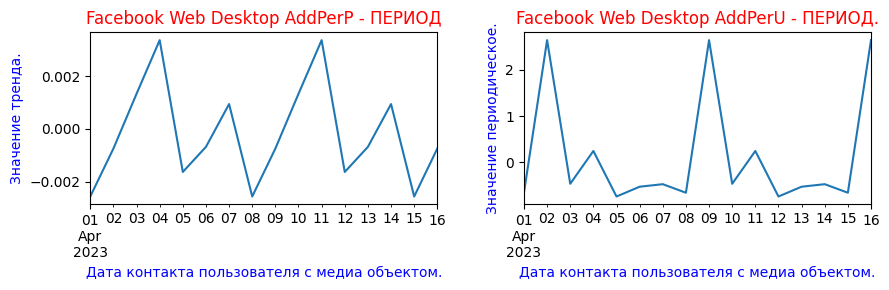

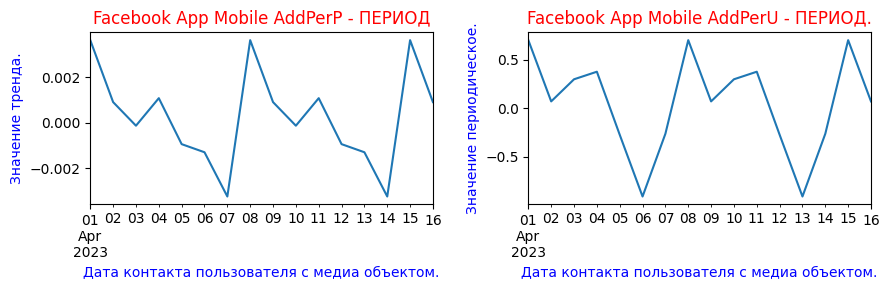

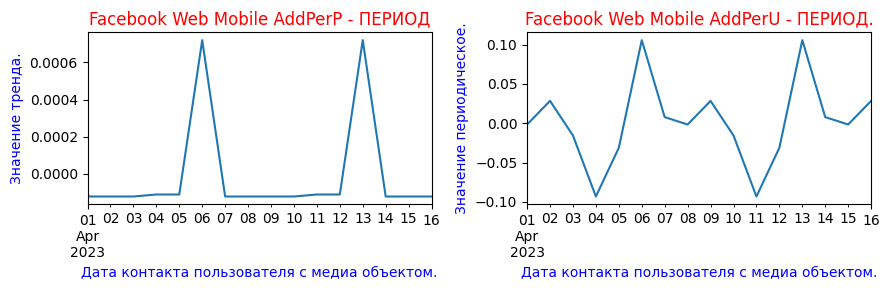

In [141]:
date_start, date_stop = '2023-04-01', '2023-04-16'
 
calc_print_weekday(date_start, date_stop) 
volume_seasonal(df_dd_0, list_columns)

**Отмечаем** для возрастной группы **до 12 лет**:
* Согласно *Facebook Web Desktop AddPerU* дети используют `ПК и ноутбуки` в основном по воскресеньям.
* Согласно *Facebook App Mobile* дети используют `мобильные приложение` в основном по субботам.
* Максимумы по четвергам *Facebook Web Mobile AddPerU* статистически незначимы. В основном этот источник имеет пропуски (NULL).

**Оценка стационарности временного ряда.**

  0%|          | 0/3 [00:00<?, ?it/s]

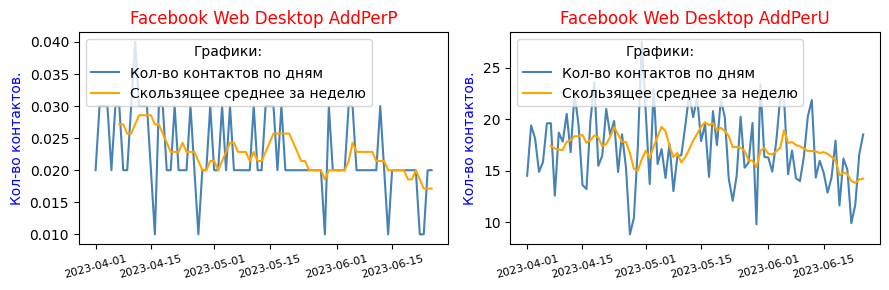

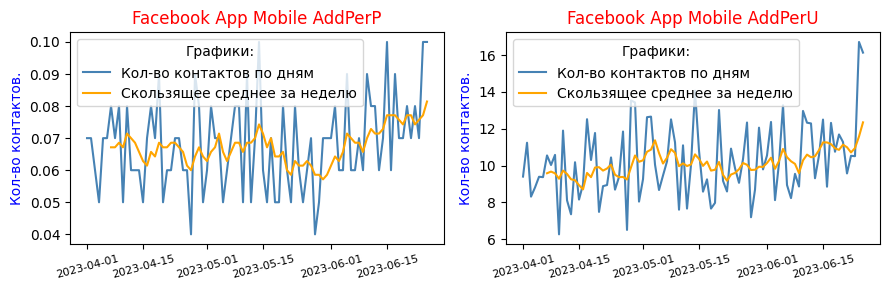

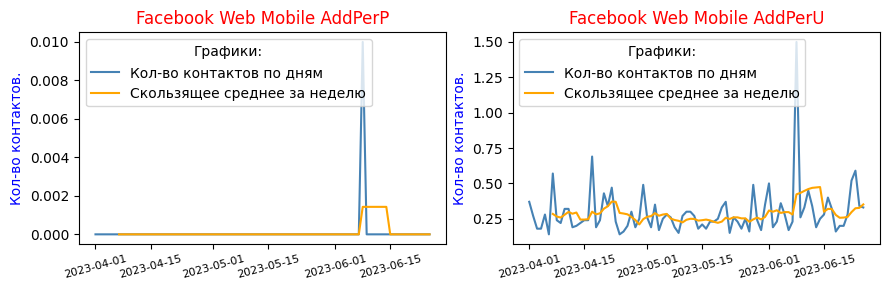

In [142]:
visual_stationarity_6(df_dd_0, list_columns)

**Отмечаем**:
* *Facebook Web Mobile AddPerU* в основном заполнен пропусками и имеет очень мало реальных значений.
* отсутствие визуально фиксируемого тренда. Проверим вывод о стационарности временных рядов.

**Тест `Дики-Фуллера` (Dickey-Fuller test)**.

Используем пороговое значение, равное 0.05 (5%).

In [143]:
# Настроим, чтобы числа в датасетах отражались с 3 знаками после запятой
pd.set_option('display.float_format', '{:.3f}'.format) 

df_test_DF = pd.DataFrame(columns=[
    'source', 'ADF criterion', 'P-value', 'Critical value 1%',
    'Critical values 5%', 'Conclusion'])

# Запуск исполнения теста
test_DF(df_dd_0, list_columns)

# Просмотр датафрейма с результатами
display(df_test_DF) 

# Удалим ненужный более датафрейм
del df_test_DF

,source,ADF criterion,P-value,Critical value 1%,Critical values 5%,Conclusion
0,Facebook Web Desktop AddPerP,-7.220,0.000,-3.510,-2.896,Стационарен.
1,Facebook Web Desktop AddPerU,-7.891,0.000,-3.510,-2.896,Стационарен.
2,Facebook App Mobile AddPerP,-0.039,0.955,-3.519,-2.900,НЕ стационарен!
3,Facebook App Mobile AddPerU,-0.449,0.902,-3.519,-2.900,НЕ стационарен!
4,Facebook Web Mobile AddPerP,-9.220,0.000,-3.510,-2.896,Стационарен.
5,Facebook Web Mobile AddPerU,-9.187,0.000,-3.510,-2.896,Стационарен.


**Промежуточные выводы** для всех шести источников 'Facebook' по возрастной группе **до 12 лет**:
* Тест предполагает тренд в источниках по возрастной категории 'до 12 лет':
    * *Facebook App Mobile AddPerP*;
    * *Facebook Web Mobile AddPerP*.
* Остальные источники тренда не имеют.
* *Facebook App Mobile (мобильное приложение)* показывает устойчивое повышение с конца мая и весь июнь.
* *Facebook Web Mobile (мобильный браузер)* - непонятный пик в период с 5 по 12 июня
* Согласно *Facebook Web Desktop AddPerU* дети используют `ПК и ноутбуки` в основном по воскресеньям.
* Согласно *Facebook App Mobile* дети используют `мобильные приложение` в основном по субботам.
* *Facebook Web Mobile AddPerU* в основном заполнен пропусками и имеет очень мало реальных значений.

In [144]:
# уберем из памяти ненужный более датафрейм.
del df_dd_0

## 4.5. Анализ `Average Daily Duration` по возрастной  категории 'от 12 до 24 лет'.

In [145]:
print("Размер полного датафрейма:", df_dd.shape)

df_dd_12 = df_dd[df_dd.age == 12]
if (df_dd.shape[0] / 6 == df_dd_12.shape[0]):
    print("Выделение части датафрейма проведено корректно.")
else:
    print("Произошла потеря данных!")
    
print("Размер датафрейма по возрастной категории 'до 12 лет':", 
      df_dd_12.shape)
df_dd_12.head(3)

Размер полного датафрейма: (516, 20)
Выделение части датафрейма проведено корректно.
Размер датафрейма по возрастной категории 'до 12 лет': (86, 20)


,Date,2gis Web Desktop AddPerP,2gis Web Desktop AddPerU,2gis App Mobile AddPerP,2gis App Mobile AddPerU,2gis Web Mobile AddPerP,2gis Web Mobile AddPerU,Discord Web Desktop AddPerP,Discord Web Desktop AddPerU,Discord App Mobile AddPerP,Discord App Mobile AddPerU,Discord Web Mobile AddPerP,Discord Web Mobile AddPerU,Facebook Web Desktop AddPerP,Facebook Web Desktop AddPerU,Facebook App Mobile AddPerP,Facebook App Mobile AddPerU,Facebook Web Mobile AddPerP,Facebook Web Mobile AddPerU,age
86,2023-04-01,0.010,3.920,0.310,7.640,0.000,0.980,0.090,10.280,2.010,22.600,0.000,0.390,0.000,0.030,0.010,3.660,0.000,0.090,12
87,2023-04-02,0.000,0.990,0.170,4.110,0.000,0.420,0.110,11.160,1.950,20.120,0.000,0.250,0.000,0.070,0.010,5.240,0.000,0.130,12
88,2023-04-03,0.010,2.830,0.210,4.820,0.000,0.770,0.000,0.790,1.630,18.950,0.000,0.440,0.000,0.440,0.010,1.550,0.000,0.180,12


Для удобства работы с с повторяющимися по функционалу колонками упакуем их к словарь.

In [146]:
dict_columns = {}

list_columns = df_dd_12.columns[1:-1]# Убрали Date и age
for num in range(0, len(list_columns), 6):
    key_dict = list_columns[num].split()[0]
    list_6col = []
    for i in range(6):
        list_6col.append(" ".join(list_columns[num+i].split()[1:]))
    dict_columns[key_dict] = list_6col

### 4.5.1. Графическое представление `Average Daily Duration` по возрастной  категории 'от 12 до 24 лет'.

Изобразим на графиках `Average Daily Duration` о возрастной категории 'от 12 до 24 лет'.

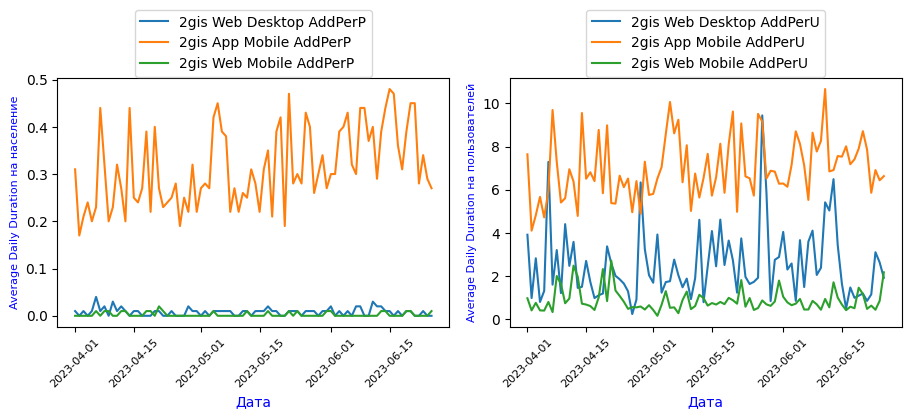

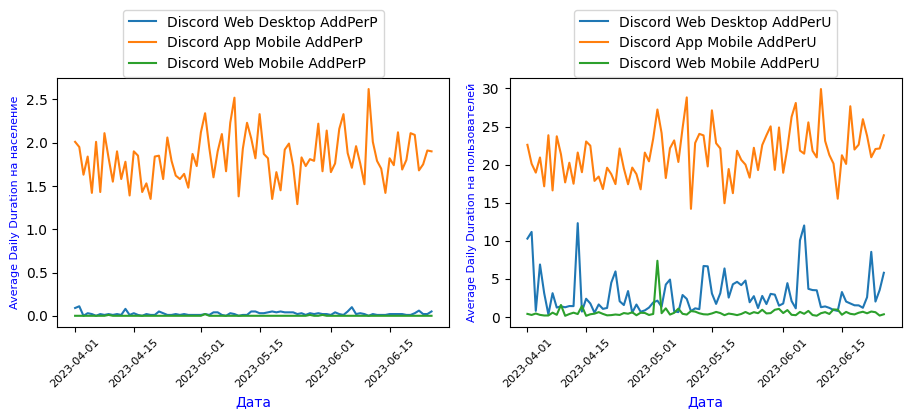

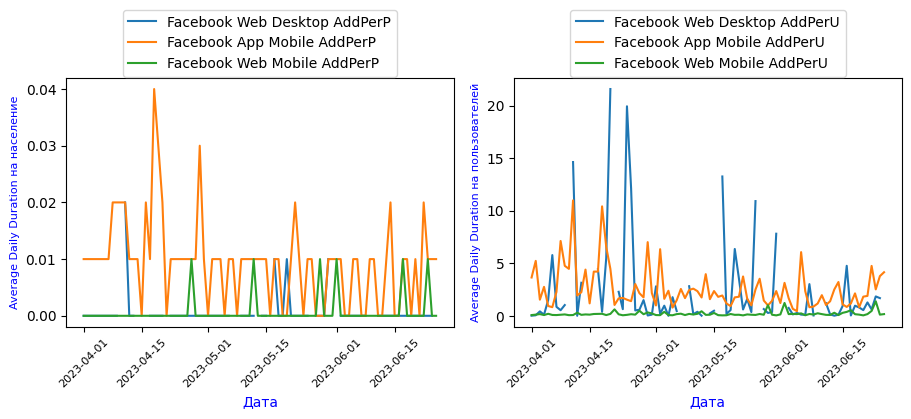

In [147]:
for k_6col, v_6cols in dict_columns.items():
    plot_average_daily_duration(df_dd_12, k_6col, v_6cols)

**Отмечаем**:
* устойчивые тренды не наблюдаются;
* Присутствуют аномальные высокие выбросы, свидетельствующие о повышении интереса к какой-то определённой теме, сопровождающийся увеличением времени контакта с медиа объектом;
* В источниках 'Facebook Web Desktop AppPerP' и 'Facebook Web Mobile AppPerP' очень много пропущенных значений (NULL).

### 4.5.2. Анализ на наличие трендов и сезонности `Average Daily Duration` по возрастной категории 'от 12 до 24 лет'.¶

#### 4.5.2.1. Наличие трендов и периодичности по данным от `2gis`.

  0%|          | 0/6 [00:00<?, ?it/s]

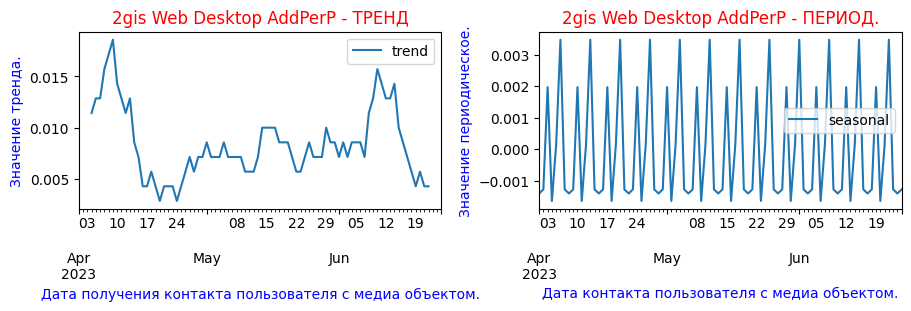

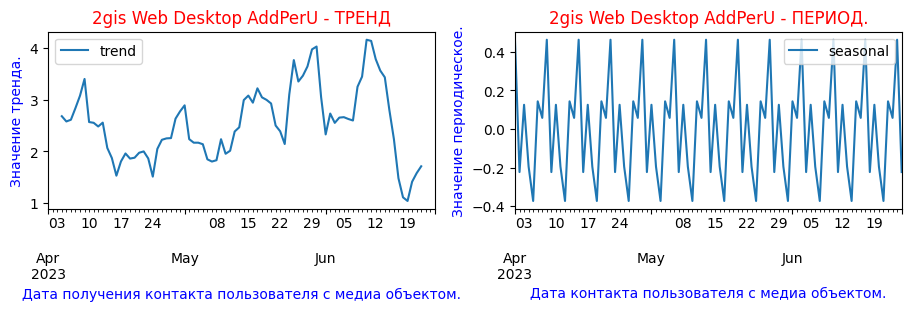

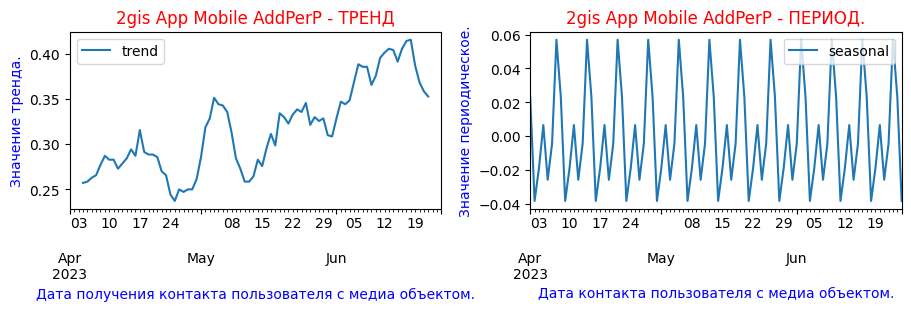

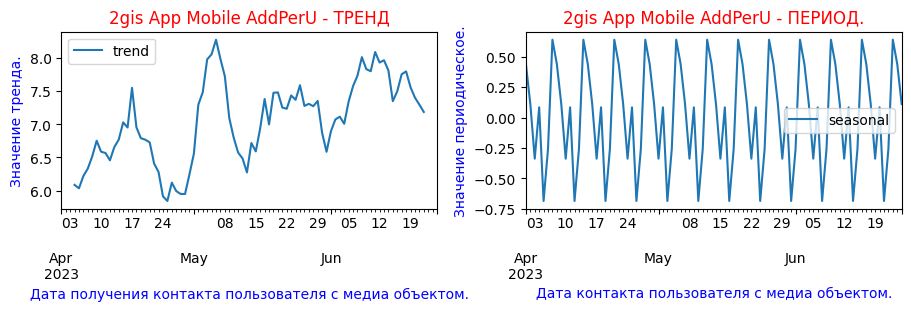

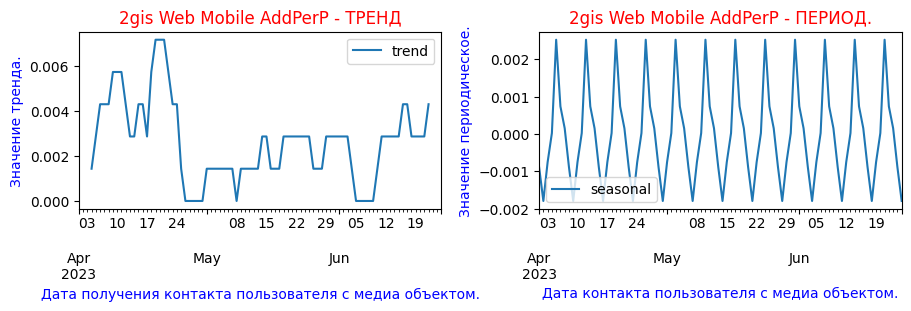

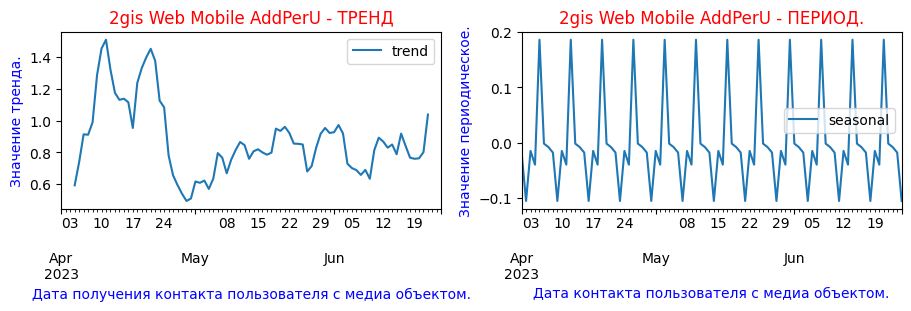

In [148]:
key_dict = '2gis' # Установим в качестве источника информации '2gis'.
list_columns = [str(key_dict + ' ' + \
                dict_columns[key_dict][i]) for i in range(6)]

decomposed = trend_seasonality(df_dd_12, key_dict, list_columns)

**Отмечаем**:
* визуально отмечаем тренд к возрастанию пользования источников `2gis App Mobile`;
* для остальных источников устойчивых тенденция не наблюдается.
* **периодичность** (или сезонность) для всех трёх источников `2gis`:
    * везде наблюдается `ярко выраженная сезонность, с периодом около недели`. Надо рассмотреть ее подробнее.

**Изучим сезонную (периодическую) составляющую за неделю.**

Дни недели:
23-04-01 - Sat           23-04-02 - Sun           23-04-03 - Mon           23-04-04 - Tue
23-04-05 - Wed           23-04-06 - Thu           23-04-07 - Fri           23-04-08 - Sat
23-04-09 - Sun           23-04-10 - Mon           23-04-11 - Tue           23-04-12 - Wed
23-04-13 - Thu           23-04-14 - Fri           23-04-15 - Sat           23-04-16 - Sun


  0%|          | 0/3 [00:00<?, ?it/s]

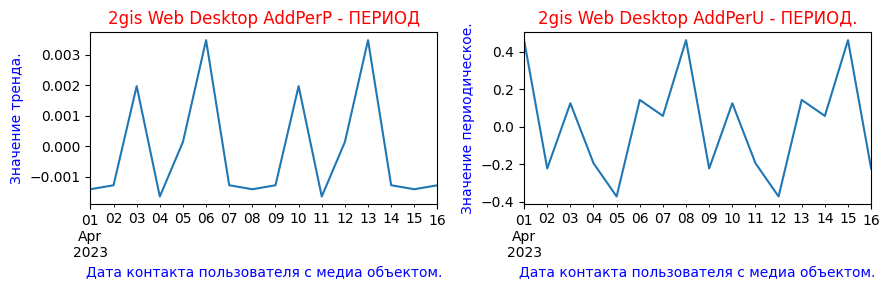

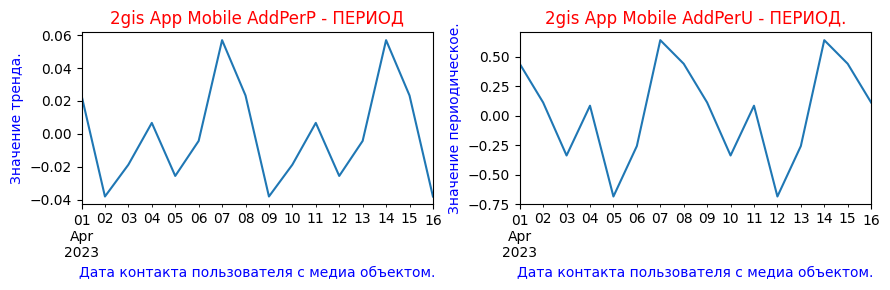

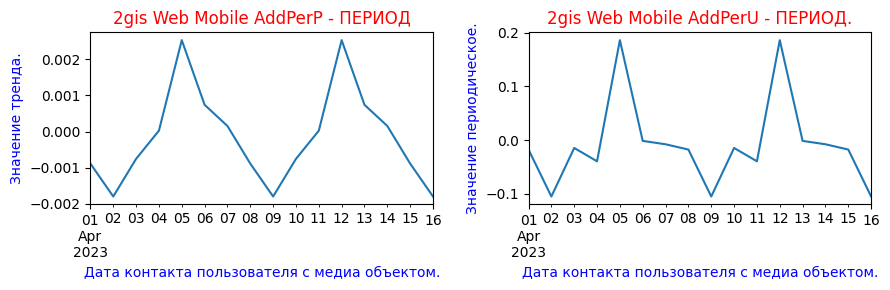

In [149]:
date_start, date_stop = '2023-04-01', '2023-04-16'
 
calc_print_weekday(date_start, date_stop) 
volume_seasonal(df_dd_12, list_columns)

**Отмечаем**:
* поведение посетителей возрастной категории от 12 до 24 лет совершенно неописуемо. Закономерности есть, но понять их не могу.

**Оценка стационарности временного ряда.**

Оценку стационарности проведём в способами:
* `визуально`,
* применив тест `Дики-Фуллера`.

  0%|          | 0/3 [00:00<?, ?it/s]

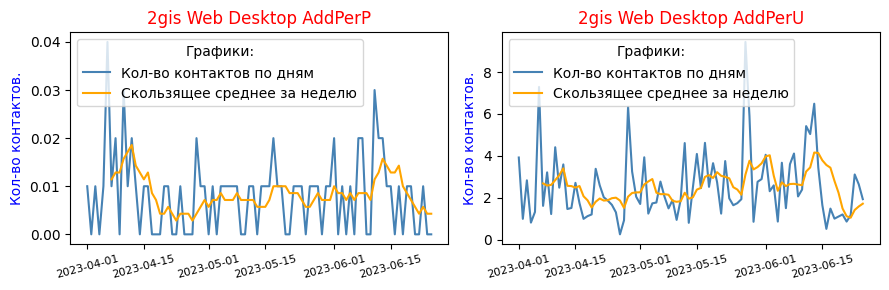

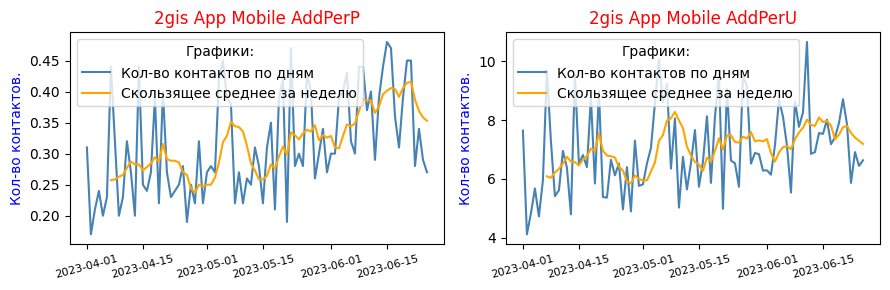

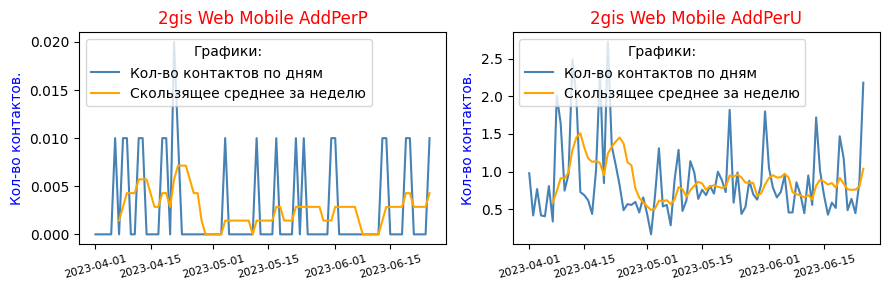

In [150]:
visual_stationarity_6(df_dd_12, list_columns)

**Отмечаем**:
* наблюдаем тренд к повышению для источника `2gis App Mobile`. Проверю свои наблюдения о не стационарности временных рядов.
* Большое количество пропущенных значений для `2gis Web Desktop` и `2gis Web Mobile`.

**Тест `Дики-Фуллера` (Dickey-Fuller test)**.

Используем пороговое значение, равное 0.05 (5%).

In [151]:
# Настроим, чтобы числа в датасетах отражались с 3 знаками после запятой
pd.set_option('display.float_format', '{:.3f}'.format) 

df_test_DF = pd.DataFrame(columns=[
    'source', 'ADF criterion', 'P-value', 'Critical value 1%',
    'Critical values 5%', 'Conclusion'])

# Запуск исполнения теста
test_DF(df_dd_12, list_columns)

# Просмотр датафрейма с результатами
display(df_test_DF) 

# Удалим ненужный более датафрейм
del df_test_DF

,source,ADF criterion,P-value,Critical value 1%,Critical values 5%,Conclusion
0,2gis Web Desktop AddPerP,-8.702,0.000,-3.510,-2.896,Стационарен.
1,2gis Web Desktop AddPerU,-7.924,0.000,-3.510,-2.896,Стационарен.
2,2gis App Mobile AddPerP,-4.730,0.000,-3.511,-2.897,Стационарен.
3,2gis App Mobile AddPerU,-5.339,0.000,-3.511,-2.897,Стационарен.
4,2gis Web Mobile AddPerP,-7.771,0.000,-3.510,-2.896,Стационарен.
5,2gis Web Mobile AddPerU,-6.928,0.000,-3.510,-2.896,Стационарен.


**Промежуточные выводы** для всех шести источников '2gis':
* Для всех источников информации тест Дики-Фуллера предлагает отсутствие устойчивых тенденций.
* В источниках 'Facebook Web Desktop AppPerP' и 'Facebook Web Mobile AppPerP' очень много пропущенных значений (NULL).
* Фиксирую периодические закономерности на длительности в 1 неделю.

#### 4.5.2.2. Наличие трендов и периодичности по данным от `Discord`.

  0%|          | 0/6 [00:00<?, ?it/s]

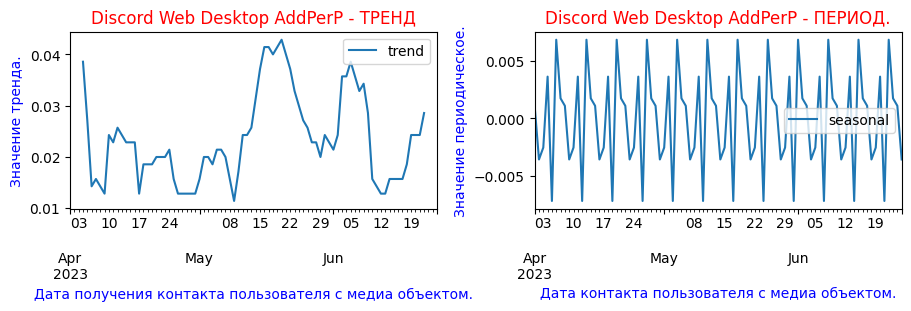

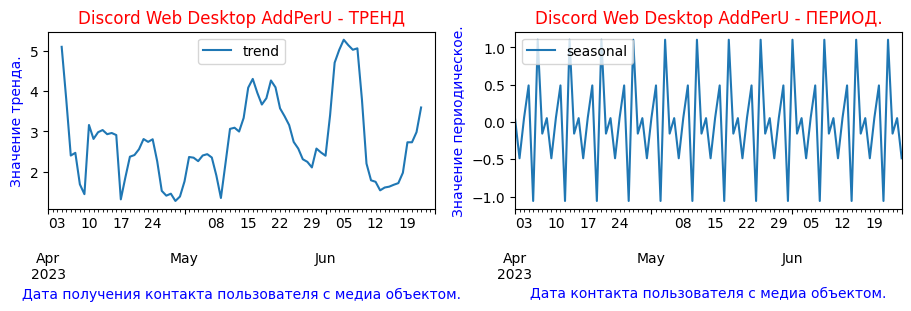

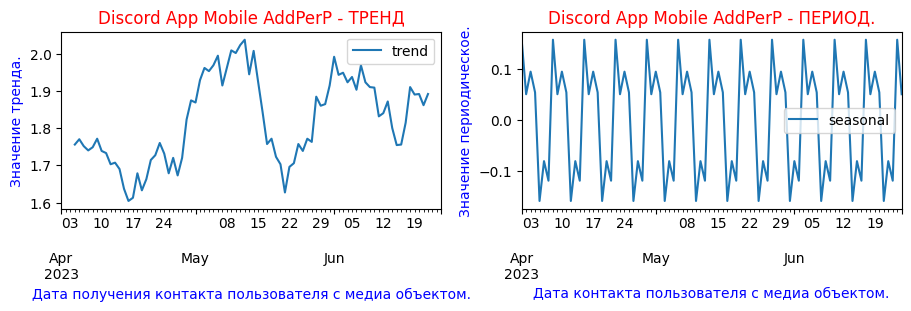

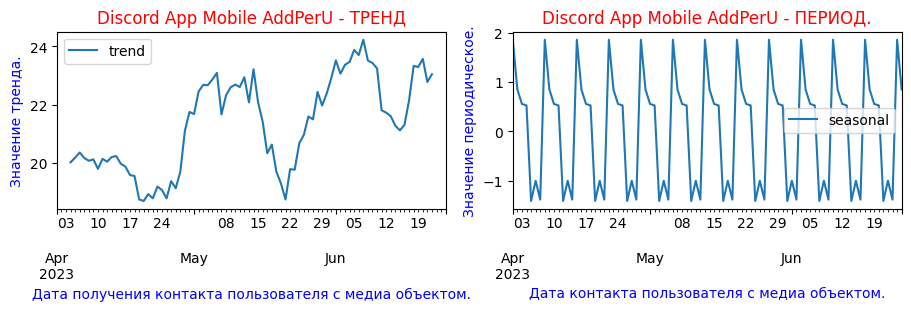

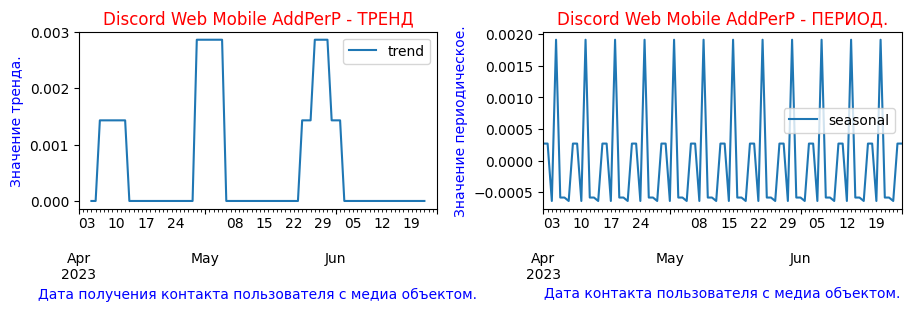

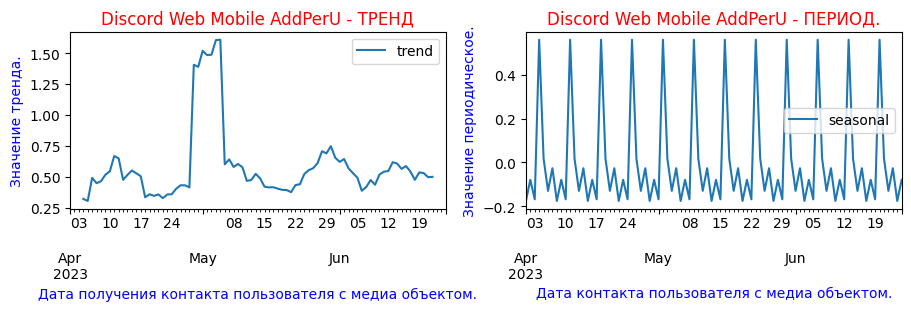

In [152]:
key_dict = 'Discord' # Установим в качестве источника информации 'Discord'.
list_columns = [str(key_dict + ' ' + \
                dict_columns[key_dict][i]) for i in range(6)]

decomposed = trend_seasonality(df_dd_12, key_dict, list_columns)

**Отмечаем**:
* признаков устойчивого **тренда** для всех трёх источников `Discord` не наблюдается;
* замечаем большое отсутствие значений для источника *Discord Web Mobile AddPerP*;
* **периодичность** (или сезонность) для всех трёх источников `Discord`:
    * везде наблюдается `ярко выраженная сезонность, с периодом около недели`. Надо рассмотреть ее подробнее.

**Изучим сезонную (периодическую) составляющую за неделю.**

Дни недели:
23-04-01 - Sat           23-04-02 - Sun           23-04-03 - Mon           23-04-04 - Tue
23-04-05 - Wed           23-04-06 - Thu           23-04-07 - Fri           23-04-08 - Sat
23-04-09 - Sun           23-04-10 - Mon           23-04-11 - Tue           23-04-12 - Wed
23-04-13 - Thu           23-04-14 - Fri           23-04-15 - Sat           23-04-16 - Sun


  0%|          | 0/3 [00:00<?, ?it/s]

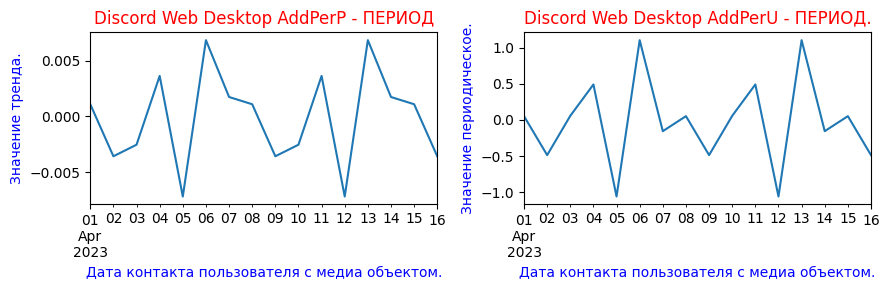

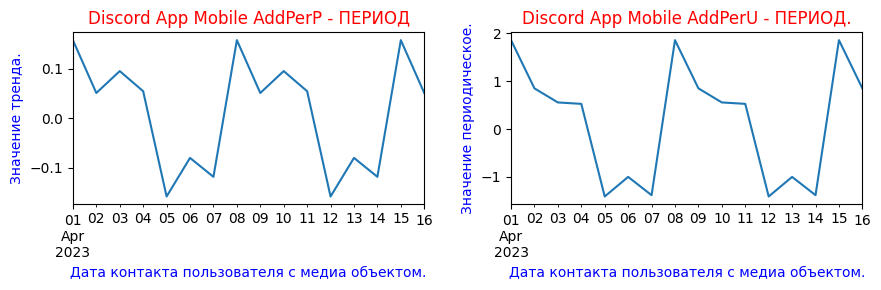

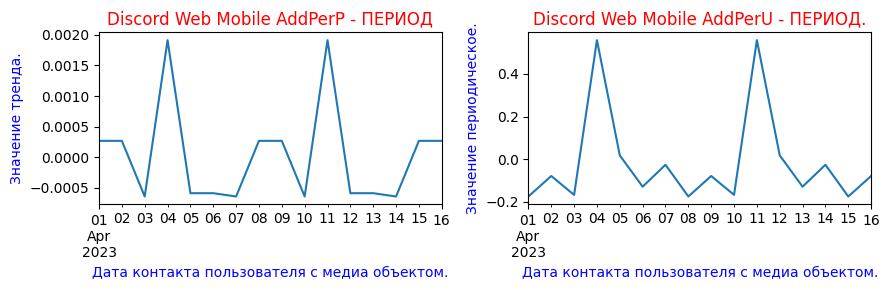

In [153]:
date_start, date_stop = '2023-04-01', '2023-04-16'
 
calc_print_weekday(date_start, date_stop) 
volume_seasonal(df_dd_12, list_columns)

**Отмечаем** периодические закономерности длиной в 1 неделю есть для всех источников. Но их поведение можно объяснить только малыми значениями исследуемых величин.

**Оценка стационарности временного ряда.**

  0%|          | 0/3 [00:00<?, ?it/s]

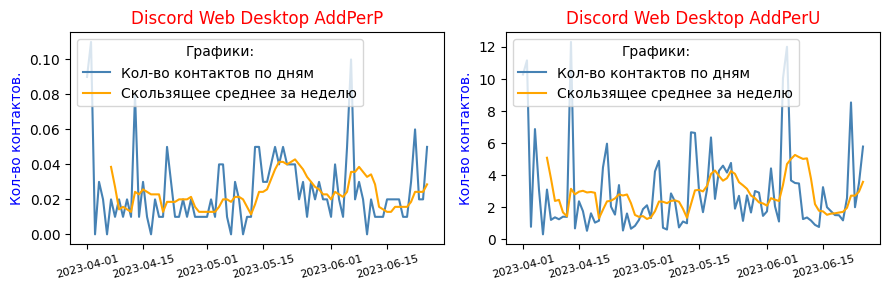

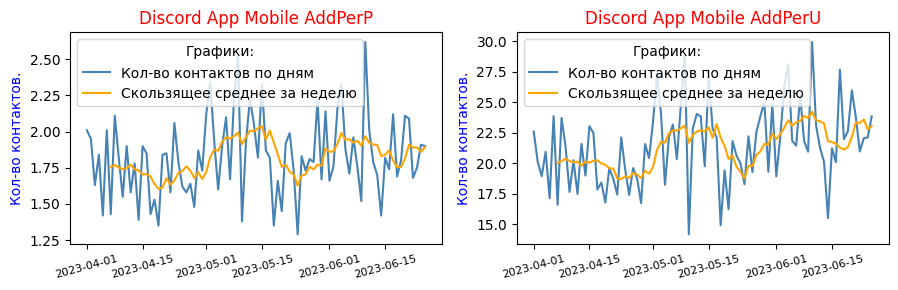

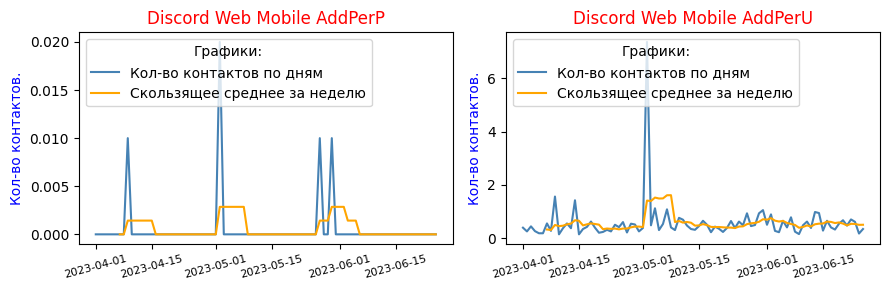

In [154]:
visual_stationarity_6(df_dd_12, list_columns)

**Отмечаем**:
* Отсутствие визуально фиксируемого тренда. Проверим свой вывод о стационарности временных рядов.
* Очень много пропущенных значений для 'Discord Web Mobile AddPerP'.

**Тест `Дики-Фуллера` (Dickey-Fuller test)**.

Используем пороговое значение, равное 0.05 (5%).

In [155]:
# Настроим, чтобы числа в датасетах отражались с 3 знаками после запятой
pd.set_option('display.float_format', '{:.3f}'.format) 

df_test_DF = pd.DataFrame(columns=[
    'source', 'ADF criterion', 'P-value', 'Critical value 1%',
    'Critical values 5%', 'Conclusion'])

# Запуск исполнения теста
test_DF(df_dd_12, list_columns)

# Просмотр датафрейма с результатами
display(df_test_DF) 

# Удалим ненужный более датафрейм
del df_test_DF

,source,ADF criterion,P-value,Critical value 1%,Critical values 5%,Conclusion
0,Discord Web Desktop AddPerP,-7.582,0.000,-3.510,-2.896,Стационарен.
1,Discord Web Desktop AddPerU,-7.570,0.000,-3.510,-2.896,Стационарен.
2,Discord App Mobile AddPerP,-8.804,0.000,-3.510,-2.896,Стационарен.
3,Discord App Mobile AddPerU,-1.857,0.353,-3.516,-2.899,НЕ стационарен!
4,Discord Web Mobile AddPerP,-9.519,0.000,-3.510,-2.896,Стационарен.
5,Discord Web Mobile AddPerU,-9.451,0.000,-3.510,-2.896,Стационарен.


**Промежуточные выводы** для всех шести источников 'Discord':
* Тест предполагает тренд в *Discord App Mobile AddPerU* по возрастной категории 'от 12 до 24 лет'.
* Остальные источники тренда не имеют.
* Большое отсутствие значений для источника *Discord Web Mobile AddPerP*;
* **периодичность** (или сезонность) для всех трёх источников `Discord`:
    * везде наблюдается `ярко выраженная сезонность, с периодом около недели`.

#### 4.5.2.3. Наличие трендов и периодичности по данным от `Facebook`.

  0%|          | 0/6 [00:00<?, ?it/s]

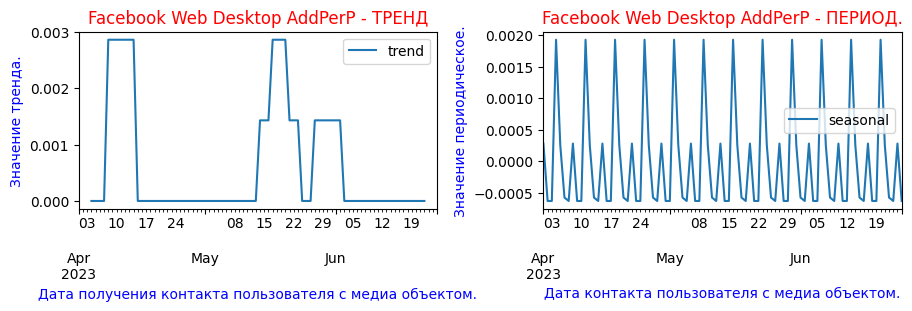

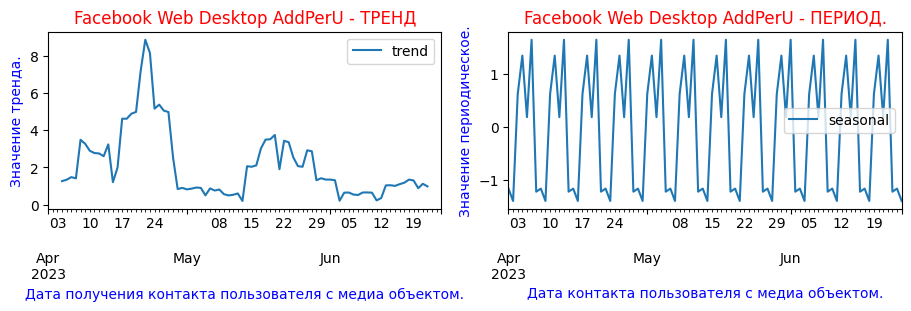

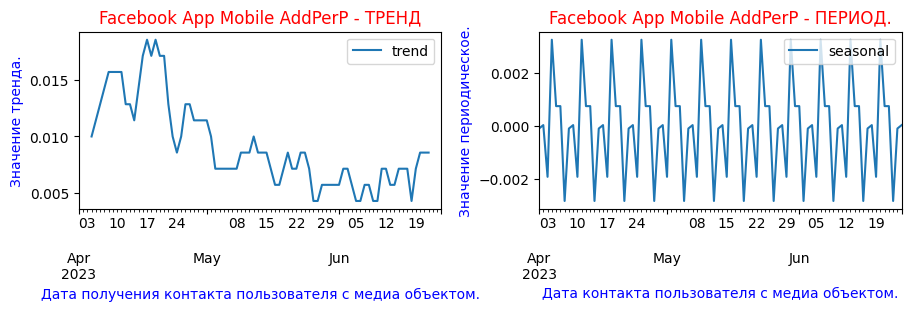

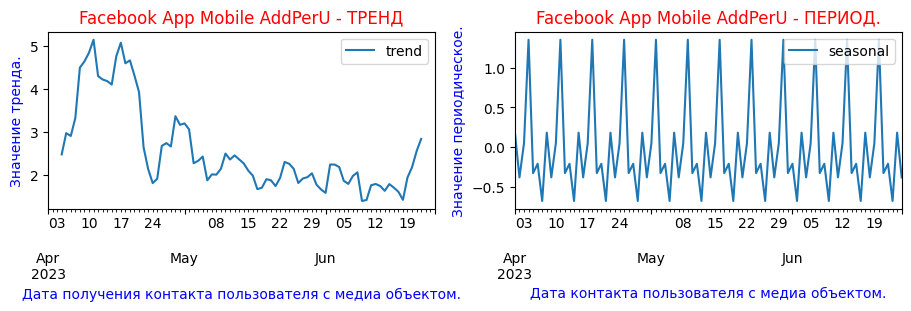

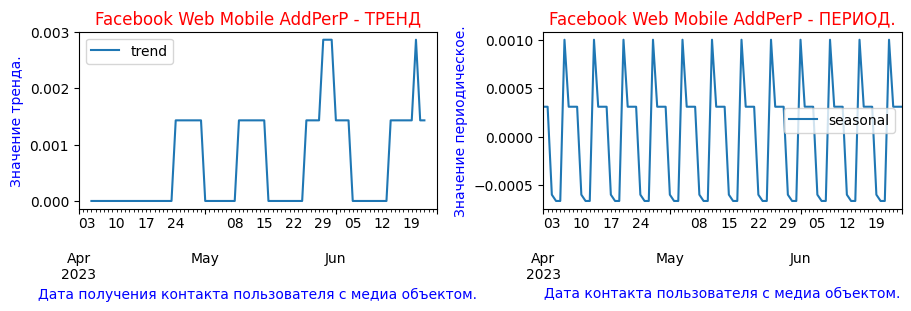

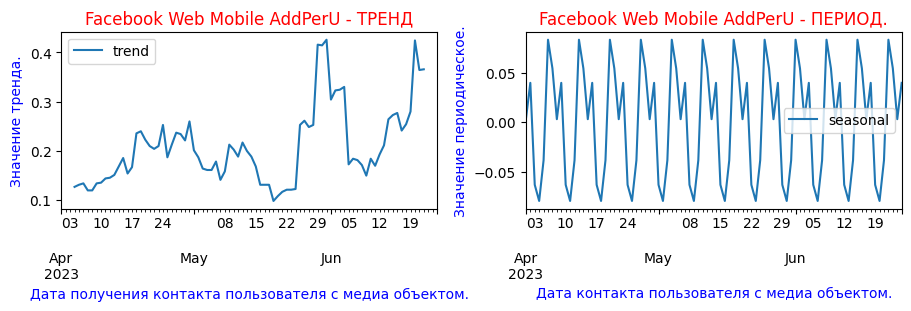

In [156]:
key_dict = 'Facebook' # Установим в качестве источника информации 'Facebook'.
list_columns = [str(key_dict + ' ' + \
                dict_columns[key_dict][i]) for i in range(6)]

decomposed = trend_seasonality(df_dd_12, key_dict, list_columns)

**Отмечаем**:
* похожее на тренд к понижению поведение 'Facebook App Mobile'.
* больщое количество пропусков в 'Facebook Web Desktop' и 'Facebook Web Mobile', а те, что есть имеют очень малую величину.

**Изучим сезонную (периодическую) составляющую за неделю.**

Дни недели:
23-04-01 - Sat           23-04-02 - Sun           23-04-03 - Mon           23-04-04 - Tue
23-04-05 - Wed           23-04-06 - Thu           23-04-07 - Fri           23-04-08 - Sat
23-04-09 - Sun           23-04-10 - Mon           23-04-11 - Tue           23-04-12 - Wed
23-04-13 - Thu           23-04-14 - Fri           23-04-15 - Sat           23-04-16 - Sun


  0%|          | 0/3 [00:00<?, ?it/s]

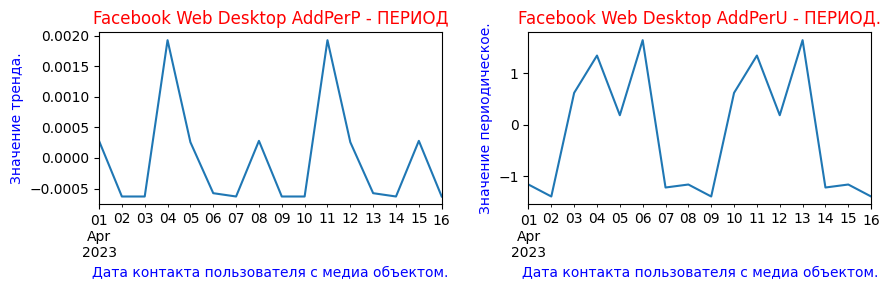

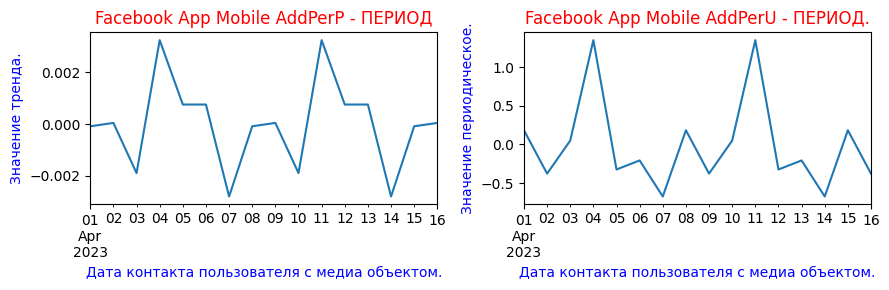

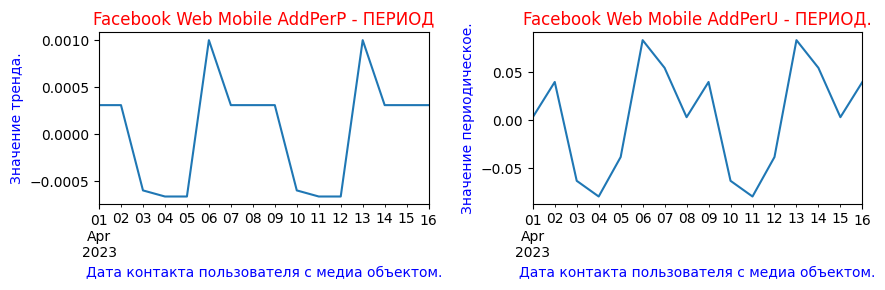

In [157]:
date_start, date_stop = '2023-04-01', '2023-04-16'
 
calc_print_weekday(date_start, date_stop) 
volume_seasonal(df_dd_12, list_columns)

**Отмечаем** для возрастной группы **от 12 до 24 лет** периодические закономерности длиной в 1 неделю есть для всех источников. Но их поведение можно объяснить только малыми значениями исследуемых величин.

**Оценка стационарности временного ряда.**

  0%|          | 0/3 [00:00<?, ?it/s]

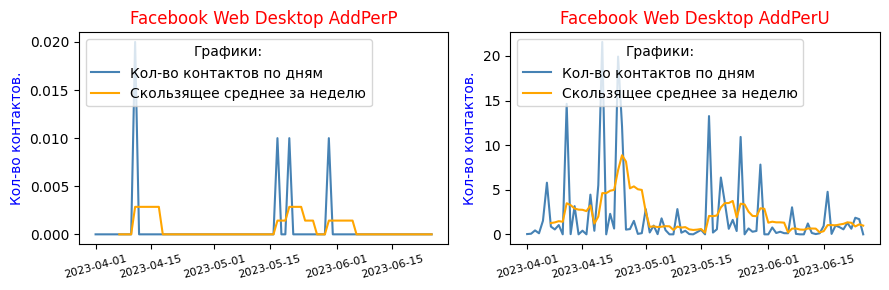

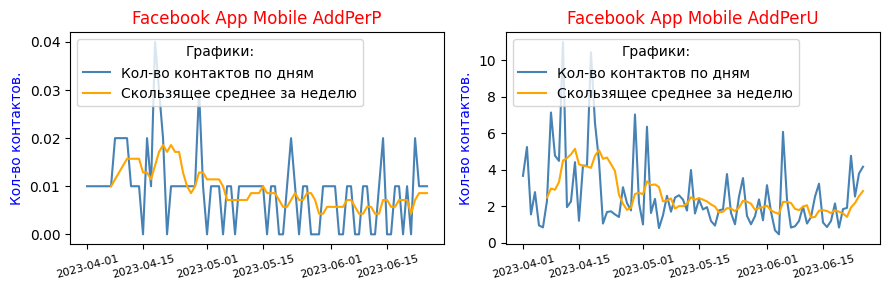

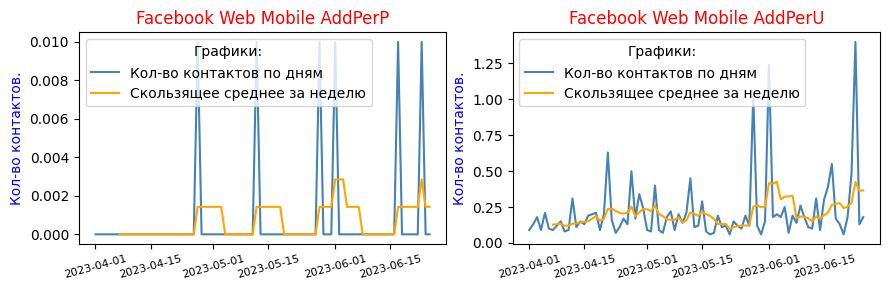

In [158]:
visual_stationarity_6(df_dd_12, list_columns)

**Отмечаем**:
* *Facebook Web Desktop* и *Facebook Web Mobile* в основном заполнен пропусками и имеет очень мало реальных значений;
* малые значения исследуемых значений;
* отсутствие визуально фиксируемого тренда. Проверим вывод о стационарности временных рядов.

**Тест `Дики-Фуллера` (Dickey-Fuller test)**.

Используем пороговое значение, равное 0.05 (5%).

In [159]:
# Настроим, чтобы числа в датасетах отражались с 3 знаками после запятой
pd.set_option('display.float_format', '{:.3f}'.format) 

df_test_DF = pd.DataFrame(columns=[
    'source', 'ADF criterion', 'P-value', 'Critical value 1%',
    'Critical values 5%', 'Conclusion'])

# Запуск исполнения теста
test_DF(df_dd_12, list_columns)

# Просмотр датафрейма с результатами
display(df_test_DF) 

# Удалим ненужный более датафрейм
del df_test_DF

,source,ADF criterion,P-value,Critical value 1%,Critical values 5%,Conclusion
0,Facebook Web Desktop AddPerP,-9.519,0.000,-3.510,-2.896,Стационарен.
1,Facebook Web Desktop AddPerU,-8.519,0.000,-3.510,-2.896,Стационарен.
2,Facebook App Mobile AddPerP,-1.384,0.590,-3.521,-2.901,НЕ стационарен!
3,Facebook App Mobile AddPerU,-7.021,0.000,-3.510,-2.896,Стационарен.
4,Facebook Web Mobile AddPerP,-9.831,0.000,-3.510,-2.896,Стационарен.
5,Facebook Web Mobile AddPerU,-2.059,0.261,-3.515,-2.898,НЕ стационарен!


**Промежуточные выводы** для всех шести источников 'Facebook' по возрастной группе **от 12 до 24 лет**::
* Тест предполагает тренд в источниках:
    * *Facebook App Mobile AddPerP*;
    * *Facebook Web Mobile AddPerU*.
* Остальные источники тренда не имеют.
* Больщое количество пропусков в 'Facebook Web Desktop' и 'Facebook Web Mobile', а те, что есть имеют очень малую величину.
* Для возрастной группы **от 12 до 24 лет** периодические закономерности длиной в 1 неделю есть для всех источников. Но их поведение можно объяснить только малыми значениями исследуемых величин.


In [160]:
# уберем из памяти ненужный более датафрейм.
del df_dd_12

## 4.6. Анализ `Average Daily Duration` по возрастной  категории 'от 55 лет'.

In [161]:
print("Размер полного датафрейма:", df_dd.shape)

df_dd_55 = df_dd[df_dd.age == 55]
if (df_dd.shape[0] / 6 == df_dd_55.shape[0]):
    print("Выделение части датафрейма проведено корректно.")
else:
    print("Произошла потеря данных!")
    
print("Размер датафрейма по возрастной категории 'от 55 лет':", 
      df_dd_55.shape)
df_dd_55.head(3)

Размер полного датафрейма: (516, 20)
Выделение части датафрейма проведено корректно.
Размер датафрейма по возрастной категории 'от 55 лет': (86, 20)


,Date,2gis Web Desktop AddPerP,2gis Web Desktop AddPerU,2gis App Mobile AddPerP,2gis App Mobile AddPerU,2gis Web Mobile AddPerP,2gis Web Mobile AddPerU,Discord Web Desktop AddPerP,Discord Web Desktop AddPerU,Discord App Mobile AddPerP,Discord App Mobile AddPerU,Discord Web Mobile AddPerP,Discord Web Mobile AddPerU,Facebook Web Desktop AddPerP,Facebook Web Desktop AddPerU,Facebook App Mobile AddPerP,Facebook App Mobile AddPerU,Facebook Web Mobile AddPerP,Facebook Web Mobile AddPerU,age
430,2023-04-01,0.000,2.710,0.240,23.710,0.000,0.940,0.010,6.390,0.010,6.810,0.000,0.120,0.050,23.490,0.060,8.220,0.000,0.560,55
431,2023-04-02,0.010,4.620,0.190,17.520,0.000,1.840,0.000,5.440,0.020,20.040,0.000,0.410,0.060,29.210,0.080,14.240,0.000,0.350,55
432,2023-04-03,0.030,7.610,0.120,10.240,0.010,1.770,0.000,4.450,0.010,12.110,0.000,0.150,0.080,29.140,0.040,7.710,0.000,0.260,55


In [162]:
# Для удобства работы с с повторяющимися по функционалу колонками упакуем их к словарь.
dict_columns = {}

list_columns = df_dd_55.columns[1:-1]# Убрали Date и age
for num in range(0, len(list_columns), 6):
    key_dict = list_columns[num].split()[0]
    list_6col = []
    for i in range(6):
        list_6col.append(" ".join(list_columns[num+i].split()[1:]))
    dict_columns[key_dict] = list_6col

### 4.6.1. Графическое представление `Average Daily Duration` по возрастной  категории 'от 55 лет'.

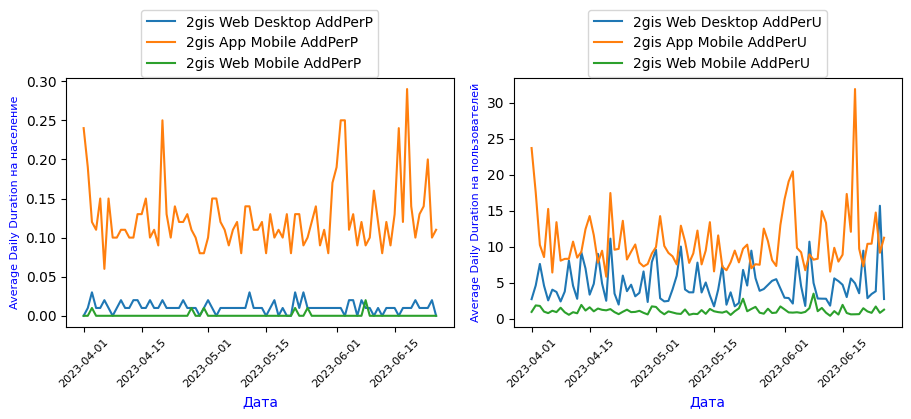

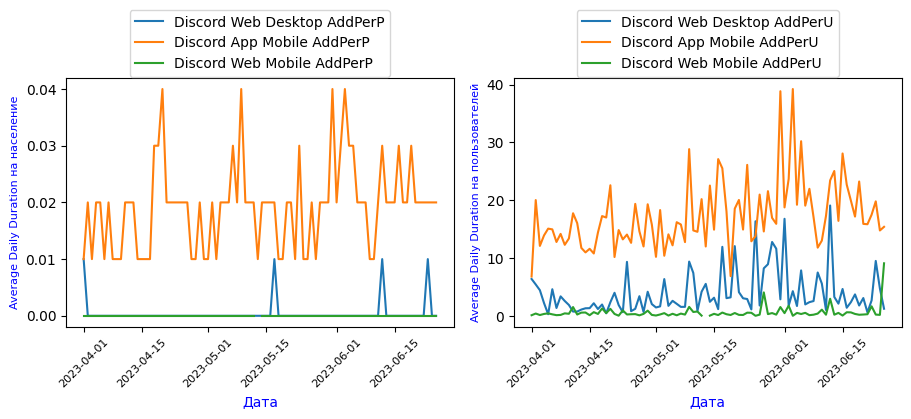

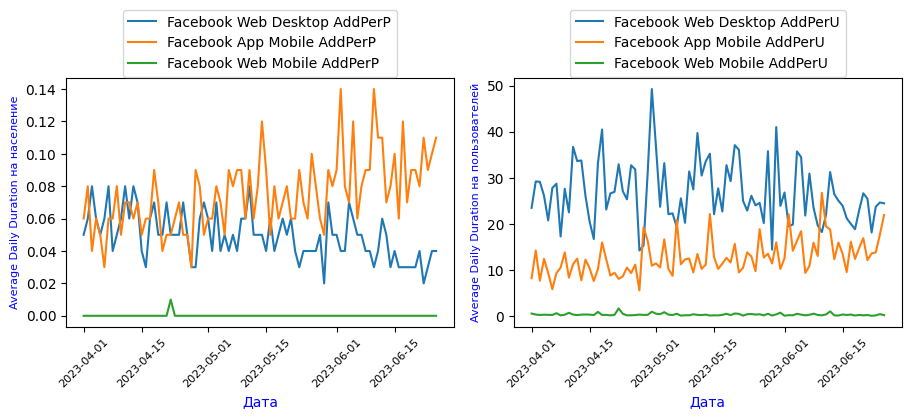

In [163]:
# Изобразим на графиках `Average Daily Duration` 
# данные о возрастной категории 'от 12 до 24 лет'.
for k_6col, v_6cols in dict_columns.items():
    plot_average_daily_duration(df_dd_55, k_6col, v_6cols)

**Отмечаем**:
* устойчивые тренды могут быть только для источника 'Facebook App Mobile' и 'Facebook Web Desktop', для остальных источников тенденции не наблюдаются;
* Присутствуют аномальные высокие выбросы, свидетельствующие о повышении интереса к какой-то определённой теме, сопровождающийся увеличением времени контакта с медиа объектом;
* В источниках '2gis Web Mobile AddPerP' и 'Facebook Web Mobile AppPerP' очень много пропущенных значений (NULL).
* В 'Discord Web Mobile AddPerP' все значения пропущены, реальных значений нет.
* Очень малые значения для 'Discord App Mobile AddPerP' и 'Discord Web Desktop AddPerP'.

### 4.6.2. Анализ на наличие трендов и сезонности `Average Daily Duration` по возрастной категории 'от 55 лет'.

#### 4.6.2.1. Наличие трендов и периодичности по данным от `2gis`.

  0%|          | 0/6 [00:00<?, ?it/s]

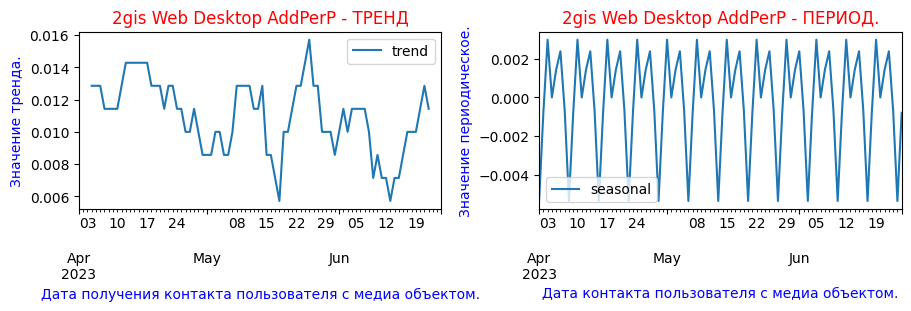

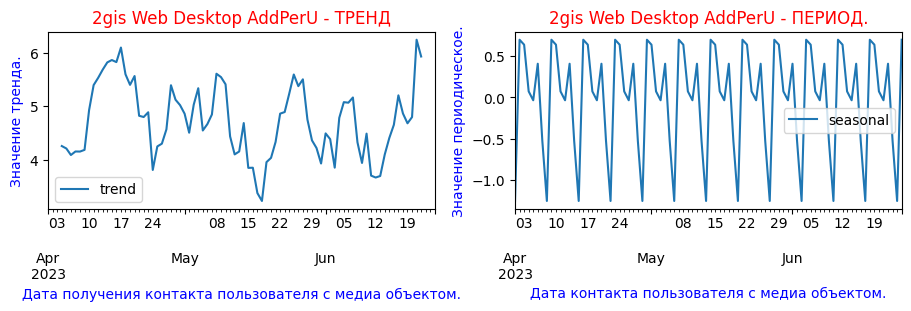

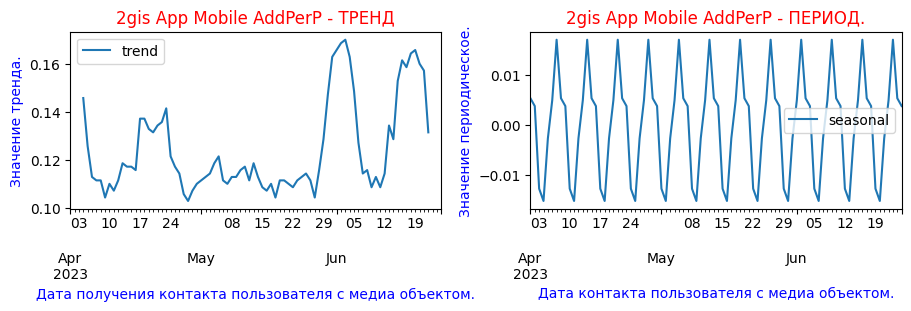

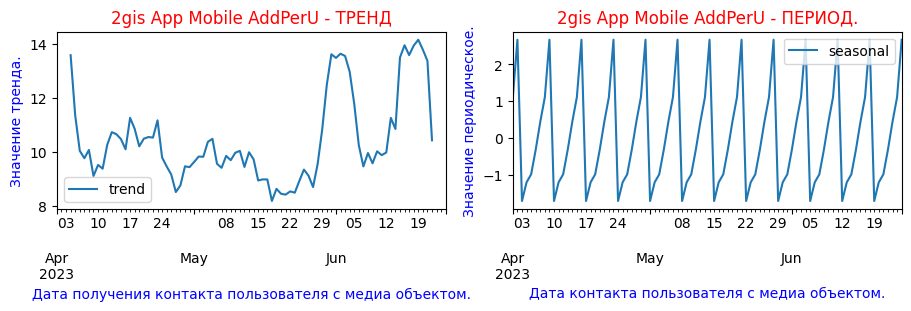

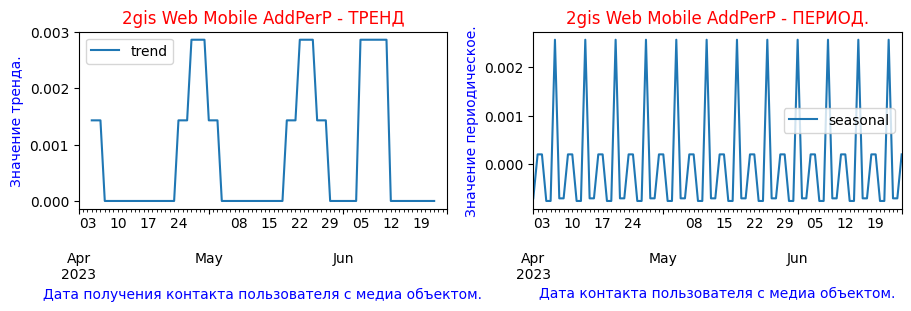

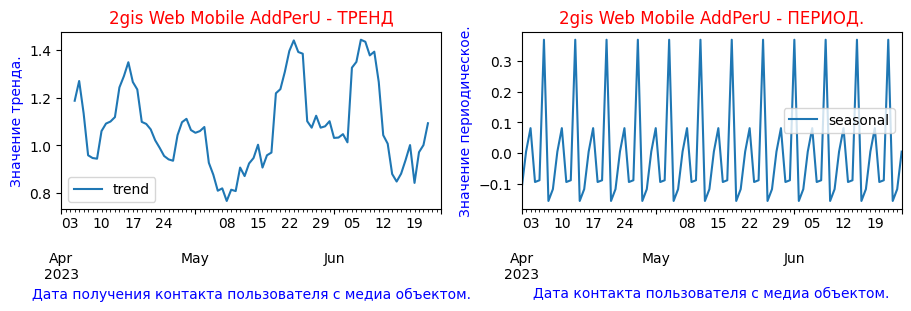

In [164]:
key_dict = '2gis' # Установим в качестве источника информации '2gis'.
list_columns = [str(key_dict + ' ' + \
                dict_columns[key_dict][i]) for i in range(6)]

decomposed = trend_seasonality(df_dd_55, key_dict, list_columns)

**Отмечаем**:
* визуально невозможно установить устойчивые тренды для всех источников;
* необъяснимое их поведение объясняется малыми значениями исследуемых параметров;
* **периодичность** (или сезонность) для всех трёх источников `2gis`:
    * везде наблюдается `ярко выраженная сезонность, с периодом около недели`. Надо рассмотреть ее подробнее.

**Изучим сезонную (периодическую) составляющую за неделю.**

Дни недели:
23-04-01 - Sat           23-04-02 - Sun           23-04-03 - Mon           23-04-04 - Tue
23-04-05 - Wed           23-04-06 - Thu           23-04-07 - Fri           23-04-08 - Sat
23-04-09 - Sun           23-04-10 - Mon           23-04-11 - Tue           23-04-12 - Wed
23-04-13 - Thu           23-04-14 - Fri           23-04-15 - Sat           23-04-16 - Sun


  0%|          | 0/3 [00:00<?, ?it/s]

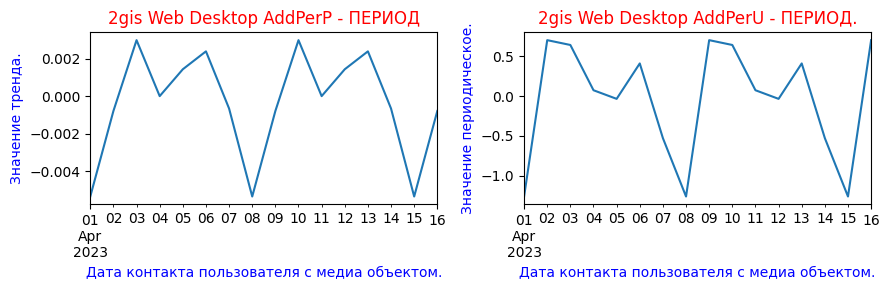

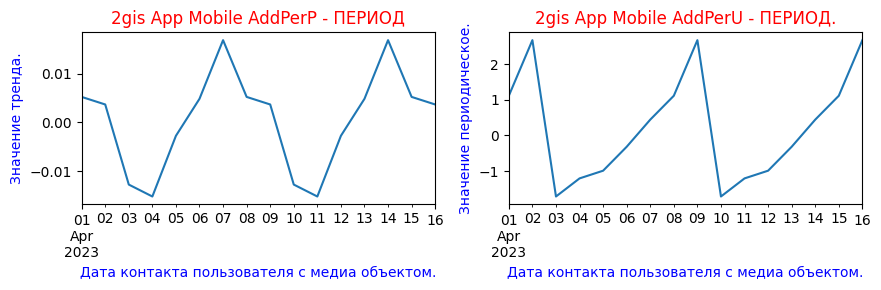

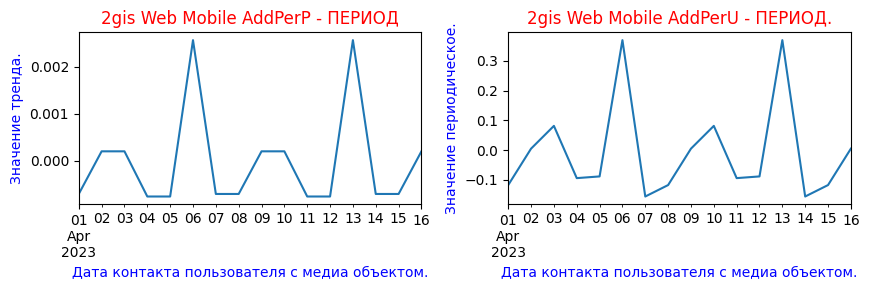

In [165]:
date_start, date_stop = '2023-04-01', '2023-04-16'
 
calc_print_weekday(date_start, date_stop) 
volume_seasonal(df_dd_55, list_columns)

**Отмечаем**:
* Закономерности есть, но их сложно понять из-за малой величины аналитического сигнала.

**Оценка стационарности временного ряда.**

Оценку стационарности проведём в способами:
* `визуально`,
* применив тест `Дики-Фуллера`.

  0%|          | 0/3 [00:00<?, ?it/s]

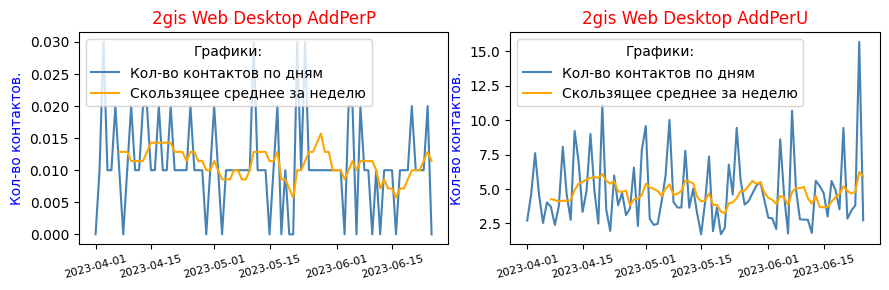

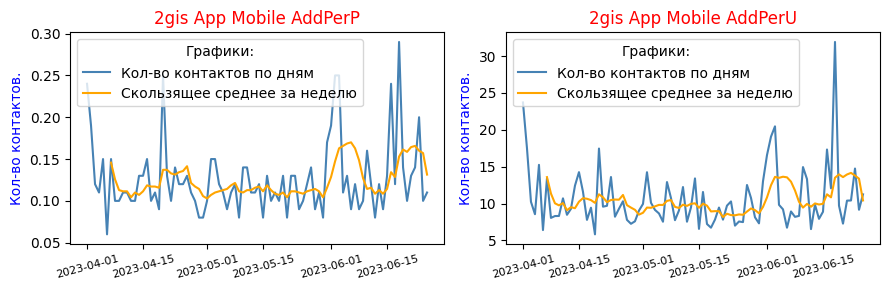

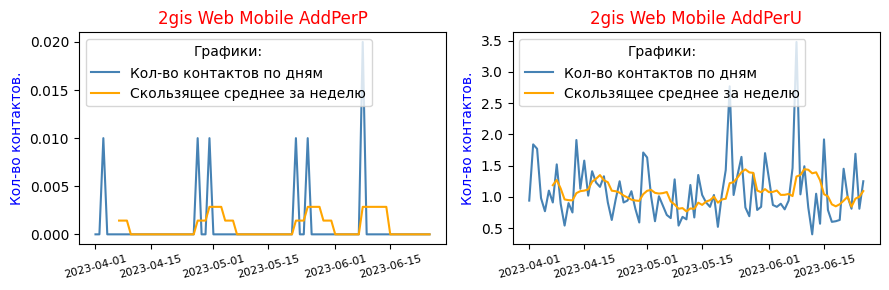

In [166]:
visual_stationarity_6(df_dd_55, list_columns)

**Отмечаем**:
* устойчивых трендов не наблюдается;
* Большое количество пропущенных значений для `2gis Web Desktop` и `2gis Web Mobile`.

**Тест `Дики-Фуллера` (Dickey-Fuller test)**.

Используем пороговое значение, равное 0.05 (5%).

In [167]:
# Настроим, чтобы числа в датасетах отражались с 3 знаками после запятой
pd.set_option('display.float_format', '{:.3f}'.format) 

df_test_DF = pd.DataFrame(columns=[
    'source', 'ADF criterion', 'P-value', 'Critical value 1%',
    'Critical values 5%', 'Conclusion'])

# Запуск исполнения теста
test_DF(df_dd_55, list_columns)

# Просмотр датафрейма с результатами
display(df_test_DF) 

# Удалим ненужный более датафрейм
del df_test_DF

,source,ADF criterion,P-value,Critical value 1%,Critical values 5%,Conclusion
0,2gis Web Desktop AddPerP,-10.255,0.000,-3.510,-2.896,Стационарен.
1,2gis Web Desktop AddPerU,-8.486,0.000,-3.511,-2.897,Стационарен.
2,2gis App Mobile AddPerP,-7.770,0.000,-3.510,-2.896,Стационарен.
3,2gis App Mobile AddPerU,-8.195,0.000,-3.510,-2.896,Стационарен.
4,2gis Web Mobile AddPerP,-9.757,0.000,-3.510,-2.896,Стационарен.
5,2gis Web Mobile AddPerU,-8.365,0.000,-3.510,-2.896,Стационарен.


**Промежуточные выводы** для всех шести источников '2gis':
* Для всех источников информации тест Дики-Фуллера предлагает отсутствие устойчивых тенденций.
* В источниках '2gis Web Desktop' и '2gis Web Mobile' очень много пропущенных значений (NULL).
* Фиксирую периодические закономерности на длительности в 1 неделю.

#### 4.6.2.2. Наличие трендов и периодичности по данным от `Discord`.

  0%|          | 0/6 [00:00<?, ?it/s]

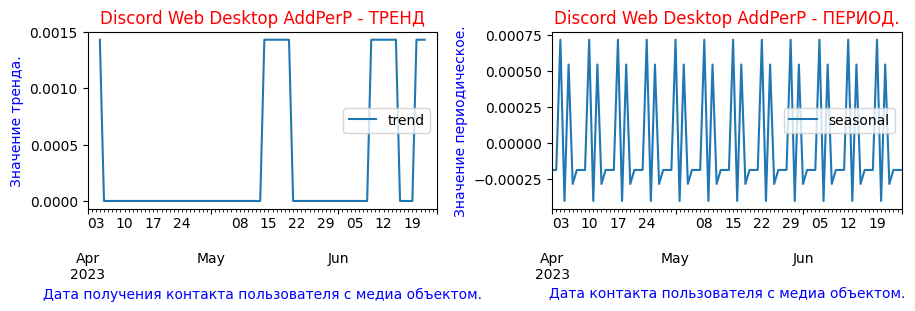

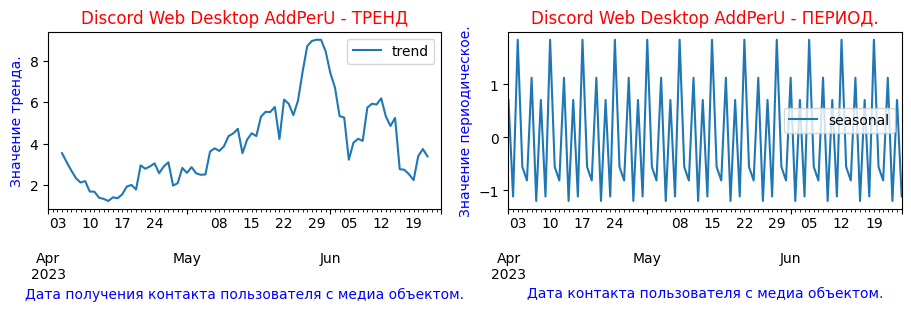

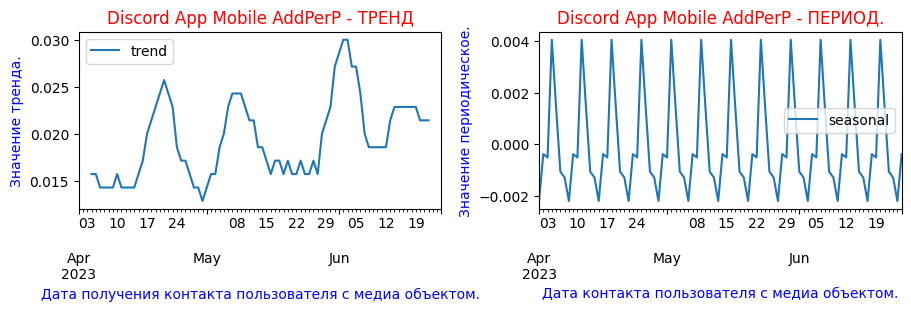

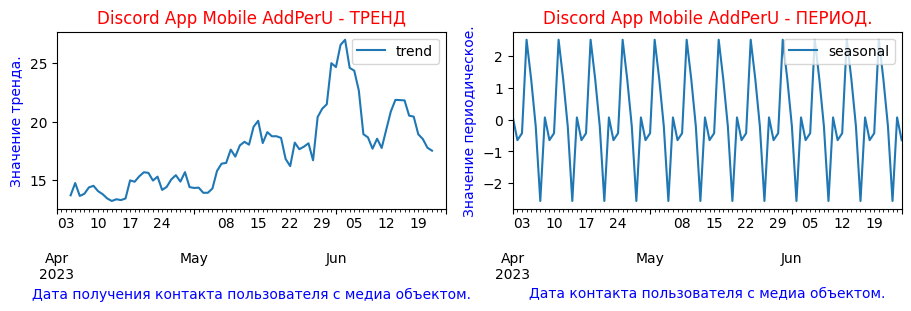

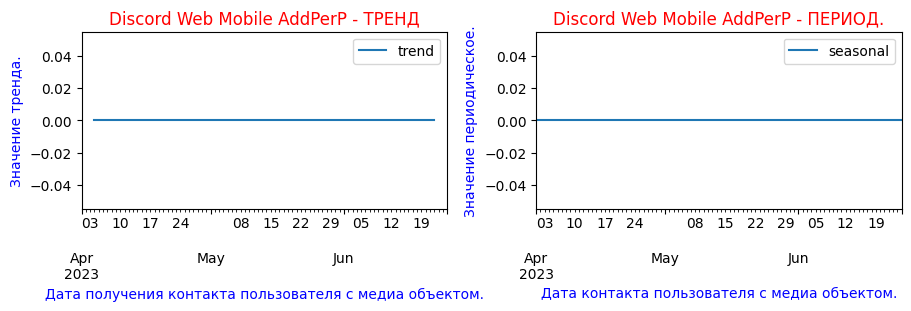

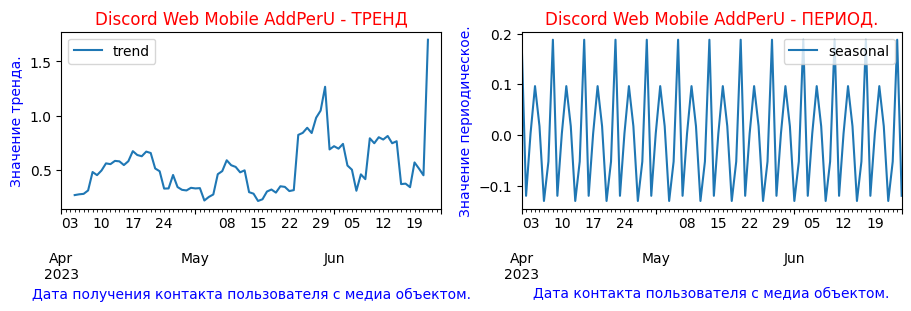

In [168]:
key_dict = 'Discord' # Установим в качестве источника информации 'Discord'.
list_columns = [str(key_dict + ' ' + \
                dict_columns[key_dict][i]) for i in range(6)]

decomposed = trend_seasonality(df_dd_55, key_dict, list_columns)

**Отмечаем**:
* признаков устойчивого **тренда** для всех трёх источников `Discord` не наблюдается;
* замечаем большое отсутствие значений для источника *Discord Web Mobile*;
* **периодичность** (или сезонность) для всех трёх источников `Discord`:
    * везде наблюдается `ярко выраженная сезонность, с периодом около недели`. Надо рассмотреть ее подробнее.

**Изучим сезонную (периодическую) составляющую за неделю.**

Дни недели:
23-04-01 - Sat           23-04-02 - Sun           23-04-03 - Mon           23-04-04 - Tue
23-04-05 - Wed           23-04-06 - Thu           23-04-07 - Fri           23-04-08 - Sat
23-04-09 - Sun           23-04-10 - Mon           23-04-11 - Tue           23-04-12 - Wed
23-04-13 - Thu           23-04-14 - Fri           23-04-15 - Sat           23-04-16 - Sun


  0%|          | 0/3 [00:00<?, ?it/s]

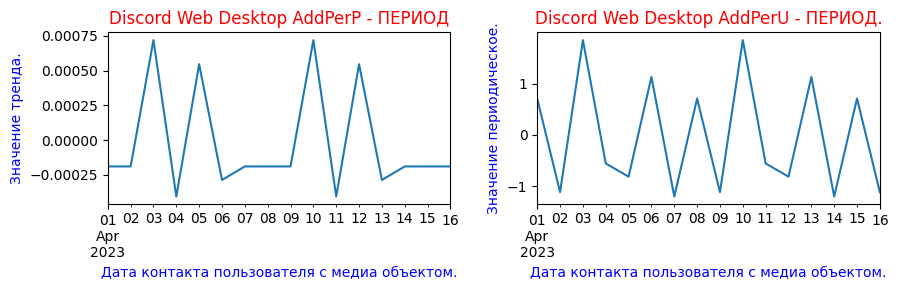

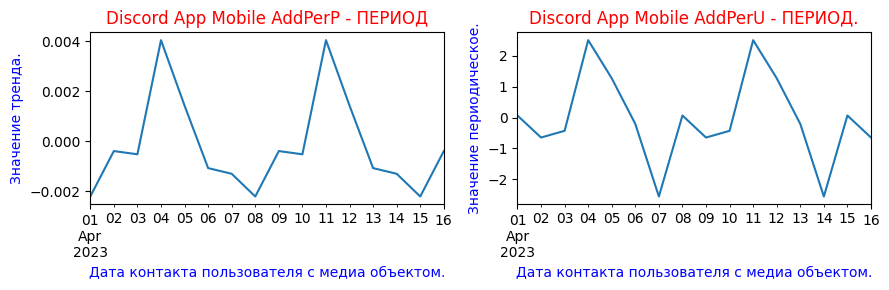

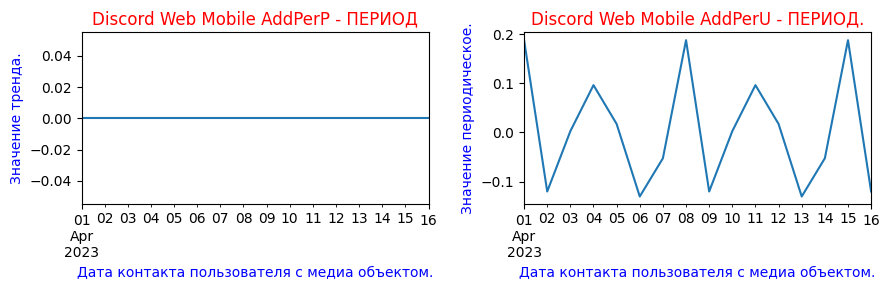

In [169]:
date_start, date_stop = '2023-04-01', '2023-04-16'
 
calc_print_weekday(date_start, date_stop) 
volume_seasonal(df_dd_55, list_columns)

**Отмечаем** периодические закономерности длиной в 1 неделю есть для всех источников. Но их поведение можно объяснить только малыми значениями исследуемых величин.

**Оценка стационарности временного ряда.**

  0%|          | 0/3 [00:00<?, ?it/s]

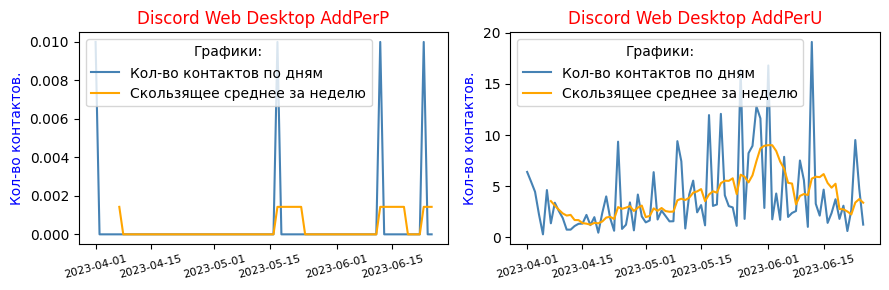

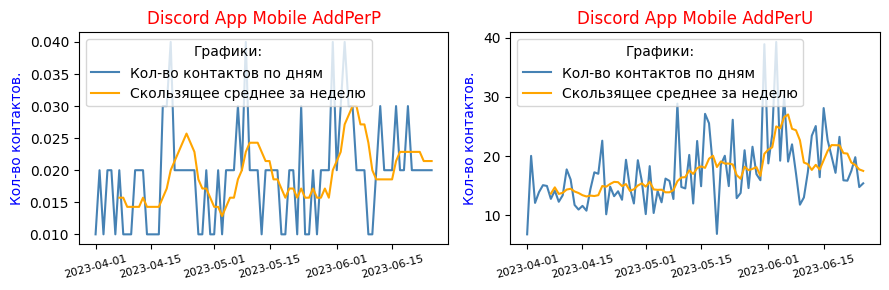

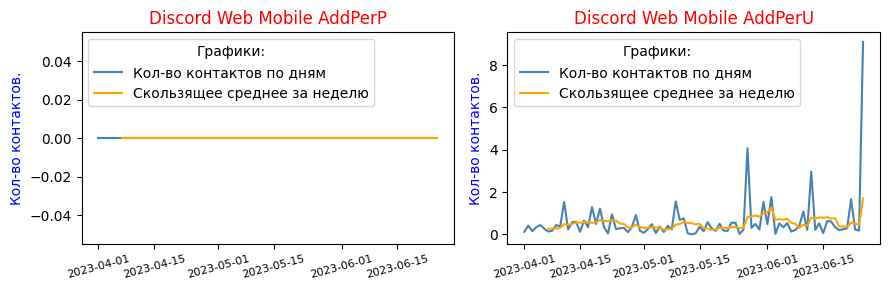

In [170]:
visual_stationarity_6(df_dd_55, list_columns)

**Отмечаем**:
* Отсутствие визуально фиксируемого тренда. Проверим свой вывод о стационарности временных рядов.
* Очень малые значения исследуемых величин.
* Полностью пропущены значения для 'Discord Web Mobile AddPerP'.

**Тест `Дики-Фуллера` (Dickey-Fuller test)**.

Используем пороговое значение, равное 0.05 (5%).

In [171]:
# Настроим, чтобы числа в датасетах отражались с 3 знаками после запятой
pd.set_option('display.float_format', '{:.3f}'.format) 

df_test_DF = pd.DataFrame(columns=[
    'source', 'ADF criterion', 'P-value', 'Critical value 1%',
    'Critical values 5%', 'Conclusion'])

# Запуск исполнения теста
test_DF(df_dd_55, list_columns)

# Просмотр датафрейма с результатами
display(df_test_DF) 

# Удалим ненужный более датафрейм
del df_test_DF

,source,ADF criterion,P-value,Critical value 1%,Critical values 5%,Conclusion
0,Discord Web Desktop AddPerP,-10.853,0.000,-3.510,-2.896,Стационарен.
1,Discord Web Desktop AddPerU,-1.424,0.571,-3.521,-2.901,НЕ стационарен!
2,Discord App Mobile AddPerP,-4.276,0.000,-3.513,-2.897,Стационарен.
3,Discord App Mobile AddPerU,-2.901,0.045,-3.512,-2.897,Стационарен.
4,Discord Web Mobile AddPerP,NaN,NaN,-3.510,-2.896,НЕ стационарен!
5,Discord Web Mobile AddPerU,-6.162,0.000,-3.510,-2.896,Стационарен.


**Промежуточные выводы** для всех шести источников 'Discord':
* Тест предполагает тренд в *'Discord Web Desktop AddPerU'* и *Discord Web Mobile AddPerP* по возрастной категории 'от 55 лет'.
* Остальные источники тренда не имеют.
* * Полностью пропущены значения для 'Discord Web Mobile AddPerP'.
* **периодичность** (или сезонность) для всех трёх источников `Discord`:
    * везде наблюдается `ярко выраженная сезонность, с периодом около недели`.

#### 4.6.2.3. Наличие трендов и периодичности по данным от `Facebook`.

  0%|          | 0/6 [00:00<?, ?it/s]

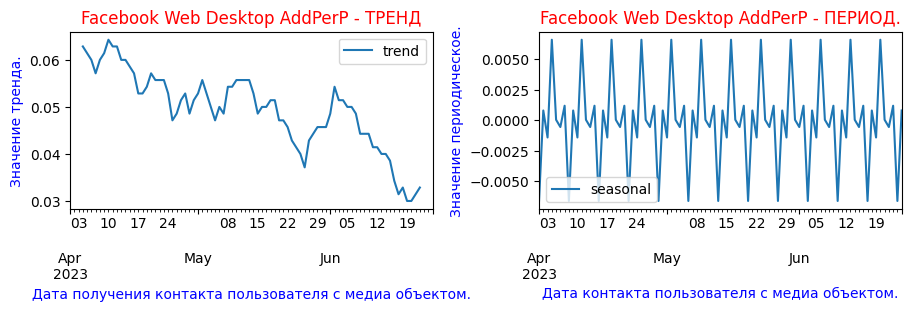

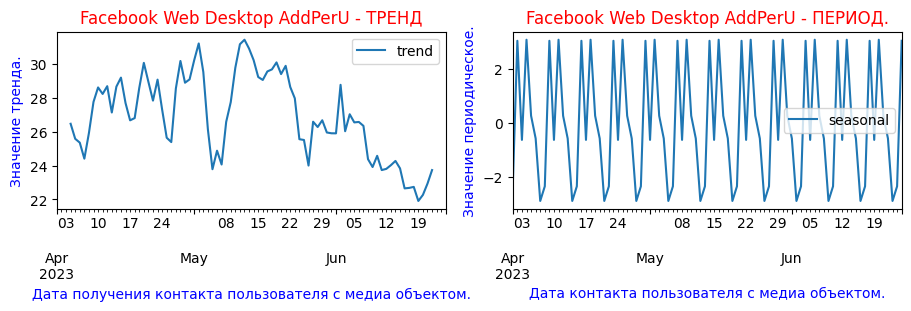

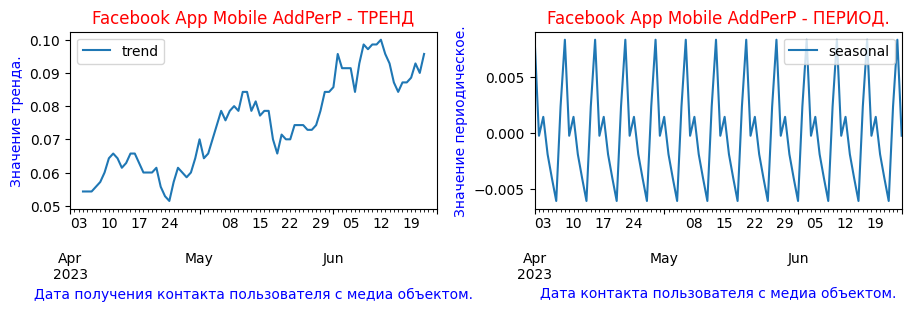

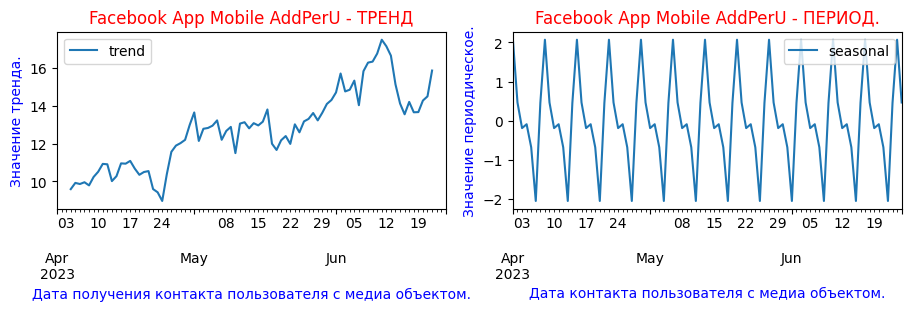

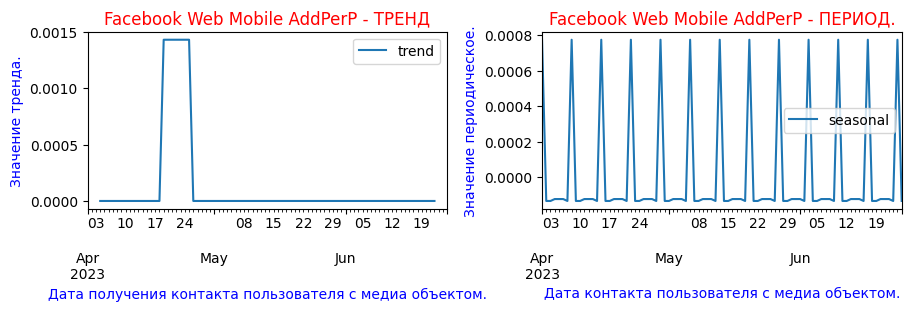

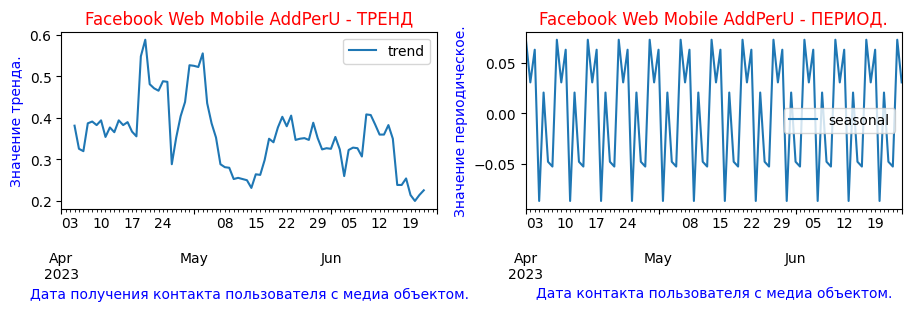

In [172]:
key_dict = 'Facebook' # Установим в качестве источника информации 'Facebook'.
list_columns = [str(key_dict + ' ' + \
                dict_columns[key_dict][i]) for i in range(6)]

decomposed = trend_seasonality(df_dd_55, key_dict, list_columns)

**Отмечаем**:
* возможны тренды:
    * к понижению 'Facebook Web Desktop AddPerP';
    * к повышению 'Facebook App Mobile AddPerP' и 'Facebook App Mobile AddPerU';
* большое количество пропусков в 'Facebook Web Mobile AddPerP', а те, что есть имеют очень малую величину.
* периодичность для всех источников продолжительностью около 1 недели.

**Изучим сезонную (периодическую) составляющую за неделю.**

Дни недели:
23-04-01 - Sat           23-04-02 - Sun           23-04-03 - Mon           23-04-04 - Tue
23-04-05 - Wed           23-04-06 - Thu           23-04-07 - Fri           23-04-08 - Sat
23-04-09 - Sun           23-04-10 - Mon           23-04-11 - Tue           23-04-12 - Wed
23-04-13 - Thu           23-04-14 - Fri           23-04-15 - Sat           23-04-16 - Sun


  0%|          | 0/3 [00:00<?, ?it/s]

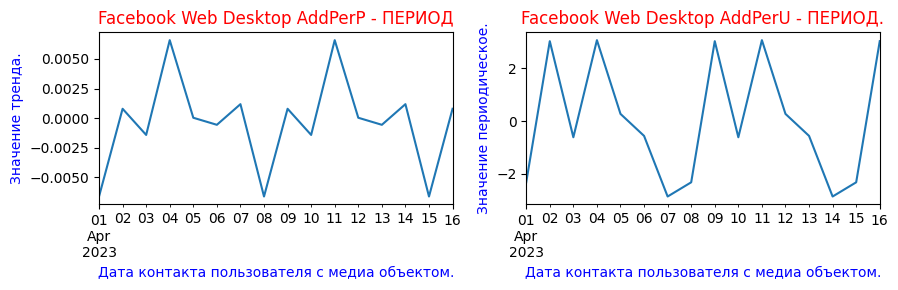

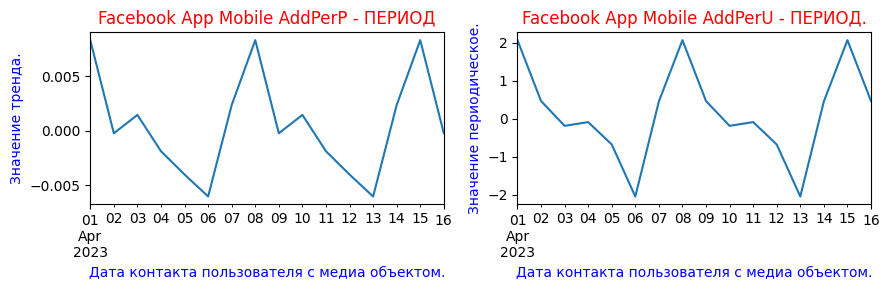

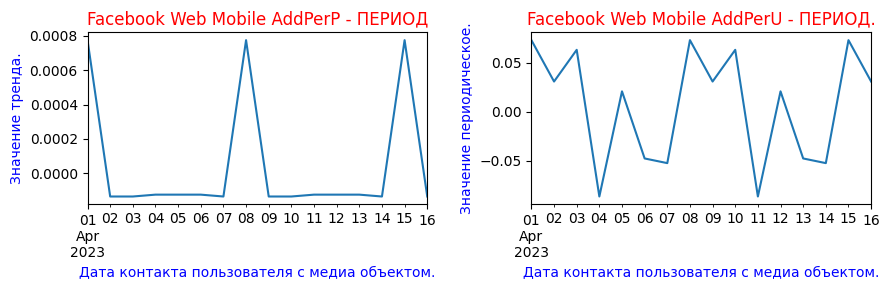

In [173]:
date_start, date_stop = '2023-04-01', '2023-04-16'
 
calc_print_weekday(date_start, date_stop) 
volume_seasonal(df_dd_55, list_columns)

**Отмечаем** для возрастной группы **от 55 лет** периодические закономерности длиной в 1 неделю есть для всех источников. Но их поведение можно объяснить только малыми значениями исследуемых величин.

**Оценка стационарности временного ряда.**

  0%|          | 0/3 [00:00<?, ?it/s]

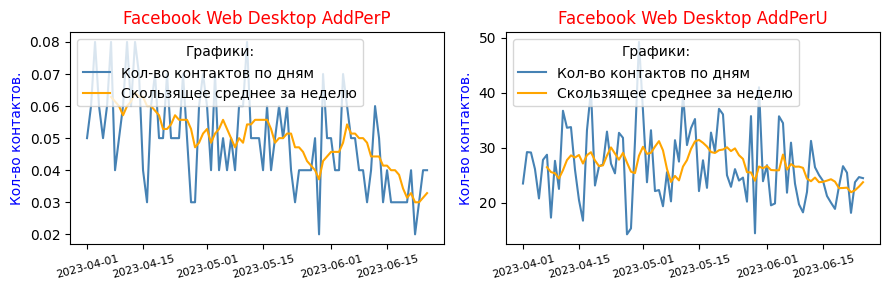

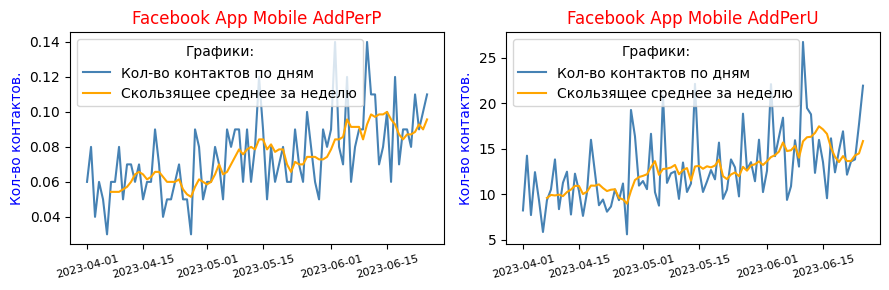

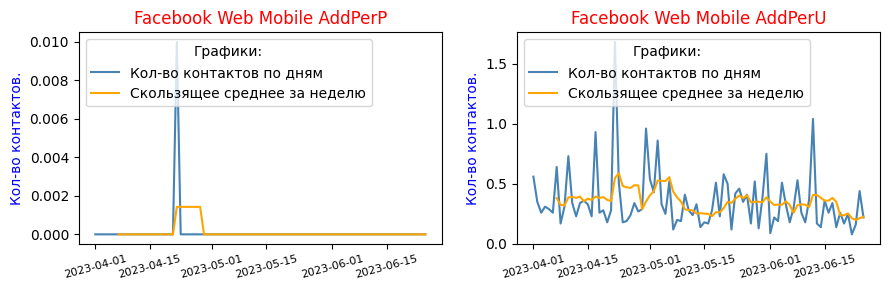

In [174]:
visual_stationarity_6(df_dd_55, list_columns)

**Отмечаем**:
* возможные устойчивые закономерности в данных от:
    * *Facebook Web Desktop AddPerP*;
    * *Facebook App Mobile AddPerP* и *Facebook App Mobile AddPerU*;
* очень мало реальных значений у *Facebook Web Mobile AddPerP*.    

**Тест `Дики-Фуллера` (Dickey-Fuller test)**.

Используем пороговое значение, равное 0.05 (5%).

In [ ]:
# Настроим, чтобы числа в датасетах отражались с 3 знаками после запятой
pd.set_option('display.float_format', '{:.3f}'.format) 

df_test_DF = pd.DataFrame(columns=[
    'source', 'ADF criterion', 'P-value', 'Critical value 1%',
    'Critical values 5%', 'Conclusion'])

# Запуск исполнения теста
test_DF(df_dd_55, list_columns)

# Просмотр датафрейма с результатами
display(df_test_DF) 

# Удалим ненужный более датафрейм
del df_test_DF

**Промежуточные выводы** для всех шести источников 'Facebook' по возрастной группе **от 55 лет**:
* Тест предполагает тренд в *Facebook App Mobile AddPerP*.
* Остальные источники тренда не имеют.
* Большое количество пропусков в 'Facebook Web Mobile AddPerP', а те, что есть имеют очень малую величину.

In [175]:
# уберем из памяти ненужный более датафрейм.
del df_dd_55


<hr style='border:2px solid #460073'> </hr>
<h1 style='color: #460073'>5. Итоговые выводы.</h1> 
<hr style='border:2px solid #460073'> </hr>

**По результатам исследования можно отметить следующие факты и сделать приводимые ниже выводы:**
    
1. Для проведения исследования получены данные, накопленные в период 2023-04-01 по 2023-06-25.
2. В файле `Daily_Duration` находятся примерно 516 записей и 152 признака.  
3. Все данные разбиты на возрастные группы:
    * до 12 лет,
    * 12 - 24 года,
    * 25 - 34 года,
    * 35 - 44 года,
    * 45 - 54 года,
    * от 55 и старше.
4. Провёл первичную обработку данных.
5. В связи с большим количеством источников информации (25, создающих 150 признаков) аудитории диджитал-ресурсов среди населения России и с связи с демонстрационой целью данной работы, **ограничился ТРЕМЯ первыми по списку ресурсами**. Остальные признаки удалил. 
6. Согласно задания на проект:
    * провёл EDA анализ;
    * **для различных возрастных групп**:
        * суммарно по всем возрастным группам,
        * группа до 12 лет,
        * группа от 12 до 24 лет,
        * группа свыше 55 лет    
    изучил наличие трендов и периодичности как визуально, так и применяя метод **Дики-Фуллера (Dickey-Fuller test)** для оценки стационарности временных рядов.
7. Отметил следующие закономерности по сумме всех возрастных категорий:
* Для некоторых источников с *Web Desktop*  в интервале 22-29 мая имеется чётко выраженный максимум. Этому могут быть разные причины, например, выпускники школ искали результаты ЕГЭ, люди выбирали, как провести летний отпуск, ...
* *App Mobile* имеет тенденцию к повышению с середины мая и до самого конца наблюжений в конце июня. Люди интерсуются, как провести лето!
* *Web Mobile* на первый взгляд имеет максимум в апреле, но если сравнить в абсолютных единицах с указанными выше источниками, то оказывается, это незначительный всплеск.
* Активность запросов *Web Desktop (ПК и ноутбуки)* пропадает в выходные дни, резко возрастает в понедельник и падает только в субботу. Скорее всего, люди пользуются диджитал-ресурсами в рабочее время (возможно на работе).
* *Web Mobile (мобильный браузер)*. Наблюдается минимум в воскресенье, показатели активности в рабочие дни значительно выше. Видимо, люди используют интернет на рабочем месте и для подключения мобильных телефонов.
8. Для детей в возрасте до 12 лет можно отметить:
* Дети используют на ПК и ноутбуках, а также с мобильными приложениями в основном по выходным дням (видимо, из дома. Родители позволяют в выходные). 
* Такой источник данных, как Facebook демонстрирует устойчивый рост продолжительности использования интернет-ресурса детьми в возрасте до 12 лет.
9. Для пользоватей в возрастной группы от 12 ло 24 лет можно отметить:
* выявленный с помощью теста тренд к увеличению времени потребления ресурса в 'Discord App Mobile'.
* Тест предполагает устойчивую закономерность к понижению времени работы с 'Facebook App Mobile'.
10. Для пользоватей в возрастной группы от 55 лет замечено:
* Для всех исследуемых источников информации тест Дики-Фуллера предполагает отсутствие устойчивых тенденций.
* Очень малые значения исследуемых величин.
* возможны тренды:
    * к понижению 'Facebook Web Desktop';
    * к повышению 'Facebook App Mobile'.
11. Зафиксированы периодические закономерности на длительности в 1 неделю по всем источникам и всем возрастным группам.
12. Стоит обратить внимание на очень маленькие значения аналитического сигнала, приводящие к соответствующим статистическим погрешностям.
13. Отмечаю кратковременные повышения время контакта пользователей всех возрастных групп с медиа объектом, свидетельствующие о повышении интереса к какой-то определённой теме и сопровождающиеся увеличением времени контакта с медиа объектом.
14. Для более детального анализа стоит провести более глубокий анализ по ВСЕМ источникам информации и сравнить их для различных возрастных групп пользователей.